In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
tqdm.pandas()

In [2]:
match_lvl_data = pd.read_csv('/Users/alokroy/Documents/Programming/Projects/Amex/data/main/664389efa0868_match_level_scorecard.csv')
batsman_lvl_data = pd.read_csv('/Users/alokroy/Documents/Programming/Projects/Amex/data/main/663e2b548c98c_batsman_level_scorecard.csv')
bowler_lvl_data = pd.read_csv('/Users/alokroy/Documents/Programming/Projects/Amex/data/main/663e2b2c60743_bowler_level_scorecard.csv')
train_data = pd.read_csv('/Users/alokroy/Documents/Programming/Projects/Amex/data/main/663e2b6d54457_train_data_with_samplefeatures.csv')
test_data = pd.read_csv('/Users/alokroy/Documents/Programming/Projects/Amex/data/main/6644a1e287df6_test_data_with_samplefeatures.csv')

In [3]:
## Creating a binary winner column - 0 if team1 wins, else 1
train_data['winner_01'] = train_data.apply(lambda x: 0 if (x['team1']==x['winner']) else 1, axis=1)

## Utility Functions

In [4]:
def giveLastNgamesPlayer(player_id, date, n, bat_or_bowl):
    if bat_or_bowl == 'bat':
        df_topick = batsman_lvl_data
        id_col = 'batsman_id'
    else:
        df_topick = bowler_lvl_data
        id_col = 'bowler_id'

    return df_topick[(df_topick['match_dt']<date)&(df_topick[id_col]==float(player_id))]\
                .sort_values(by='match_dt', ascending=False).head(n)

In [5]:
def calculate_ratio(row, col1, col2):
    value1 = row[col1]
    value2 = row[col2]
    # if value2 == 0:
    #     return value1
    # else:
    #     return value1 / value2
    return (value1+1) / (value2+1)

# Function to add a ratio column for any two columns
def add_ratio_column(df, col1, col2, new_col_name):
    df[new_col_name] = df.apply(lambda row: calculate_ratio(row, col1, col2), axis=1)
    return df

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import pandas as pd

def count_outliers(data, col_name):
    # Calculate Q1, Q3 and IQR
    Q1 = data[col_name].quantile(0.25)
    Q3 = data[col_name].quantile(0.75)
    IQR = Q3 - Q1

    # Identify outliers
    outliers = data[(data[col_name] < (Q1 - 1.5 * IQR)) | (data[col_name] > (Q3 + 1.5 * IQR))]
    num_outliers = len(outliers)
    return num_outliers

def train_test_analysis(train_data, test_data, col_name):

    train_feature = train_data[col_name]
    test_feature = test_data[col_name]

    plt.figure(figsize=(20, 10))

    # Visualizing distributions with histograms
    plt.subplot(2, 3, 1)
    plt.hist(train_feature, bins=30, alpha=0.5, color='blue', label='Train', density=True)
    plt.hist(test_feature, bins=30, alpha=0.5, color='red', label='Test', density=True)
    plt.legend(loc='upper right')
    plt.title('Histogram Comparison')

    # Density plot comparison
    plt.subplot(2, 3, 2)
    sns.kdeplot(train_feature, label='Train', fill=True, color='blue')
    sns.kdeplot(test_feature, label='Test', fill=True, color='red')
    plt.legend()
    plt.title('Density Plot Comparison')

    # Box plot comparison
    plt.subplot(2, 3, 3)
    sns.boxplot(data=[train_feature, test_feature], palette=["blue", "red"])
    plt.xticks([0, 1], ['Train', 'Test'])
    plt.title('Box Plot Comparison')

    # Violin plot comparison
    plt.subplot(2, 3, 4)
    sns.violinplot(data=[train_feature, test_feature], palette=["blue", "red"])
    plt.xticks([0, 1], ['Train', 'Test'])
    plt.title('Violin Plot Comparison')

    # Q-Q plot comparison for train data
    plt.subplot(2, 3, 5)
    stats.probplot(train_feature, dist="norm", plot=plt)
    plt.title('Q-Q Plot for Train Data')

    # Q-Q plot comparison for test data
    plt.subplot(2, 3, 6)
    stats.probplot(test_feature, dist="norm", plot=plt)
    plt.title('Q-Q Plot for Test Data')

    plt.tight_layout()
    plt.show()

    # Statistical test - Kolmogorov-Smirnov Test
    ks_stat, ks_pvalue = stats.ks_2samp(train_feature, test_feature)
    print("======================================= " + "Train-Test Statistics" + " =======================================")
    print(f"\nKolmogorov-Smirnov test result: KS statistic = {ks_stat:.4f}, p-value = {ks_pvalue:.4f}")

    print("\nNumber of outliers in Train: ", count_outliers(train_data, col_name))
    print("\nNumber of outliers in Test: ", count_outliers(test_data, col_name))

    skewness_train = train_data[col_name].skew()
    kurtosis_train = train_data[col_name].kurtosis()
    skewness_test = test_data[col_name].skew()
    kurtosis_test = test_data[col_name].kurtosis()

    print("\nSkewness of Train: ", skewness_train, "\nKurtosis of Train: ", kurtosis_train)
    print("\nSkewness of Test: ", skewness_test, "\nKurtosis of Test: ", kurtosis_test)

    # Additional insights from descriptive statistics
    compare_stats = pd.DataFrame({
        'Train Stats': train_feature.describe(),
        'Test Stats': test_feature.describe()
    })
    print("\nDescriptive Statistics Comparison:")
    print(compare_stats)

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import re
from sklearn.ensemble import RandomForestClassifier
import shap

# Set seaborn style
sns.set(style="whitegrid")

def createRnP(X_12, feature, N=5, ylim_lb=0.3, ylim_ub=0.7):
    df = X_12.copy()
    df[f'{feature}_bin'] = df[feature].rank(pct=True) // (1 / N) # divide feature values for all games in N equi-volume buckets.
    df['count'] = 1
    df['team1_win%'] = df['winner_01'].apply(lambda x: 1 - x) # invert winner_01 to get team1 winner indicator
    df['team2_win%'] = df['winner_01'].copy()
    df[f'{feature}_min'] = df[feature].copy()
    df[f'{feature}_max'] = df[feature].copy()
    df_g = df.groupby(f'{feature}_bin').agg({'team1_win%': 'mean', 'team2_win%': 'mean', 'count': 'sum', f'{feature}_min': 'min',\
                                             f'{feature}_max': 'max'}).reset_index()
    N = min(N, df_g.shape[0])
    blue_bar = df_g['team1_win%'].values.tolist()
    counts = df_g['count'].values.tolist()
    ind = np.arange(N)
    
    # plotting starts
    plt.figure(figsize=(10, 5))
    bars = plt.bar(ind, blue_bar, label='Team 1 win%')
    plt.axhline(y=0.5, linewidth=0.5, color='k', linestyle='--')
    xlabel = re.sub('team_', 'ratio_', feature)
    plt.xlabel(f'{xlabel} (team1 / team2) bins')
    plt.ylabel('Win %')
    plt.title(f'RnP - {feature} vs win')
    df_g['xticks'] = df_g.apply(lambda x: str(round(x[f'{feature}_min'], 2)) + ' - ' + str(round(x[f'{feature}_max'], 2)), axis=1)
    plt.xticks(ind, df_g['xticks'])
    plt.ylim([ylim_lb, ylim_ub])
    plt.legend(loc='best')
    
    # Add counts on top of bars
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{count}', ha='center', va='bottom')

    x2, x1 = blue_bar[-1], blue_bar[0]
    slope = x2 / x1
    if slope < 1:
        slope = 1 / slope
        x1, x2 = x2, x1
    print('slope:', round(x2, 2), '/', round(x1, 2), '= ', round(slope, 2))
    plt.show()

    correlation = df['winner_01'].corr(df[feature])
    # print(f"Correlation between {feature} and winner_01 is: {correlation}")

    # Train a RandomForestClassifier to get feature importances
    X = df[['team_count_50runs_last15',feature]]
    y = df['winner_01']
    model = RandomForestClassifier()
    model.fit(X, y)

    # Get feature importances
    importances = model.feature_importances_
    # print("Feature importances wrt team_count_50runs_last15 :", importances[1])
    return correlation, importances[1]

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
def analyse_feature(X_12, feature):
    correlation, importance = createRnP(X_12, feature)
    train_test_analysis(train_data, test_data, feature)


    print("======================================= " + "Model Performance" + " =======================================")
    print(f"\nCorrelation between {feature} and winner_01 is: {correlation}")
    print(f"\nFeature importance wrt team_count_50runs_last15 : {importance}")

In [9]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import QuantileTransformer

transformers = {}

def remove_skew(df, feature, method='sqrt', train=True):
    skew = df[feature].skew()
    if method == 'sqrt':
        df[feature] = np.sqrt(df[feature] + np.finfo(float).eps)  
        transformation = 'square root'
    
    elif method == 'log':
        df[feature] = np.log1p(df[feature])
        transformation = 'log'
    
    elif method == 'quantile':
        if train:
            transformer = QuantileTransformer(output_distribution='normal')
            df[feature] = transformer.fit_transform(df[feature].values.reshape(-1, 1))
            transformers[feature] = transformer 
        else:
            transformer = transformers.get(feature)
            if transformer:
                df[feature] = transformer.transform(df[feature].values.reshape(-1, 1))
            else:
                raise ValueError("Transformer not initialized. Please run on training data first.")
        transformation = 'quantile'
    
    # Print skewness before and after
    new_skew = df[feature].skew()
    print(f"Skewness of {feature} was {skew}. {transformation} transformation applied. New skewness is {new_skew}")

In [10]:
import pandas as pd

def handle_outliers(data, column_name):
    """
    Identifies and imputes outliers in a specified column of the DataFrame using the IQR method,
    replacing them with the maximum value of the non-outlier data.

    Parameters:
    data (pd.DataFrame): The DataFrame containing the data.
    column_name (str): The name of the column to check for outliers.

    Returns:
    pd.DataFrame: The DataFrame with outliers in the specified column imputed.
    int: The number of identified outliers.
    """
    # Calculate Q1, Q3 and IQR
    Q1 = data[column_name].quantile(0.25)
    Q3 = data[column_name].quantile(0.75)
    IQR = Q3 - Q1

    # Identify outliers
    outliers = data[(data[column_name] < (Q1 - 1.5 * IQR)) | (data[column_name] > (Q3 + 1.5 * IQR))][column_name]
    num_outliers = len(outliers)
    print("Number of outliers:", num_outliers)

    # Calculate the maximum value of the non-outlier data
    max_value = data.loc[~((data[column_name] < (Q1 - 1.5 * IQR)) | (data[column_name] > (Q3 + 1.5 * IQR))), column_name].median()

    # Impute outliers with the maximum value
    data.loc[((data[column_name] < (Q1 - 1.5 * IQR)) | (data[column_name] > (Q3 + 1.5 * IQR))), column_name] = max_value

    return data

## Create Features

### Feature 1

In [11]:
def no50sLastn(player_list, date, n):

    player_list = str(player_list).split(':')
    res_list = []

    for player in player_list:
        df_rel = giveLastNgamesPlayer(player_id=player, date=date, n=n, bat_or_bowl='bat') 
        df_rel['gte_50runs'] = np.where(df_rel['runs']>=50, 1, 0) 
        res_list.append(np.nansum(df_rel['gte_50runs']))
        
    return np.nansum(res_list)

train_data['team1_count_50runs_last15'] = train_data.progress_apply(lambda x: \
            no50sLastn(player_list=x['team1_roster_ids'], date=x['match_dt'], n=15), axis=1)

train_data['team2_count_50runs_last15'] = train_data.progress_apply(lambda x: \
            no50sLastn(player_list=x['team2_roster_ids'], date=x['match_dt'], n=15), axis=1)

train_data = add_ratio_column(train_data, 'team1_count_50runs_last15', 'team2_count_50runs_last15', 'team_count_50runs_last15')

train_data = train_data.drop(columns=['team1_count_50runs_last15', 'team2_count_50runs_last15'])

test_data['team1_count_50runs_last15'] = test_data.progress_apply(lambda x: \
            no50sLastn(player_list=x['team1_roster_ids'], date=x['match_dt'], n=15), axis=1)

test_data['team2_count_50runs_last15'] = test_data.progress_apply(lambda x: \
            no50sLastn(player_list=x['team2_roster_ids'], date=x['match_dt'], n=15), axis=1)

test_data = add_ratio_column(test_data, 'team1_count_50runs_last15', 'team2_count_50runs_last15', 'team_count_50runs_last15')

# Drop the initial individual features
test_data = test_data.drop(columns=['team1_count_50runs_last15', 'team2_count_50runs_last15'])

100%|██████████| 271/271 [00:04<00:00, 55.64it/s]


slope: 0.6 / 0.39 =  1.53


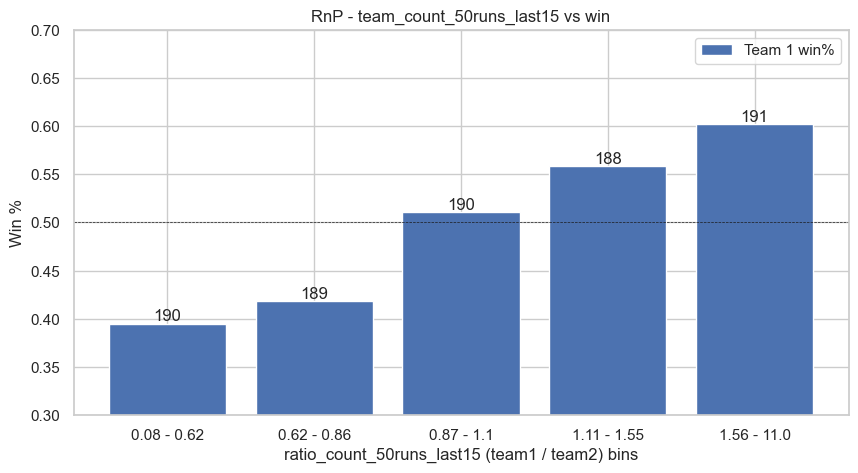

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


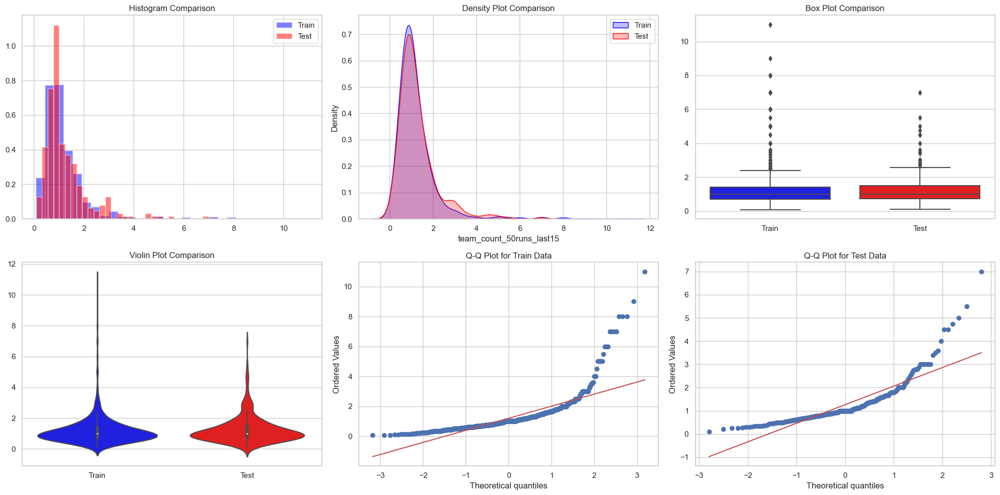

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0566, p-value = 0.4892

Number of outliers in Train:  57

Number of outliers in Test:  23

Skewness of Train:  4.180616027298652 
Kurtosis of Train:  25.32441101548783

Skewness of Test:  2.5561818944745323 
Kurtosis of Test:  9.21053881331185

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.202602    1.262330
std       1.008793    0.912222
min       0.083333    0.090909
25%       0.686678    0.733333
50%       1.000000    1.000000
75%       1.400000    1.500000
max      11.000000    7.000000
======================================= Model Performance =======================================

Correlation between team_count_50runs_last15 and winner_01 is: -0.11076111680232675

Feature importance wrt team_count_50runs_last15 : 0.5112271412858731


In [12]:
analyse_feature(train_data, 'team_count_50runs_last15')

In [13]:
remove_skew(train_data, 'team_count_50runs_last15', method='quantile', train=True)
remove_skew(test_data, 'team_count_50runs_last15', method='quantile', train=False)

Skewness of team_count_50runs_last15 was 4.180616027298652. quantile transformation applied. New skewness is 0.006295174038086638
Skewness of team_count_50runs_last15 was 2.5561818944745323. quantile transformation applied. New skewness is 0.014389321095474864


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.6 / 0.39 =  1.53


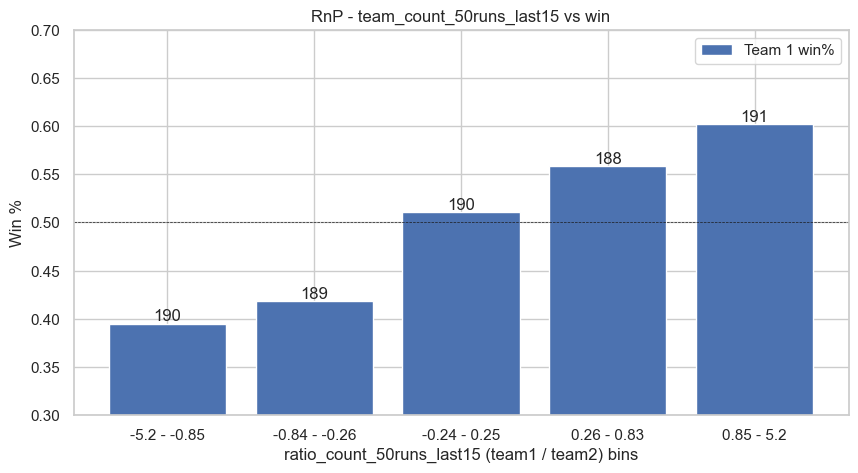

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


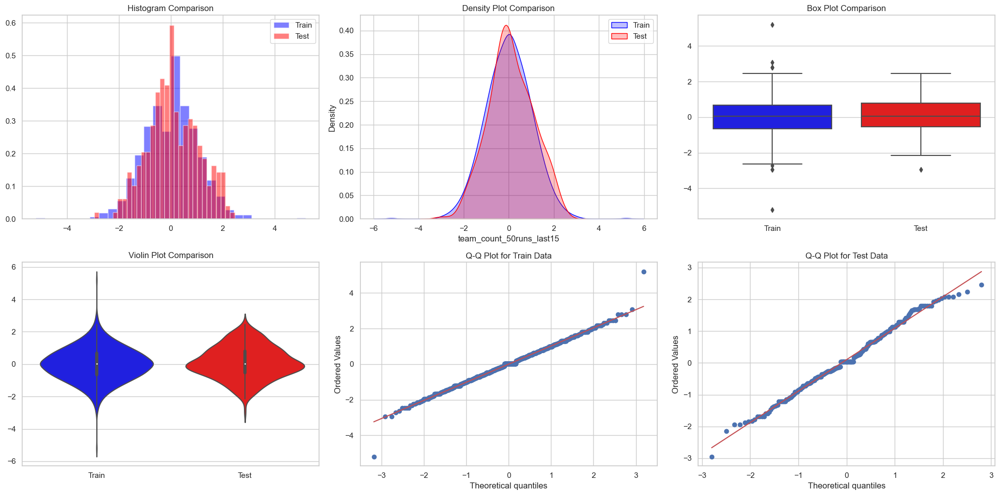

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0566, p-value = 0.4892

Number of outliers in Train:  9

Number of outliers in Test:  1

Skewness of Train:  0.006295174038086638 
Kurtosis of Train:  1.0302344862787187

Skewness of Test:  0.014389321095474864 
Kurtosis of Test:  -0.2900488510265524

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      0.001413    0.102455
std       1.021381    0.986516
min      -5.199338   -2.950958
25%      -0.670760   -0.549163
50%       0.037065    0.037065
75%       0.676984    0.789571
max       5.199338    2.464314
======================================= Model Performance =======================================

Correlation between team_count_50runs_last15 and winner_01 is: -0.15168597598803676

Feature importance wrt team_count_50runs_last15 : 0.48344276111947243


In [14]:
analyse_feature(train_data, 'team_count_50runs_last15')

## Feature 2

In [15]:
# Function to calculate ground's average score
def avg_score_at_ground(matches, ground_id):
    ground_matches = matches[matches['ground_id'] == ground_id]
    total_scores = ground_matches['inning1_runs'].sum() + ground_matches['inning2_runs'].sum()
    total_matches = len(ground_matches) * 2  # as each match has two innings
    return total_scores / total_matches if total_matches > 0 else 0

# Function to calculate team's average score
def avg_team_score(matches, team_id):
    team_matches = matches[(matches['team1_id'] == team_id) | (matches['team2_id'] == team_id)]
    team_scores = team_matches.apply(lambda x: x['inning1_runs'] if x['team1_id'] == team_id else x['inning2_runs'], axis=1).sum()
    total_innings = len(team_matches) * 2  # as each match has two innings
    return team_scores / total_innings if total_innings > 0 else 0

# Function to calculate ratio of team's avg score to ground's avg score
def team_to_ground_avg_score_ratio(matches, team_id, ground_id):
    ground_avg_score = avg_score_at_ground(matches, ground_id)
    team_avg_score = avg_team_score(matches, team_id)
    return team_avg_score / ground_avg_score if ground_avg_score > 0 else team_avg_score

# Apply to training data
train_data['team1_avg_score_ground_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
train_data['team2_avg_score_ground_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio', 'team_avg_score_ground_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio'])

# Apply to test data
test_data['team1_avg_score_ground_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
test_data['team2_avg_score_ground_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio', 'team_avg_score_ground_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio'])

slope: 0.6 / 0.32 =  1.89


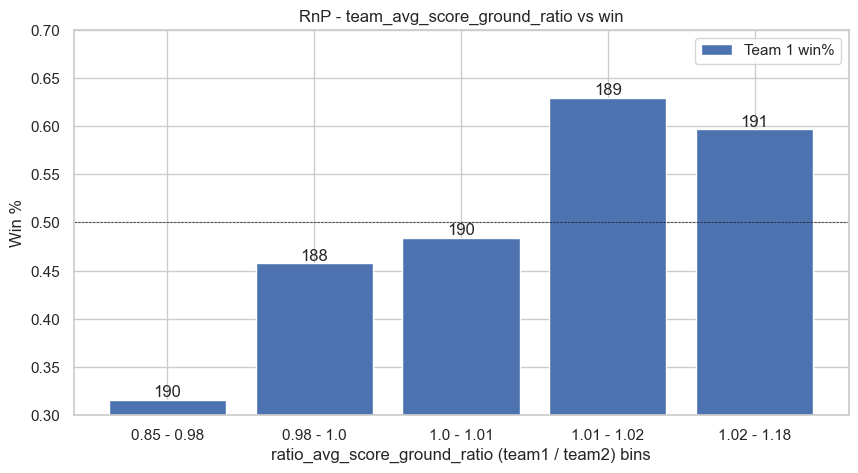

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


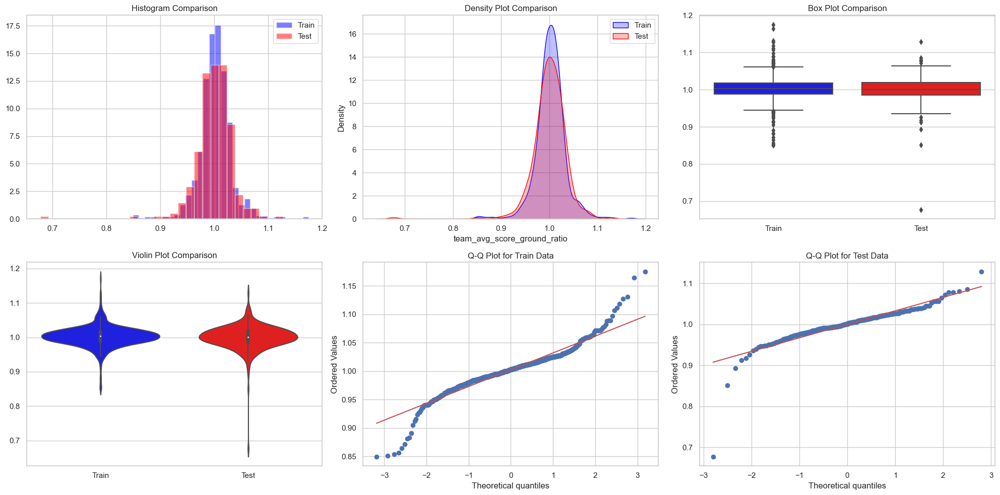

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0620, p-value = 0.3734

Number of outliers in Train:  54

Number of outliers in Test:  12

Skewness of Train:  -0.14195333571059365 
Kurtosis of Train:  5.813077242914682

Skewness of Test:  -2.7360828427827686 
Kurtosis of Test:  23.59265035894354

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.002441    0.999837
std       0.030870    0.036396
min       0.849365    0.677028
25%       0.987881    0.985342
50%       1.003055    1.000601
75%       1.017255    1.019572
max       1.175289    1.128561
======================================= Model Performance =======================================

Correlation between team_avg_score_ground_ratio and winner_01 is: -0.21602246480713405

Feature importance wrt team_count_50runs_last15 : 0.6181091566704995


In [16]:
analyse_feature(train_data, 'team_avg_score_ground_ratio')

In [17]:
remove_skew(train_data, 'team_avg_score_ground_ratio', method='quantile', train=True)
remove_skew(test_data, 'team_avg_score_ground_ratio', method='quantile', train=False)

Skewness of team_avg_score_ground_ratio was -0.14195333571059365. quantile transformation applied. New skewness is -1.8801065822696912e-06
Skewness of team_avg_score_ground_ratio was -2.7360828427827686. quantile transformation applied. New skewness is -0.3718116558529053


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.6 / 0.32 =  1.89


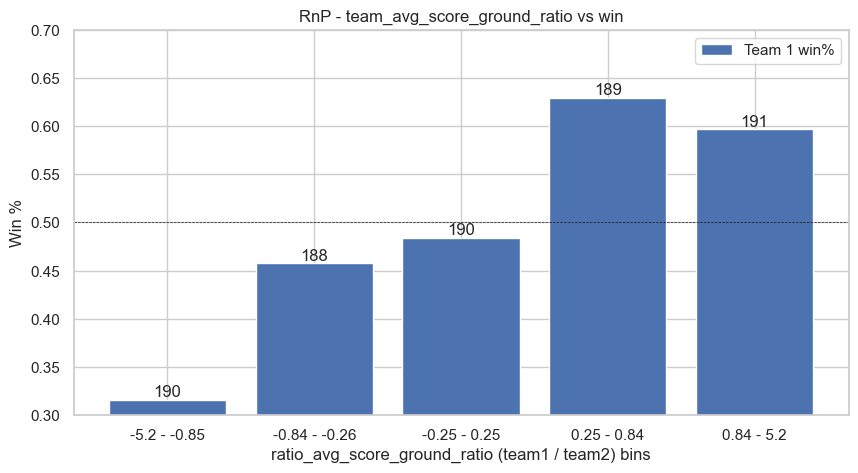

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


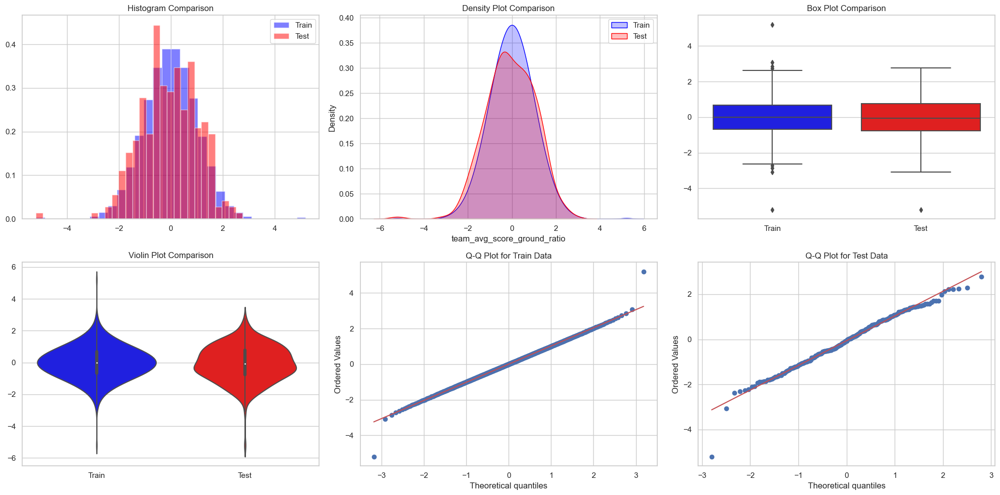

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0620, p-value = 0.3734

Number of outliers in Train:  8

Number of outliers in Test:  1

Skewness of Train:  -1.8801065822696912e-06 
Kurtosis of Train:  1.0257262786968644

Skewness of Test:  -0.3718116558529053 
Kurtosis of Test:  0.9845684074296006

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean  -1.733703e-07   -0.059465
std    1.021521e+00    1.096766
min   -5.199338e+00   -5.199338
25%   -6.744904e-01   -0.782033
50%   -1.392116e-16   -0.074437
75%    6.753207e-01    0.766049
max    5.199338e+00    2.770485
======================================= Model Performance =======================================

Correlation between team_avg_score_ground_ratio and winner_01 is: -0.21795400735357695

Feature importance wrt team_count_50runs_last15 : 0.6201640233895954


In [18]:
analyse_feature(train_data, 'team_avg_score_ground_ratio')


### Feature 3

In [19]:
def avg_score_at_ground(matches, ground_id):
    ground_matches = matches[matches['ground_id'] == ground_id]
    total_scores = ground_matches['inning1_runs'].sum() + ground_matches['inning2_runs'].sum()
    total_matches = len(ground_matches) * 2  # as each match has two innings
    return total_scores / total_matches if total_matches > 0 else 0

# Function to calculate team's average score
def avg_team_score(matches, team_id):
    team_matches = matches[(matches['team1_id'] == team_id) | (matches['team2_id'] == team_id)]
    team_scores = team_matches.apply(lambda x: x['inning1_runs'] if x['team1_id'] == team_id else x['inning2_runs'], axis=1).sum()
    total_innings = len(team_matches) * 2  # as each match has two innings
    return team_scores / total_innings if total_innings > 0 else 0


# Function to calculate team's average score when batting first
def avg_team_score_batting_first(matches, team_id):
    team_matches = matches[matches['team1_id'] == team_id]
    team_scores = team_matches['inning1_runs'].sum()
    total_innings = len(team_matches)
    return team_scores / total_innings if total_innings > 0 else 0

# Function to calculate team's average score when fielding first
def avg_team_score_fielding_first(matches, team_id):
    team_matches = matches[matches['team2_id'] == team_id]
    team_scores = team_matches['inning2_runs'].sum()
    total_innings = len(team_matches)
    return team_scores / total_innings if total_innings > 0 else 0

# Function to calculate ratio of team's avg score to ground's avg score (batting first)
def team_to_ground_avg_score_ratio_batting_first(matches, team_id, ground_id):
    ground_avg_score = avg_score_at_ground(matches, ground_id)
    team_avg_score = avg_team_score_batting_first(matches, team_id)
    return team_avg_score / ground_avg_score if ground_avg_score > 0 else team_avg_score

# Function to calculate ratio of team's avg score to ground's avg score (fielding first)
def team_to_ground_avg_score_ratio_fielding_first(matches, team_id, ground_id):
    ground_avg_score = avg_score_at_ground(matches, ground_id)
    team_avg_score = avg_team_score_fielding_first(matches, team_id)
    return team_avg_score / ground_avg_score if ground_avg_score > 0 else team_avg_score

# Apply to training data
train_data['team1_avg_score_ground_batting_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
train_data['team2_avg_score_ground_batting_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
# train_data['team1_avg_score_ground_fielding_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
# train_data['team2_avg_score_ground_fielding_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)

train_data = add_ratio_column(train_data, 'team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio', 'avg_score_ground_batting_first_ratio')
# train_data = add_ratio_column(train_data, 'team1_avg_score_ground_fielding_first_ratio', 'team2_avg_score_ground_fielding_first_ratio', 'avg_score_ground_fielding_first_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio'])

# Apply to test data
test_data['team1_avg_score_ground_batting_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
test_data['team2_avg_score_ground_batting_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
# test_data['team1_avg_score_ground_fielding_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
# test_data['team2_avg_score_ground_fielding_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)

test_data = add_ratio_column(test_data, 'team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio', 'avg_score_ground_batting_first_ratio')
# test_data = add_ratio_column(test_data, 'team1_avg_score_ground_fielding_first_ratio', 'team2_avg_score_ground_fielding_first_ratio', 'avg_score_ground_fielding_first_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio'])

slope: 0.64 / 0.34 =  1.87


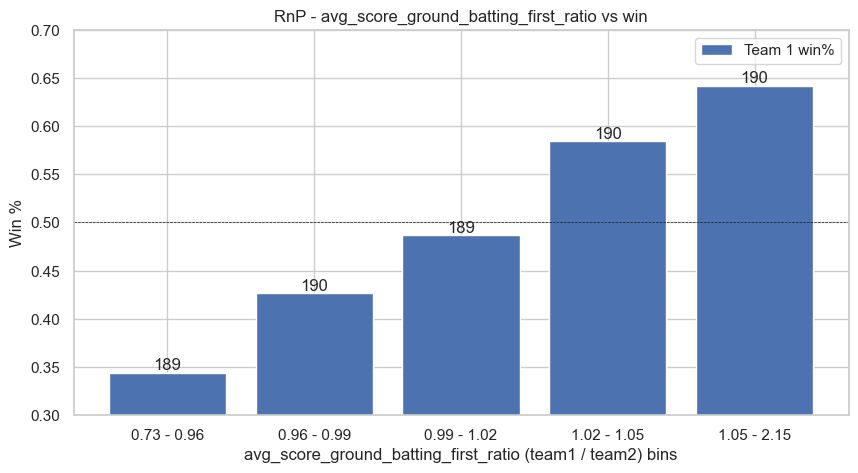

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


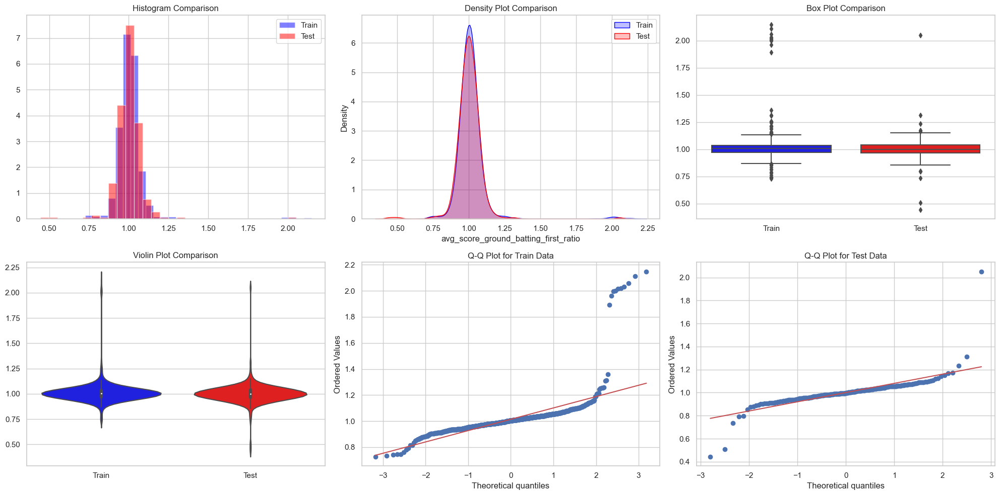

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0553, p-value = 0.5178

Number of outliers in Train:  48

Number of outliers in Test:  10

Skewness of Train:  6.024505999955123 
Kurtosis of Train:  48.38102693421381

Skewness of Test:  3.2633617791963223 
Kurtosis of Test:  49.33236801681444

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.014268    1.000558
std       0.122209    0.100378
min       0.727256    0.443726
25%       0.969008    0.963939
50%       1.005108    0.996985
75%       1.036415    1.038315
max       2.147582    2.051632
======================================= Model Performance =======================================

Correlation between avg_score_ground_batting_first_ratio and winner_01 is: -0.16460790957776952

Feature importance wrt team_count_50runs_last15 : 0.6143985060574751


In [20]:
analyse_feature(train_data, 'avg_score_ground_batting_first_ratio')

In [21]:
# from scipy.stats import mstats
# train_data['avg_score_ground_batting_first_ratio'] = mstats.winsorize(train_data['avg_score_ground_batting_first_ratio'], limits=[0.05, 0.05])  # Winsorize at 5th and 95th percentiles
# test_data['avg_score_ground_batting_first_ratio'] = mstats.winsorize(test_data['avg_score_ground_batting_first_ratio'], limits=[0.05, 0.05])  # Winsorize at 5th and 95th percentiles

In [22]:
remove_skew(train_data, 'avg_score_ground_batting_first_ratio', method='quantile', train=True)
remove_skew(test_data, 'avg_score_ground_batting_first_ratio', method='quantile', train=False)

Skewness of avg_score_ground_batting_first_ratio was 6.024505999955123. quantile transformation applied. New skewness is 0.00012562203304107659
Skewness of avg_score_ground_batting_first_ratio was 3.2633617791963223. quantile transformation applied. New skewness is -0.7121489796955071


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.64 / 0.34 =  1.87


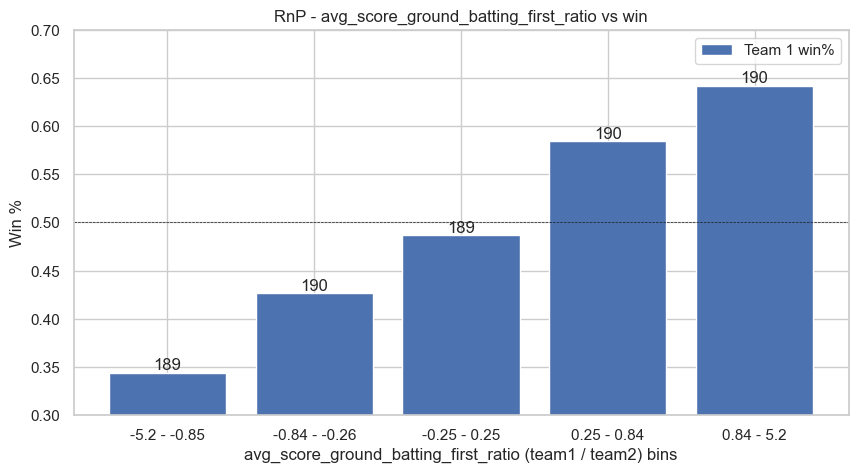

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


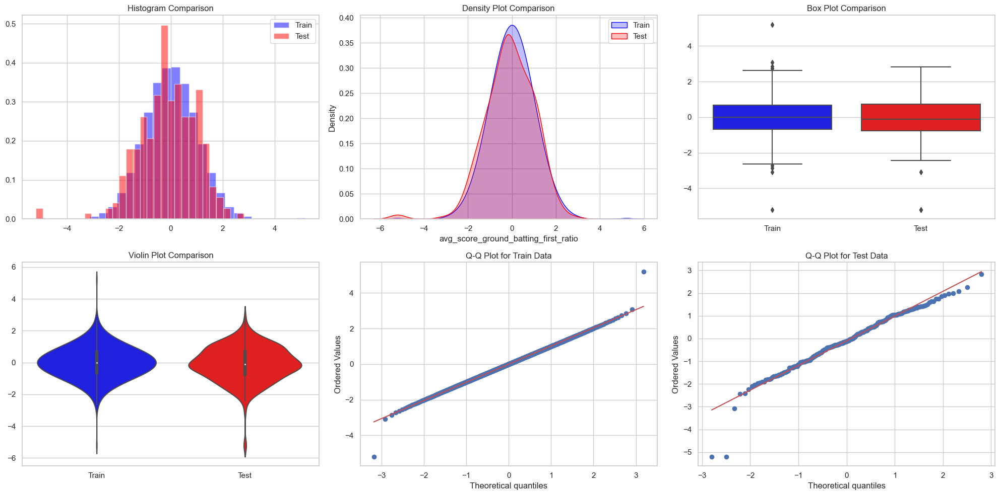

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0553, p-value = 0.5178

Number of outliers in Train:  8

Number of outliers in Test:  3

Skewness of Train:  0.00012562203304107659 
Kurtosis of Train:  1.025559013318511

Skewness of Test:  -0.7121489796955071 
Kurtosis of Test:  2.3982563258010643

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean   2.330187e-05   -0.100803
std    1.021561e+00    1.100249
min   -5.199338e+00   -5.199338
25%   -6.744904e-01   -0.772569
50%   -1.392116e-16   -0.108782
75%    6.744904e-01    0.714085
max    5.199338e+00    2.822451
======================================= Model Performance =======================================

Correlation between avg_score_ground_batting_first_ratio and winner_01 is: -0.23567213732266143

Feature importance wrt team_count_50runs_last15 : 0.6193725267953607


In [23]:
analyse_feature(train_data, 'avg_score_ground_batting_first_ratio')

### Feature 4

In [24]:
# Function to calculate match experience score
def match_experience_score(matches, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    total_experience_score = 0

    for player_id in team_ids:
        player_matches = matches[(matches['match_dt'] < date) & ((matches['team1_roster_ids'].str.contains(player_id)) | (matches['team2_roster_ids'].str.contains(player_id)))]
        total_experience_score += player_matches.shape[0]

    return total_experience_score

# Apply to training data
train_data['team1_match_experience_score'] = train_data.apply(lambda x: match_experience_score(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_match_experience_score'] = train_data.apply(lambda x: match_experience_score(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_match_experience_score', 'team2_match_experience_score', 'match_experience_score_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_match_experience_score', 'team2_match_experience_score'])

# Apply to test data
test_data['team1_match_experience_score'] = test_data.apply(lambda x: match_experience_score(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_match_experience_score'] = test_data.apply(lambda x: match_experience_score(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_match_experience_score', 'team2_match_experience_score', 'match_experience_score_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_match_experience_score', 'team2_match_experience_score'])

slope: 0.62 / 0.32 =  1.96


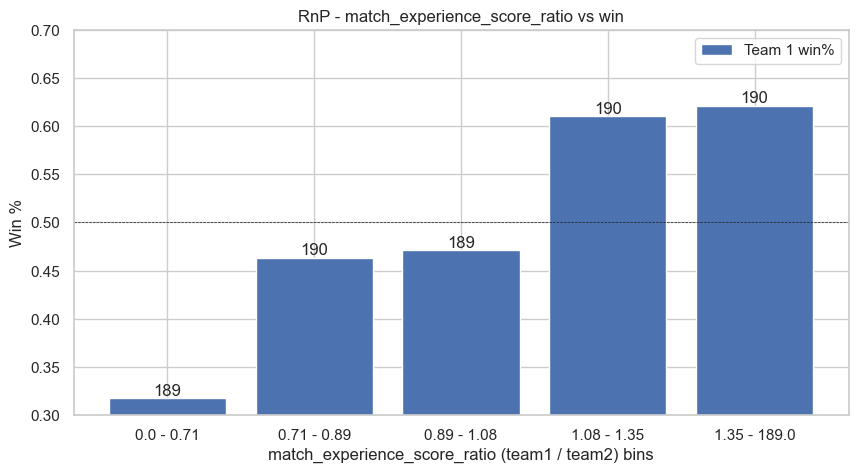

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


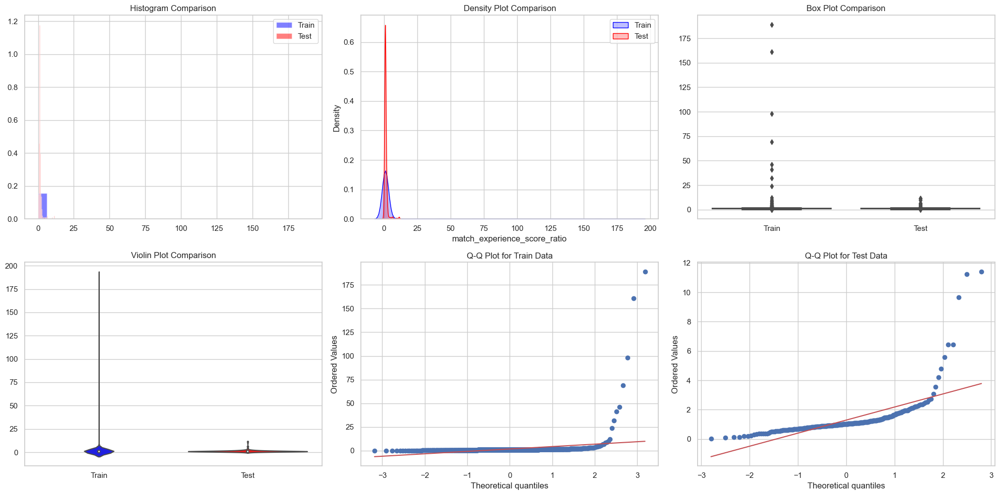

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0777, p-value = 0.1482

Number of outliers in Train:  58

Number of outliers in Test:  27

Skewness of Train:  16.266328198868727 
Kurtosis of Train:  291.03943527469215

Skewness of Test:  5.3667709269925945 
Kurtosis of Test:  35.12391401539378

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.799306    1.291998
std       9.201734    1.283036
min       0.002538    0.035714
25%       0.758016    0.809420
50%       0.982843    1.029316
75%       1.256781    1.301904
max     189.000000   11.414634
======================================= Model Performance =======================================

Correlation between match_experience_score_ratio and winner_01 is: -0.06808629926118802

Feature importance wrt team_count_50runs_last15 : 0.6149335730141137


In [25]:
analyse_feature(train_data, 'match_experience_score_ratio')

In [26]:
remove_skew(train_data, 'match_experience_score_ratio', method='quantile', train=True)
remove_skew(test_data, 'match_experience_score_ratio', method='quantile', train=False)

Skewness of match_experience_score_ratio was 16.266328198868727. quantile transformation applied. New skewness is 8.936139138509552e-06
Skewness of match_experience_score_ratio was 5.3667709269925945. quantile transformation applied. New skewness is -0.07841692990220447


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.62 / 0.32 =  1.96


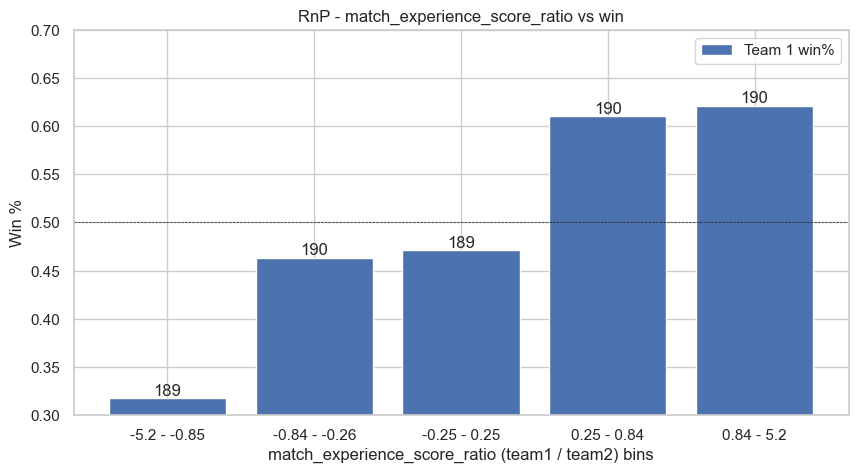

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


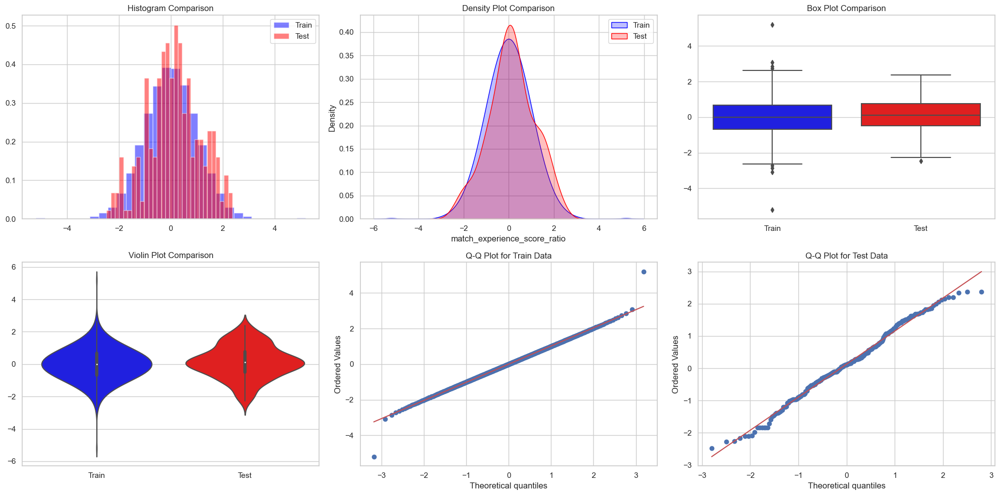

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0777, p-value = 0.1482

Number of outliers in Train:  8

Number of outliers in Test:  1

Skewness of Train:  8.936139138509552e-06 
Kurtosis of Train:  1.0255576532669908

Skewness of Test:  -0.07841692990220447 
Kurtosis of Test:  -0.2705669387888765

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean   1.009845e-05    0.129840
std    1.021539e+00    1.020683
min   -5.199338e+00   -2.476233
25%   -6.744904e-01   -0.492763
50%   -1.392116e-16    0.117221
75%    6.744904e-01    0.761195
max    5.199338e+00    2.375744
======================================= Model Performance =======================================

Correlation between match_experience_score_ratio and winner_01 is: -0.22173404182747491

Feature importance wrt team_count_50runs_last15 : 0.6156321628017202


In [27]:
analyse_feature(train_data, 'match_experience_score_ratio')

### Feature 5

In [28]:
# Function to calculate the frequency of boundaries (fours and sixes) scored by the team's batsmen in recent matches
def boundary_frequency(batsman_data, team_roster_ids, date, recent_matches=15):
    team_ids = str(team_roster_ids).split(':')
    total_boundaries = 0
    total_balls_faced = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_boundaries += recent_matches_data['Fours'].sum() + recent_matches_data['Sixes'].sum()
            total_balls_faced += recent_matches_data['balls_faced'].sum()
        except ValueError:
            continue

    boundary_freq = (total_boundaries / total_balls_faced) * 100 if total_balls_faced > 0 else 0
    return boundary_freq

# Apply to training data
train_data['team1_boundary_frequency'] = train_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_boundary_frequency'] = train_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_boundary_frequency', 'team2_boundary_frequency', 'boundary_frequency_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_boundary_frequency', 'team2_boundary_frequency'])

# Apply to test data
test_data['team1_boundary_frequency'] = test_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_boundary_frequency'] = test_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_boundary_frequency', 'team2_boundary_frequency', 'boundary_frequency_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_boundary_frequency', 'team2_boundary_frequency'])

slope: 0.56 / 0.37 =  1.54


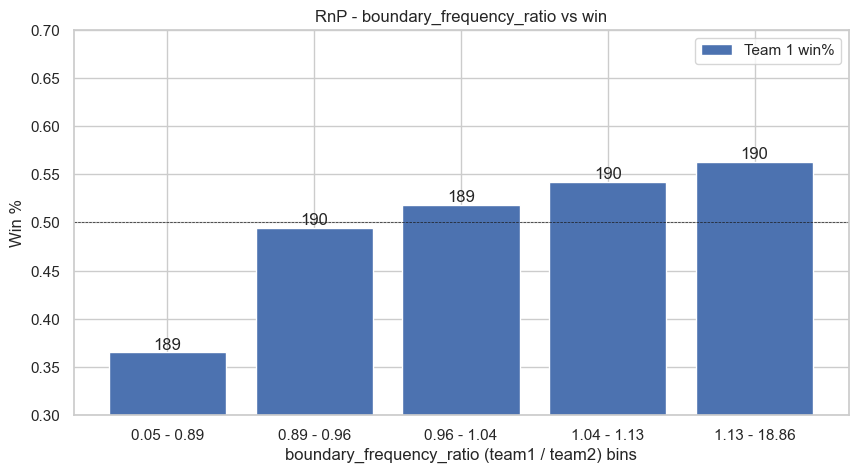

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


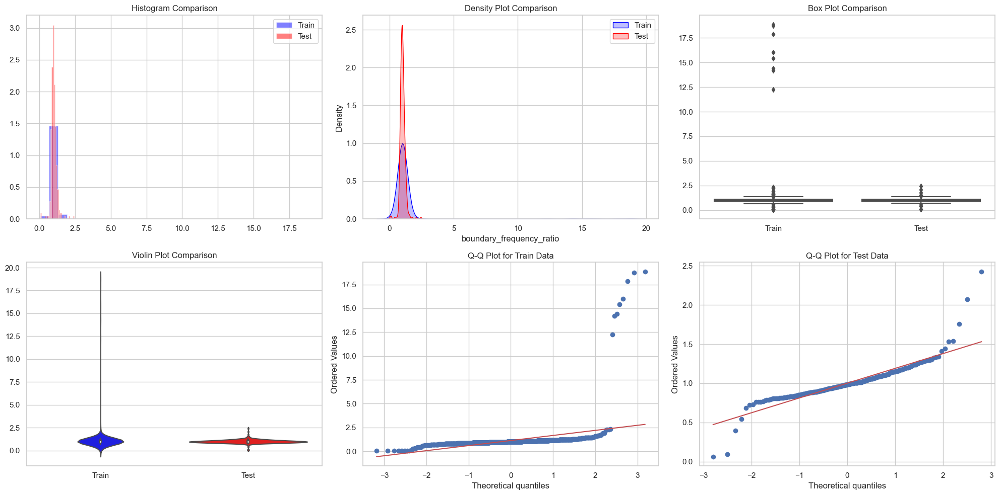

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0682, p-value = 0.2659

Number of outliers in Train:  59

Number of outliers in Test:  11

Skewness of Train:  10.732418895800087 
Kurtosis of Train:  118.41113764250207

Skewness of Test:  1.3509600474655554 
Kurtosis of Test:  12.965413758649884

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.134042    1.001361
std       1.399985    0.207369
min       0.048844    0.063313
25%       0.911754    0.888171
50%       0.997557    0.983684
75%       1.099266    1.087409
max      18.857143    2.425448
======================================= Model Performance =======================================

Correlation between boundary_frequency_ratio and winner_01 is: -0.0624026751466421

Feature importance wrt team_count_50runs_last15 : 0.6253098026918671


In [29]:
analyse_feature(train_data, 'boundary_frequency_ratio')

In [30]:
remove_skew(train_data, 'boundary_frequency_ratio', method='quantile', train=True)
remove_skew(test_data, 'boundary_frequency_ratio', method='quantile', train=False)

Skewness of boundary_frequency_ratio was 10.732418895800087. quantile transformation applied. New skewness is -8.504851102248557e-11
Skewness of boundary_frequency_ratio was 1.3509600474655554. quantile transformation applied. New skewness is 0.13824726417258407


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.56 / 0.37 =  1.54


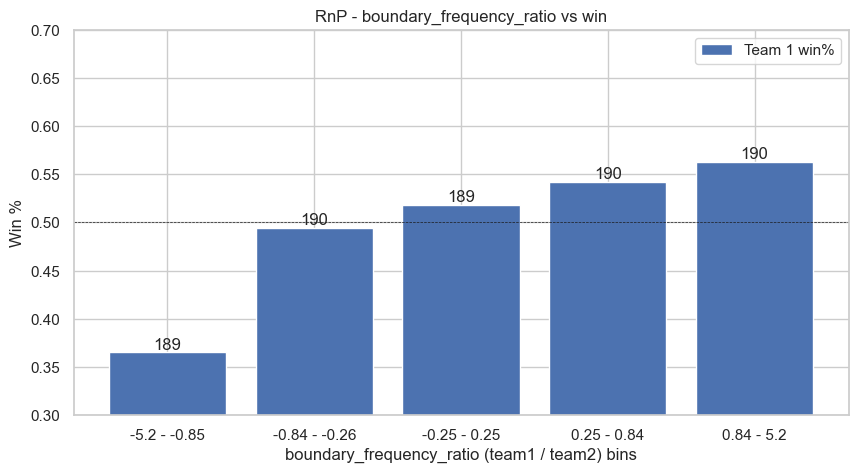

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


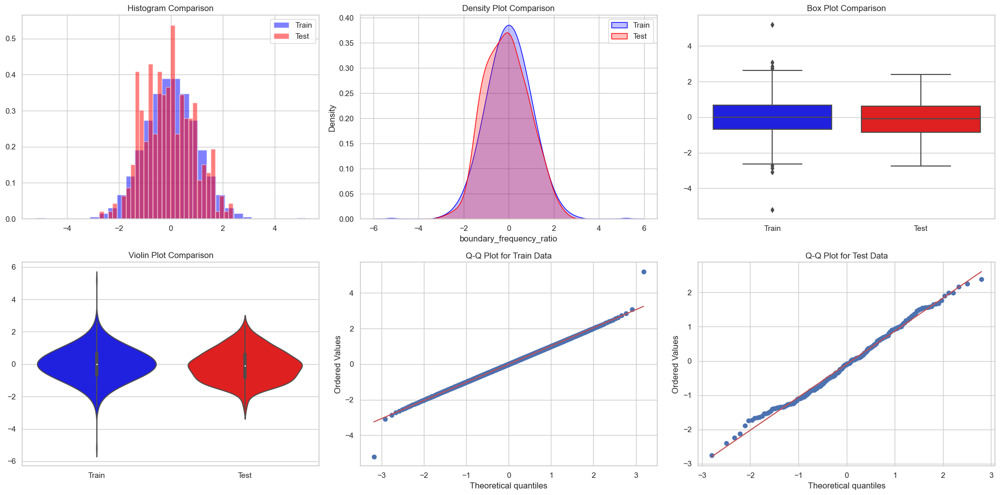

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0682, p-value = 0.2659

Number of outliers in Train:  8

Number of outliers in Test:  0

Skewness of Train:  -8.504851102248557e-11 
Kurtosis of Train:  1.0257268433408573

Skewness of Test:  0.13824726417258407 
Kurtosis of Test:  -0.41565215256471655

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean  -3.414397e-11   -0.092204
std    1.021524e+00    0.960975
min   -5.199338e+00   -2.758764
25%   -6.744904e-01   -0.841772
50%   -1.392116e-16   -0.101934
75%    6.744904e-01    0.603029
max    5.199338e+00    2.389412
======================================= Model Performance =======================================

Correlation between boundary_frequency_ratio and winner_01 is: -0.14162796658104965

Feature importance wrt team_count_50runs_last15 : 0.6236920012720502


In [31]:
analyse_feature(train_data, 'boundary_frequency_ratio')

### Feature 6

In [32]:
# Function to calculate the average runs scored in powerplay (first 6 overs) in recent matches
def avg_runs_powerplay(batsman_data, team_roster_ids, date, recent_matches=5, powerplay_overs=6):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0
    count = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id) & (batsman_data['over_faced_first'] <= powerplay_overs)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_runs += recent_matches_data['runs'].sum()
            count += recent_matches_data.shape[0]
        except ValueError:
            continue

    avg_runs = total_runs / recent_matches if recent_matches > 0 else 0
    return avg_runs

# Apply to training data
train_data['team1_avg_runs_powerplay'] = train_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_avg_runs_powerplay'] = train_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_runs_powerplay', 'team2_avg_runs_powerplay', 'avg_runs_powerplay_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_runs_powerplay', 'team2_avg_runs_powerplay'])

# Apply to test data
test_data['team1_avg_runs_powerplay'] = test_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_avg_runs_powerplay'] = test_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_runs_powerplay', 'team2_avg_runs_powerplay', 'avg_runs_powerplay_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_runs_powerplay', 'team2_avg_runs_powerplay'])

slope: 0.6 / 0.42 =  1.42


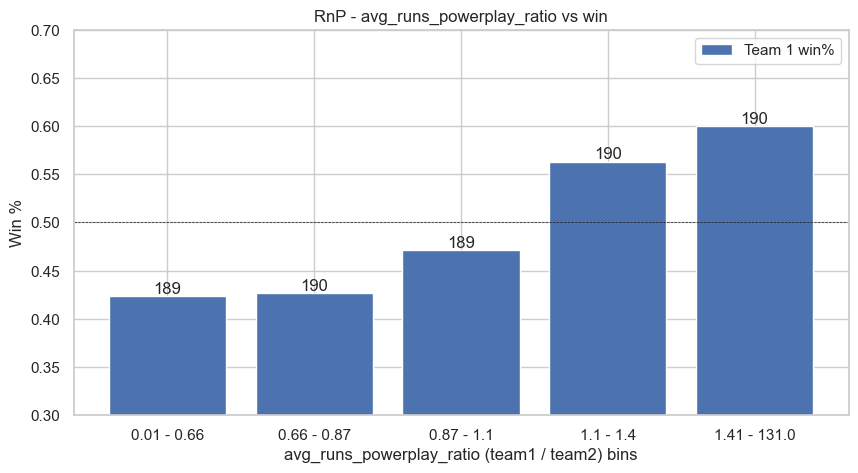

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


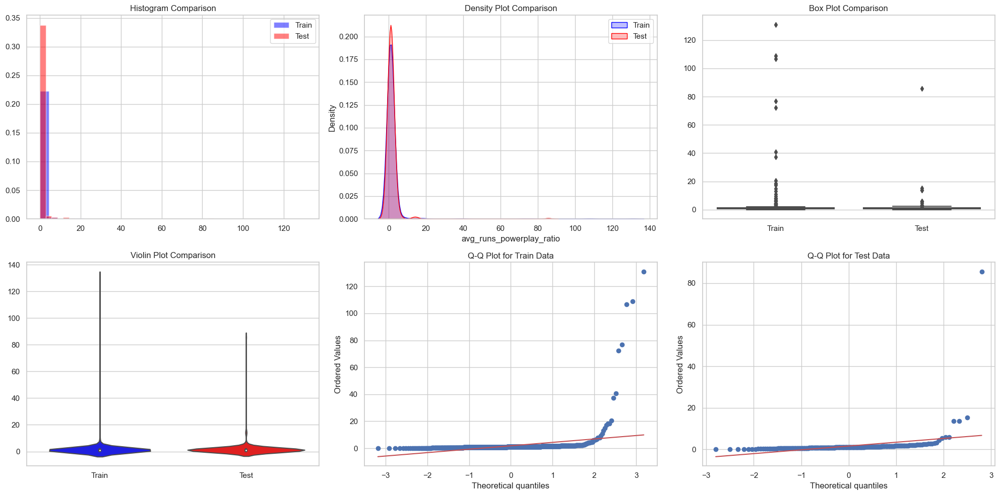

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0840, p-value = 0.0955

Number of outliers in Train:  52

Number of outliers in Test:  17

Skewness of Train:  12.951484597985738 
Kurtosis of Train:  182.45388522287934

Skewness of Test:  14.567378981412798 
Kurtosis of Test:  226.9489203604018

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.816087    1.620891
std       7.629981    5.351661
min       0.009597    0.019455
25%       0.713538    0.736218
50%       0.982918    1.017822
75%       1.292189    1.381868
max     131.000000   85.600000
======================================= Model Performance =======================================

Correlation between avg_runs_powerplay_ratio and winner_01 is: -0.056234772182689255

Feature importance wrt team_count_50runs_last15 : 0.6173271475067325


In [33]:
analyse_feature(train_data, 'avg_runs_powerplay_ratio')

In [34]:
remove_skew(train_data, 'avg_runs_powerplay_ratio', method='quantile', train=True)
remove_skew(test_data, 'avg_runs_powerplay_ratio', method='quantile', train=False)

Skewness of avg_runs_powerplay_ratio was 12.951484597985738. quantile transformation applied. New skewness is -2.047275484524221e-05
Skewness of avg_runs_powerplay_ratio was 14.567378981412798. quantile transformation applied. New skewness is -0.10179266338542395


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.6 / 0.42 =  1.42


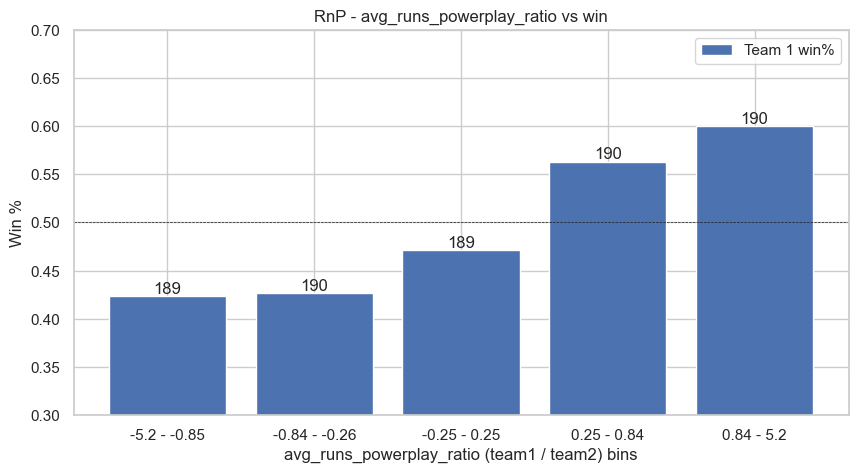

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


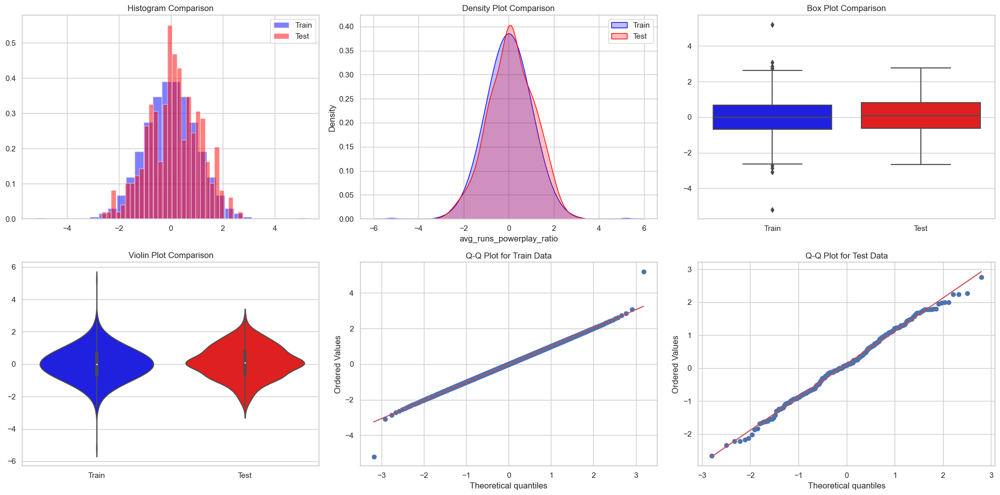

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0840, p-value = 0.0955

Number of outliers in Train:  8

Number of outliers in Test:  0

Skewness of Train:  -2.047275484524221e-05 
Kurtosis of Train:  1.0257216245004201

Skewness of Test:  -0.10179266338542395 
Kurtosis of Test:  -0.23494006800048783

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean   6.997900e-06    0.119905
std    1.021524e+00    0.998105
min   -5.199338e+00   -2.664367
25%   -6.744904e-01   -0.624340
50%    3.478121e-16    0.091387
75%    6.744904e-01    0.810091
max    5.199338e+00    2.763864
======================================= Model Performance =======================================

Correlation between avg_runs_powerplay_ratio and winner_01 is: -0.14098741613548355

Feature importance wrt team_count_50runs_last15 : 0.6172563271975806


In [35]:
analyse_feature(train_data, 'avg_runs_powerplay_ratio')

### Feature 7

In [36]:
# Function to calculate the total number of wickets taken by the team's bowlers in recent matches
def total_wickets_bowlers_recent(bowler_data, team_roster_ids, date, recent_matches=10):
    team_ids = str(team_roster_ids).split(':')
    total_wickets = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = bowler_data[(bowler_data['match_dt'] < date) & (bowler_data['bowler_id'] == player_id)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_wickets += recent_matches_data['wicket_count'].sum()
        except ValueError:
            continue

    return total_wickets

# Apply to training data
train_data['team1_total_wickets_bowlers_recent'] = train_data.apply(lambda x: total_wickets_bowlers_recent(bowler_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_total_wickets_bowlers_recent'] = train_data.apply(lambda x: total_wickets_bowlers_recent(bowler_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_total_wickets_bowlers_recent', 'team2_total_wickets_bowlers_recent', 'total_wickets_bowlers_recent_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_total_wickets_bowlers_recent', 'team2_total_wickets_bowlers_recent'])

# Apply to test data
test_data['team1_total_wickets_bowlers_recent'] = test_data.apply(lambda x: total_wickets_bowlers_recent(bowler_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_total_wickets_bowlers_recent'] = test_data.apply(lambda x: total_wickets_bowlers_recent(bowler_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_total_wickets_bowlers_recent', 'team2_total_wickets_bowlers_recent', 'total_wickets_bowlers_recent_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_total_wickets_bowlers_recent', 'team2_total_wickets_bowlers_recent'])

slope: 0.59 / 0.44 =  1.35


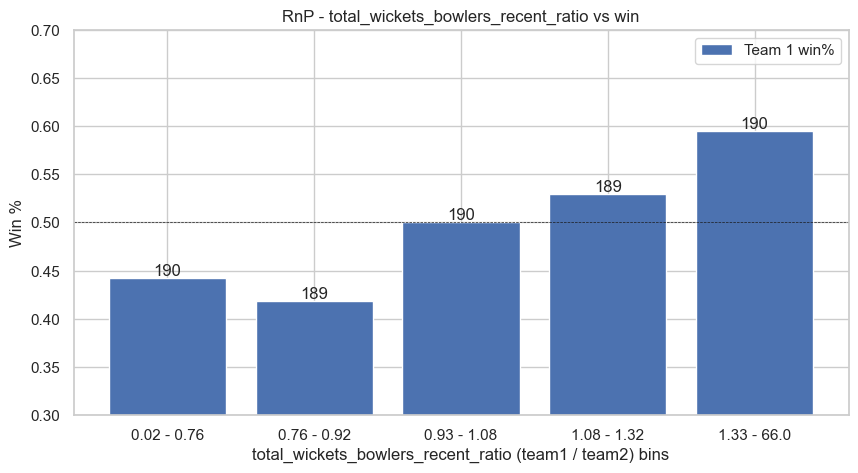

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


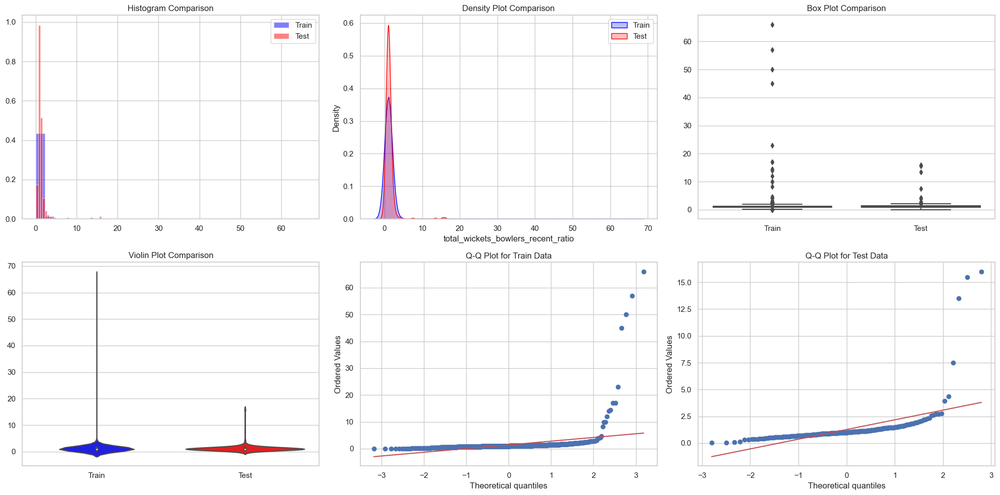

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0479, p-value = 0.6968

Number of outliers in Train:  84

Number of outliers in Test:  16

Skewness of Train:  13.120301649208562 
Kurtosis of Train:  189.67652340209506

Skewness of Test:  7.483328299371727 
Kurtosis of Test:  62.05058547720153

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.413132    1.271696
std       3.767895    1.598079
min       0.015152    0.045455
25%       0.817206    0.789626
50%       1.000000    1.000000
75%       1.247115    1.310283
max      66.000000   16.000000
======================================= Model Performance =======================================

Correlation between total_wickets_bowlers_recent_ratio and winner_01 is: -0.06723622802464123

Feature importance wrt team_count_50runs_last15 : 0.604783210091902


In [37]:
analyse_feature(train_data, 'total_wickets_bowlers_recent_ratio')

In [38]:
remove_skew(train_data, 'total_wickets_bowlers_recent_ratio', method='quantile', train=True)
remove_skew(test_data, 'total_wickets_bowlers_recent_ratio', method='quantile', train=False)

Skewness of total_wickets_bowlers_recent_ratio was 13.120301649208562. quantile transformation applied. New skewness is 0.0033946740334984257
Skewness of total_wickets_bowlers_recent_ratio was 7.483328299371727. quantile transformation applied. New skewness is 0.04986920117470171


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.59 / 0.44 =  1.35


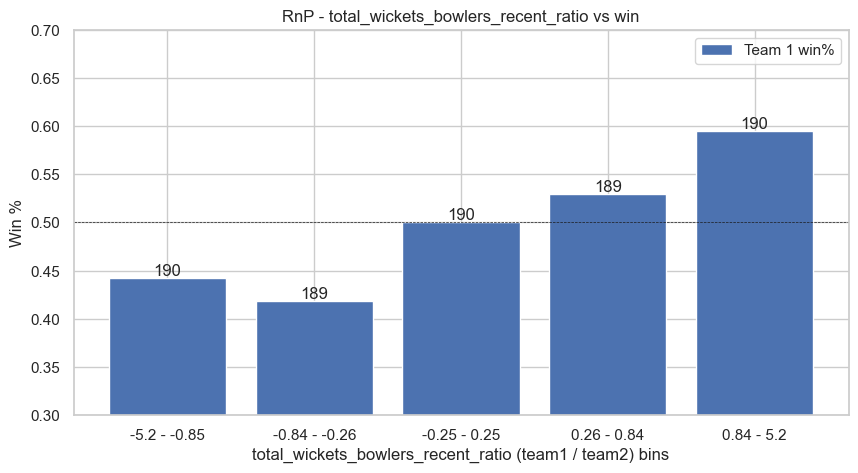

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


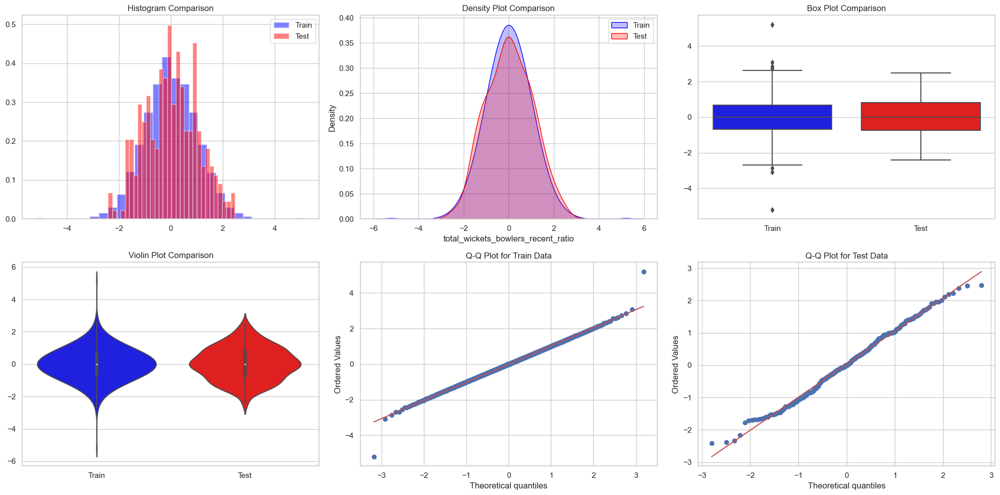

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0479, p-value = 0.6968

Number of outliers in Train:  7

Number of outliers in Test:  0

Skewness of Train:  0.0033946740334984257 
Kurtosis of Train:  1.025331603344645

Skewness of Test:  0.04986920117470171 
Kurtosis of Test:  -0.5109051385699019

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      0.000438    0.032905
std       1.021699    1.018142
min      -5.199338   -2.418826
25%      -0.674907   -0.752101
50%      -0.007941   -0.007941
75%       0.676577    0.818975
max       5.199338    2.469866
======================================= Model Performance =======================================

Correlation between total_wickets_bowlers_recent_ratio and winner_01 is: -0.1417008605205031

Feature importance wrt team_count_50runs_last15 : 0.5996049925206307


In [39]:
analyse_feature(train_data, 'total_wickets_bowlers_recent_ratio')

### Feature 8

In [40]:
# Function to calculate the total runs scored by the top 6 batsmen in recent matches
def total_runs_top_batsmen_recent(batsman_data, team_roster_ids, date, recent_matches=15, top_n=6):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_runs += recent_matches_data['runs'].sum()
        except ValueError:
            continue

    return total_runs

# Apply to training data
train_data['team1_total_runs_top_batsmen_recent'] = train_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_total_runs_top_batsmen_recent'] = train_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent', 'total_runs_top_batsmen_recent_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent'])

# Apply to test data
test_data['team1_total_runs_top_batsmen_recent'] = test_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_total_runs_top_batsmen_recent'] = test_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent', 'total_runs_top_batsmen_recent_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent'])

slope: 0.63 / 0.33 =  1.89


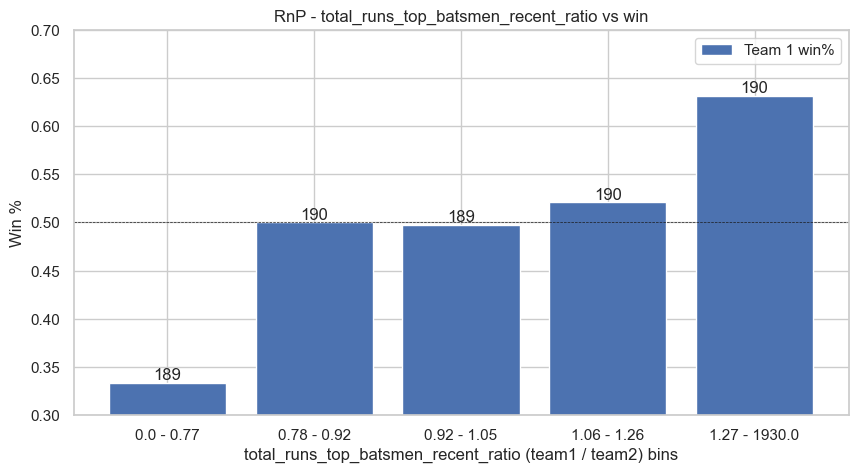

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


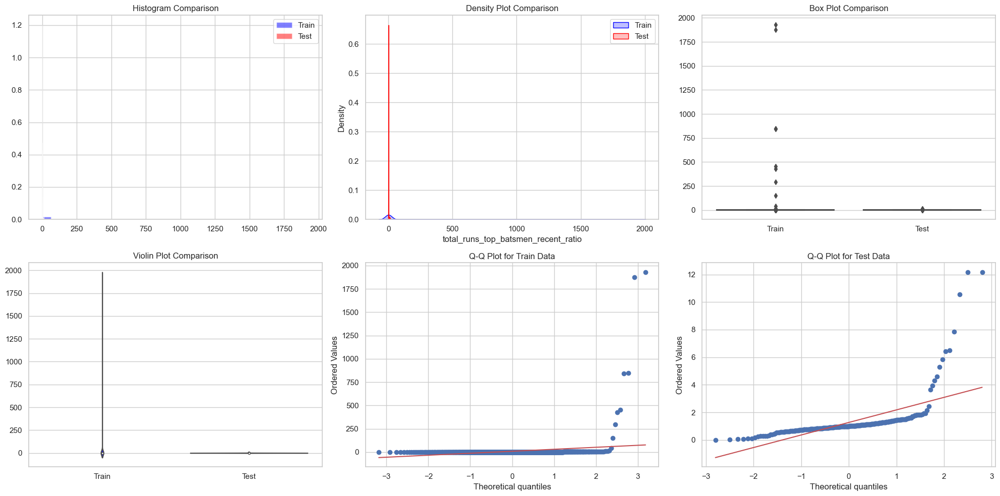

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0535, p-value = 0.5609

Number of outliers in Train:  87

Number of outliers in Test:  23

Skewness of Train:  16.80776463961771 
Kurtosis of Train:  306.0090221814928

Skewness of Test:  5.461071606993953 
Kurtosis of Test:  34.327095661810006

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      8.330381    1.267834
std      98.053513    1.418855
min       0.000570    0.002252
25%       0.816222    0.815174
50%       0.980860    0.993635
75%       1.190124    1.239749
max    1930.000000   12.169492
======================================= Model Performance =======================================

Correlation between total_runs_top_batsmen_recent_ratio and winner_01 is: -0.05063685921279522

Feature importance wrt team_count_50runs_last15 : 0.6249383305176075


In [41]:
analyse_feature(train_data, 'total_runs_top_batsmen_recent_ratio')

In [42]:
remove_skew(train_data, 'total_runs_top_batsmen_recent_ratio', method='quantile', train=True)
remove_skew(test_data, 'total_runs_top_batsmen_recent_ratio', method='quantile', train=False)

Skewness of total_runs_top_batsmen_recent_ratio was 16.80776463961771. quantile transformation applied. New skewness is -2.9900923524778225e-10
Skewness of total_runs_top_batsmen_recent_ratio was 5.461071606993953. quantile transformation applied. New skewness is -0.046708478721442154


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.63 / 0.33 =  1.89


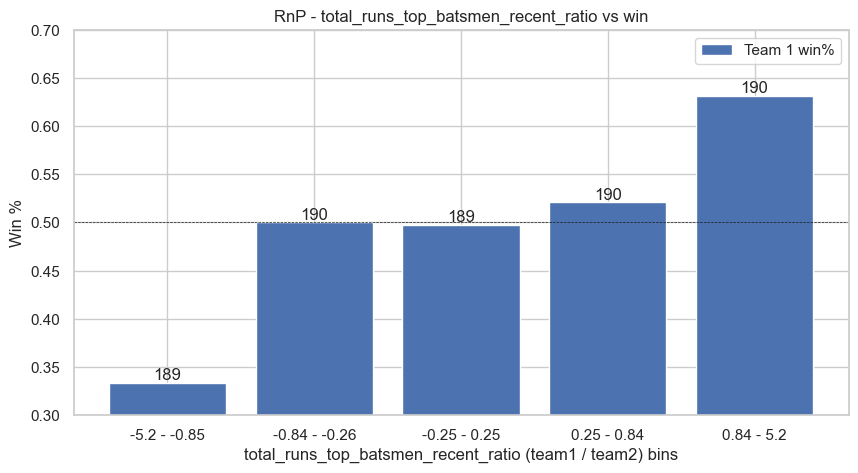

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


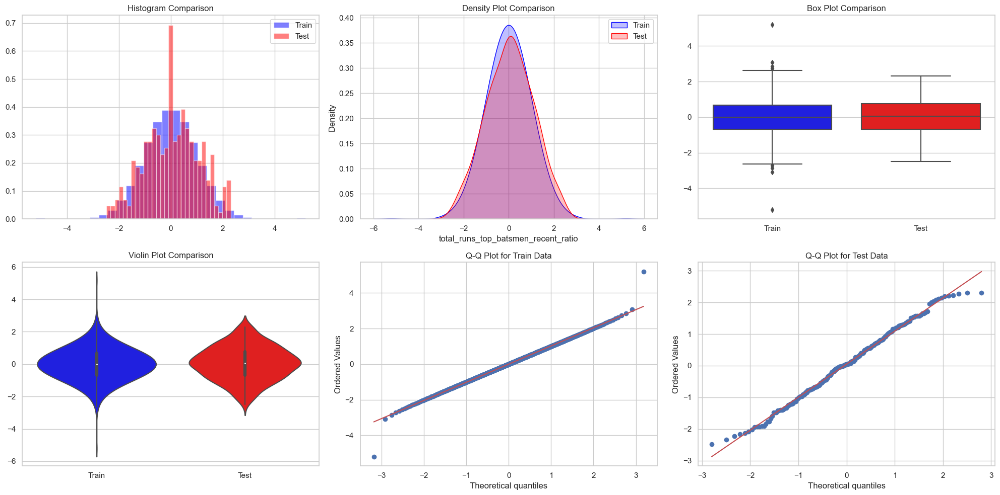

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0535, p-value = 0.5609

Number of outliers in Train:  8

Number of outliers in Test:  0

Skewness of Train:  -2.9900923524778225e-10 
Kurtosis of Train:  1.0257268434647075

Skewness of Test:  -0.046708478721442154 
Kurtosis of Test:  -0.4557520020518733

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean  -1.128649e-10    0.048938
std    1.021524e+00    1.040235
min   -5.199338e+00   -2.482247
25%   -6.744904e-01   -0.683855
50%    1.392116e-16    0.043307
75%    6.744904e-01    0.765493
max    5.199338e+00    2.308792
======================================= Model Performance =======================================

Correlation between total_runs_top_batsmen_recent_ratio and winner_01 is: -0.18989841559086754

Feature importance wrt team_count_50runs_last15 : 0.6220614099164331


In [43]:
analyse_feature(train_data, 'total_runs_top_batsmen_recent_ratio')

### Feature 9

In [44]:
# Function to calculate the total runs scored by the top 6 batsmen till date
def total_runs_top_batsmen(batsman_data, team_roster_ids, date, top_n=6):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date)]
            total_runs += player_data['runs'].sum()
        except ValueError:
            continue

    return total_runs

# Apply to training data
train_data['team1_total_runs_top_batsmen'] = train_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_total_runs_top_batsmen'] = train_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen', 'total_runs_top_batsmen_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen'])

# Apply to test data
test_data['team1_total_runs_top_batsmen'] = test_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_total_runs_top_batsmen'] = test_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen', 'total_runs_top_batsmen_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen'])

slope: 0.64 / 0.36 =  1.77


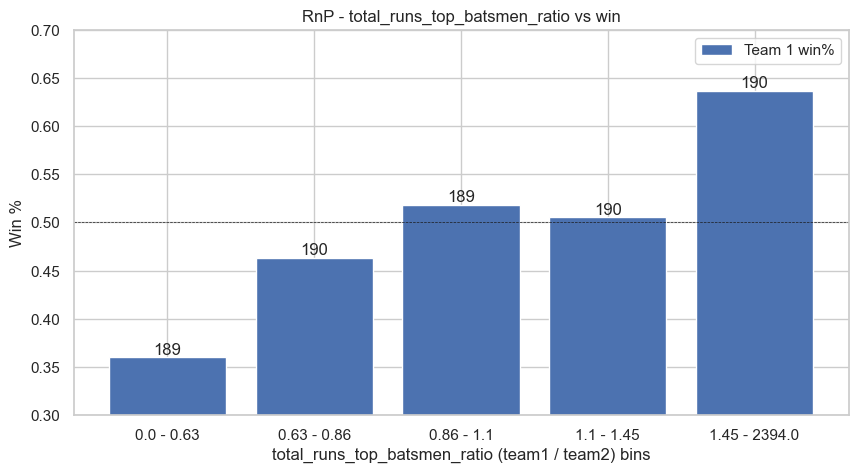

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


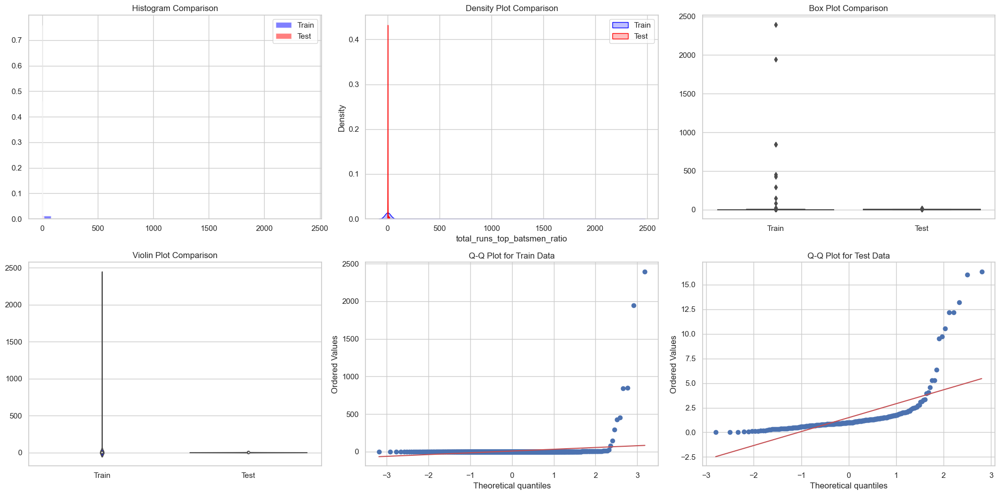

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0694, p-value = 0.2470

Number of outliers in Train:  77

Number of outliers in Test:  22

Skewness of Train:  17.8430152789085 
Kurtosis of Train:  347.0353423617294

Skewness of Test:  4.806483270248223 
Kurtosis of Test:  25.55070860845594

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      9.049217    1.496419
std     109.551843    2.126737
min       0.000217    0.002252
25%       0.693978    0.726186
50%       0.974693    0.976945
75%       1.339098    1.427291
max    2394.000000   16.331111
======================================= Model Performance =======================================

Correlation between total_runs_top_batsmen_ratio and winner_01 is: -0.05139625294243469

Feature importance wrt team_count_50runs_last15 : 0.6231577848065027


In [45]:
analyse_feature(train_data, 'total_runs_top_batsmen_ratio')

In [46]:
remove_skew(train_data, 'total_runs_top_batsmen_ratio', method='quantile', train=True)
remove_skew(test_data, 'total_runs_top_batsmen_ratio', method='quantile', train=False)

Skewness of total_runs_top_batsmen_ratio was 17.8430152789085. quantile transformation applied. New skewness is -1.4389662855987727e-05
Skewness of total_runs_top_batsmen_ratio was 4.806483270248223. quantile transformation applied. New skewness is -0.09626389877199527


/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(


slope: 0.64 / 0.36 =  1.77


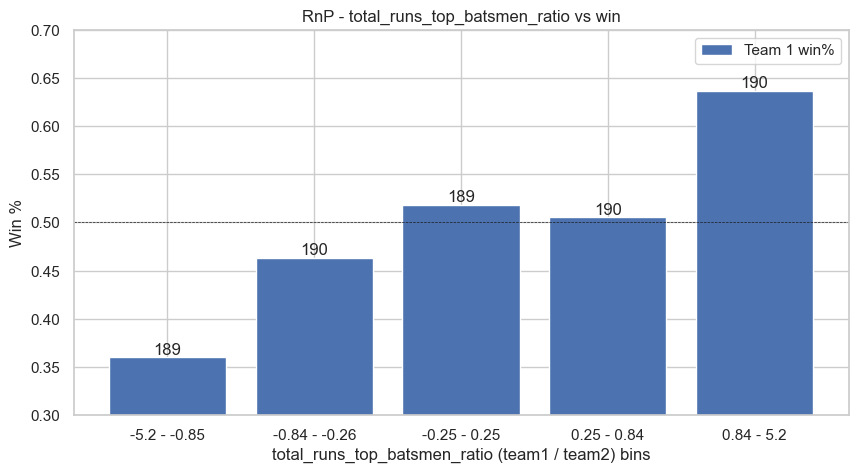

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


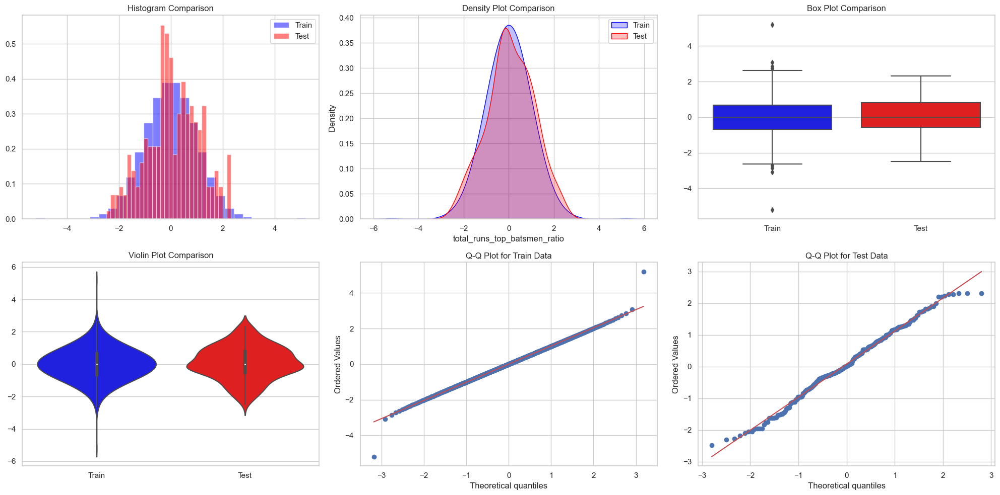

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0694, p-value = 0.2470

Number of outliers in Train:  8

Number of outliers in Test:  0

Skewness of Train:  -1.4389662855987727e-05 
Kurtosis of Train:  1.0256943050398872

Skewness of Test:  -0.09626389877199527 
Kurtosis of Test:  -0.37566819610481295

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count  9.480000e+02  271.000000
mean   6.206846e-06    0.076283
std    1.021526e+00    1.038405
min   -5.199338e+00   -2.482247
25%   -6.744904e-01   -0.558596
50%   -1.392116e-16    0.002613
75%    6.744904e-01    0.810982
max    5.199338e+00    2.316496
======================================= Model Performance =======================================

Correlation between total_runs_top_batsmen_ratio and winner_01 is: -0.18493583963806448

Feature importance wrt team_count_50runs_last15 : 0.6250940123976292


In [47]:
analyse_feature(train_data, 'total_runs_top_batsmen_ratio')

## Feature 10

In [48]:
def team_batsman_performance_recent(bat_df, match_id, team_roster_ids, date, n=15):
    team_ids = str(team_roster_ids).split(':')
    total_performance_index = 0

    for player_id in team_ids:
        recent_matches = giveLastNgamesPlayer(player_id=player_id, date=date, n=n, bat_or_bowl='bat')
        if not recent_matches.empty:
            player_performance = (recent_matches['runs'] * 4.5 +
                                  recent_matches['strike_rate'] * 2.5 +
                                  (recent_matches['Fours'] + recent_matches['Sixes'] ) * 1.5) 
                                  
            total_performance_index += player_performance.sum()

    return total_performance_index

train_data['team1_batsman_performance_recent'] = train_data.apply(
    lambda x: team_batsman_performance_recent(batsman_lvl_data, x['match id'], x['team1_roster_ids'], x['match_dt']),
    axis=1
)

train_data['team2_batsman_performance_recent'] = train_data.apply(
    lambda x: team_batsman_performance_recent(batsman_lvl_data, x['match id'], x['team2_roster_ids'], x['match_dt']),
    axis=1
)

test_data['team1_batsman_performance_recent'] = test_data.apply(
    lambda x: team_batsman_performance_recent(batsman_lvl_data, x['match id'], x['team1_roster_ids'], x['match_dt']),
    axis=1
)

test_data['team2_batsman_performance_recent'] = test_data.apply(
    lambda x: team_batsman_performance_recent(batsman_lvl_data, x['match id'], x['team2_roster_ids'], x['match_dt']),
    axis=1
)

# Add the new column to the DataFrame
train_data = add_ratio_column(train_data, 'team1_batsman_performance_recent', 'team2_batsman_performance_recent', 'team_batsmen_performance_ratio')

# Drop the initial individual features
train_data = train_data.drop(columns=['team1_batsman_performance_recent', 'team2_batsman_performance_recent'])


test_data = add_ratio_column(test_data, 'team1_batsman_performance_recent', 'team2_batsman_performance_recent', 'team_batsmen_performance_ratio')

# Drop the initial individual features
test_data = test_data.drop(columns=['team1_batsman_performance_recent', 'team2_batsman_performance_recent'])

slope: 0.58 / 0.35 =  1.65


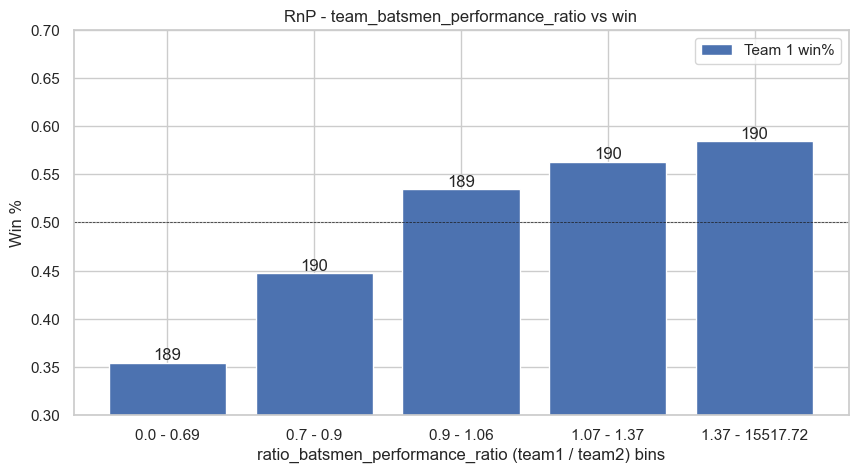

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


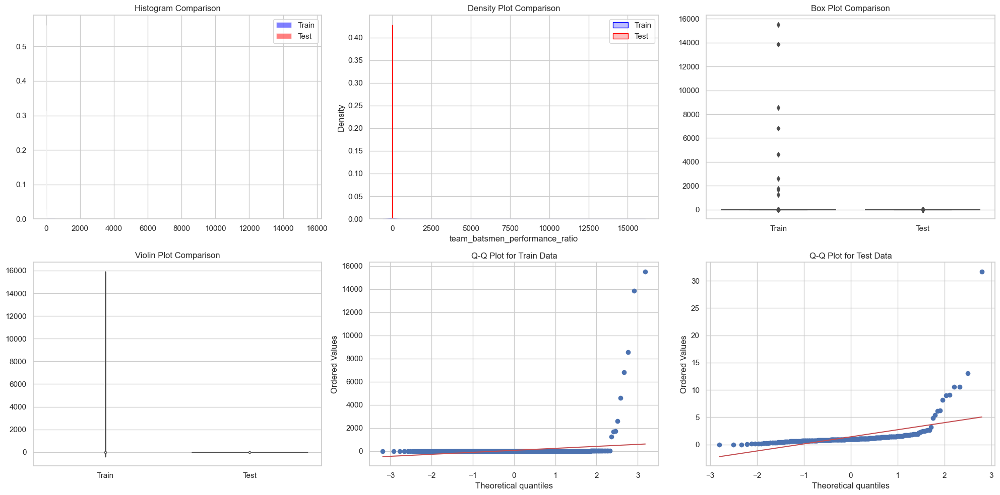

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0435, p-value = 0.8003

Number of outliers in Train:  88

Number of outliers in Test:  19

Skewness of Train:  16.06551607883884 
Kurtosis of Train:  278.92656418019243

Skewness of Test:  8.74419781034234 
Kurtosis of Test:  97.93361621988784

Descriptive Statistics Comparison:
        Train Stats  Test Stats
count    948.000000  271.000000
mean      60.928330    1.406119
std      785.819056    2.399773
min        0.000062    0.000132
25%        0.761683    0.748577
50%        0.980986    0.954296
75%        1.264136    1.312171
max    15517.725000   31.689254
======================================= Model Performance =======================================

Correlation between team_batsmen_performance_ratio and winner_01 is: -0.043406642774275396

Feature importance wrt team_count_50runs_last15 : 0.6163539478225787


In [49]:
analyse_feature(train_data, 'team_batsmen_performance_ratio')

## Feature 11

In [50]:
def team_batsman_runs_recent(bat_df, match_id, team_roster_ids, date, n=15):
    team_ids = str(team_roster_ids).split(':')
    total_performance_index = 0

    for player_id in team_ids:
        recent_matches = giveLastNgamesPlayer(player_id=player_id, date=date, n=n, bat_or_bowl='bat')
        if not recent_matches.empty:
            player_performance = (recent_matches['runs'] ) 
                                  
            total_performance_index += player_performance.sum()

    return total_performance_index

train_data['team1_batsman_runs_recent'] = train_data.apply(
    lambda x: team_batsman_runs_recent(batsman_lvl_data, x['match id'], x['team1_roster_ids'], x['match_dt']),
    axis=1
)

train_data['team2_batsman_runs_recent'] = train_data.apply(
    lambda x: team_batsman_runs_recent(batsman_lvl_data, x['match id'], x['team2_roster_ids'], x['match_dt']),
    axis=1
)

test_data['team1_batsman_runs_recent'] = test_data.apply(
    lambda x: team_batsman_runs_recent(batsman_lvl_data, x['match id'], x['team1_roster_ids'], x['match_dt']),
    axis=1
)

test_data['team2_batsman_runs_recent'] = test_data.apply(
    lambda x: team_batsman_runs_recent(batsman_lvl_data, x['match id'], x['team2_roster_ids'], x['match_dt']),
    axis=1
)

# Add the new column to the DataFrame
train_data = add_ratio_column(train_data, 'team1_batsman_runs_recent', 'team2_batsman_runs_recent', 'team_batsman_runs_recent_ratio')

# Drop the initial individual features
train_data = train_data.drop(columns=['team1_batsman_runs_recent', 'team2_batsman_runs_recent'])


test_data = add_ratio_column(test_data, 'team1_batsman_runs_recent', 'team2_batsman_runs_recent', 'team_batsman_runs_recent_ratio')

# Drop the initial individual features
test_data = test_data.drop(columns=['team1_batsman_runs_recent', 'team2_batsman_runs_recent'])

slope: 0.63 / 0.33 =  1.89


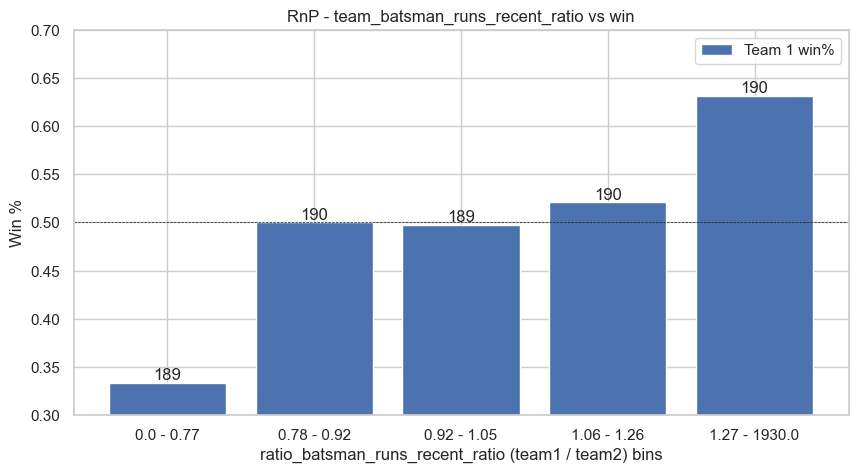

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


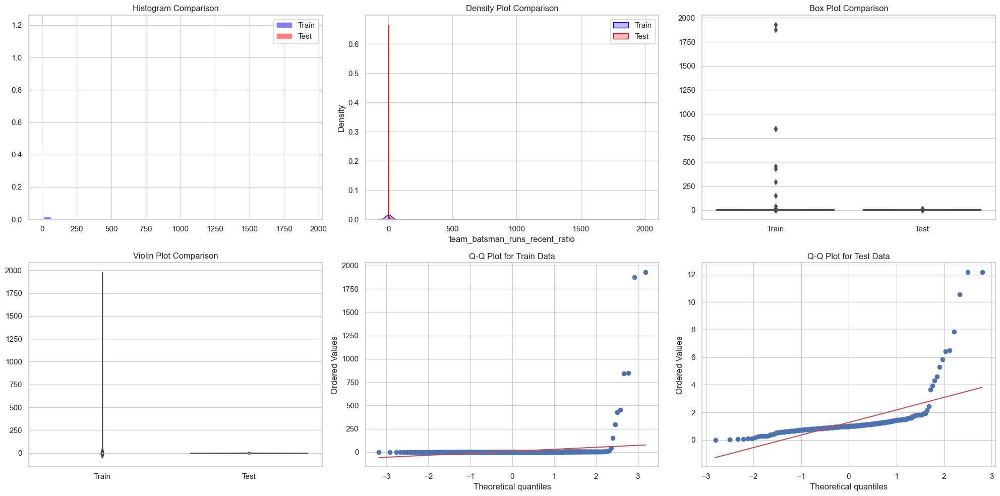

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0535, p-value = 0.5609

Number of outliers in Train:  87

Number of outliers in Test:  23

Skewness of Train:  16.80776463961771 
Kurtosis of Train:  306.0090221814928

Skewness of Test:  5.461071606993953 
Kurtosis of Test:  34.327095661810006

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      8.330381    1.267834
std      98.053513    1.418855
min       0.000570    0.002252
25%       0.816222    0.815174
50%       0.980860    0.993635
75%       1.190124    1.239749
max    1930.000000   12.169492
======================================= Model Performance =======================================

Correlation between team_batsman_runs_recent_ratio and winner_01 is: -0.05063685921279522

Feature importance wrt team_count_50runs_last15 : 0.6236397383663687


In [51]:
analyse_feature(train_data, 'team_batsman_runs_recent_ratio')

## Feature 12

In [52]:
def player_of_match_frequency(matches, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    pom_awards = 0
    total_matches = 0

    for player_id in team_ids:
        past_matches = matches[(matches['match_dt'] < date) & (matches['player_of_the_match_id'] == float(player_id))]
        pom_awards += past_matches.shape[0]
        total_matches += matches[(matches['match_dt'] < date) & ((matches['team1_roster_ids'].str.contains(str(player_id))) | (matches['team2_roster_ids'].str.contains(str(player_id))))].shape[0]

    return pom_awards / total_matches if total_matches > 0 else 0

train_data['team1_pom_frequency'] = train_data.apply(lambda x: player_of_match_frequency(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_pom_frequency'] = train_data.apply(lambda x: player_of_match_frequency(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

test_data['team1_pom_frequency'] = test_data.apply(lambda x: player_of_match_frequency(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_pom_frequency'] = test_data.apply(lambda x: player_of_match_frequency(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)


train_data = add_ratio_column(train_data, 'team1_pom_frequency', 'team2_pom_frequency', 'team_playerOfmatch_ratio')

# Drop the initial individual features
train_data = train_data.drop(columns=['team1_pom_frequency', 'team2_pom_frequency'])


test_data = add_ratio_column(test_data, 'team1_pom_frequency', 'team2_pom_frequency', 'team_playerOfmatch_ratio')

# Drop the initial individual features
test_data = test_data.drop(columns=['team1_pom_frequency', 'team2_pom_frequency'])

slope: 0.53 / 0.4 =  1.33


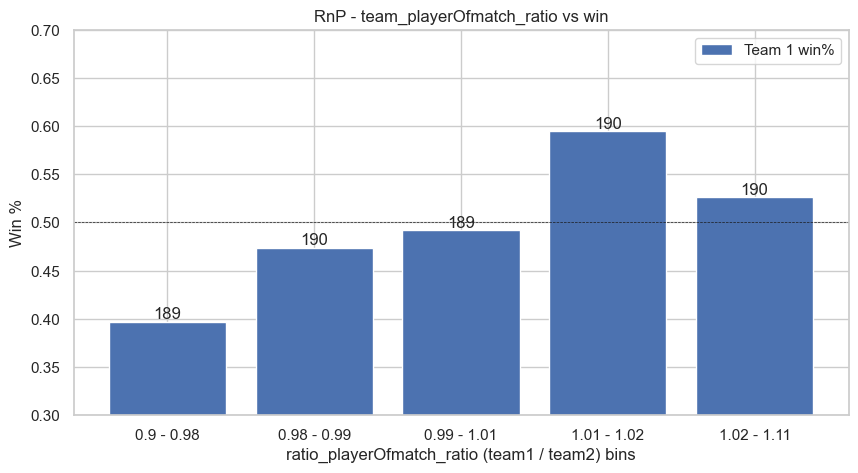

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


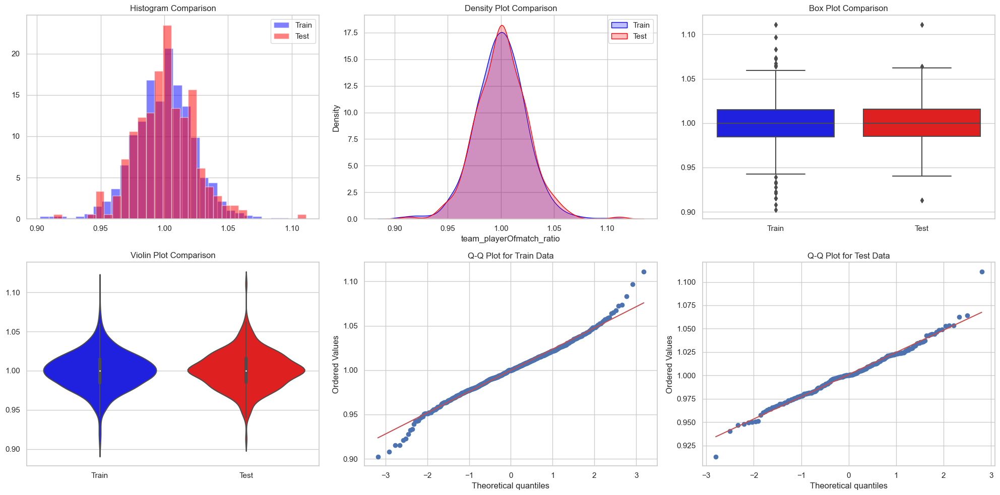

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0672, p-value = 0.2830

Number of outliers in Train:  18

Number of outliers in Test:  3

Skewness of Train:  -0.01842034766607293 
Kurtosis of Train:  1.4313078910320183

Skewness of Test:  0.22721363096857203 
Kurtosis of Test:  1.7587661508478396

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      0.999753    1.000932
std       0.024019    0.023873
min       0.902439    0.913043
25%       0.984787    0.984993
50%       1.000000    1.000000
75%       1.014945    1.015976
max       1.111111    1.111111
======================================= Model Performance =======================================

Correlation between team_playerOfmatch_ratio and winner_01 is: -0.1222737292562474

Feature importance wrt team_count_50runs_last15 : 0.6128800688842505


In [53]:
analyse_feature(train_data, 'team_playerOfmatch_ratio')

## Feature 13

In [54]:
def team_count_100runs_last15(matches, team1_roster, team2_roster, date, n=25):
    def count_100s(team_roster):
        total_100s = 0
        for player_id in team_roster.split(':'):
            player_matches = giveLastNgamesPlayer(player_id, date, n, 'bat')
            total_100s += (player_matches['runs'] >= 75).sum()
        return total_100s

    team1_100s = count_100s(team1_roster)
    team2_100s = count_100s(team2_roster)

    return team1_100s / team2_100s if team2_100s > 0 else team1_100s

train_data['team_count_100runs_ratio_last15'] = train_data.apply(lambda x: team_count_100runs_last15(match_lvl_data, x['team1_roster_ids'], x['team2_roster_ids'], x['match_dt']), axis=1)
test_data['team_count_100runs_ratio_last15'] = test_data.apply(lambda x: team_count_100runs_last15(match_lvl_data, x['team1_roster_ids'], x['team2_roster_ids'], x['match_dt']), axis=1)

slope: 0.59 / 0.4 =  1.48


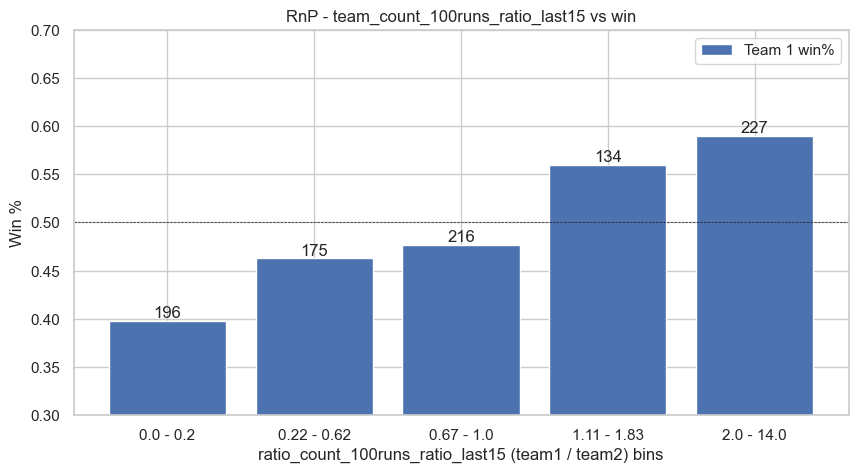

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


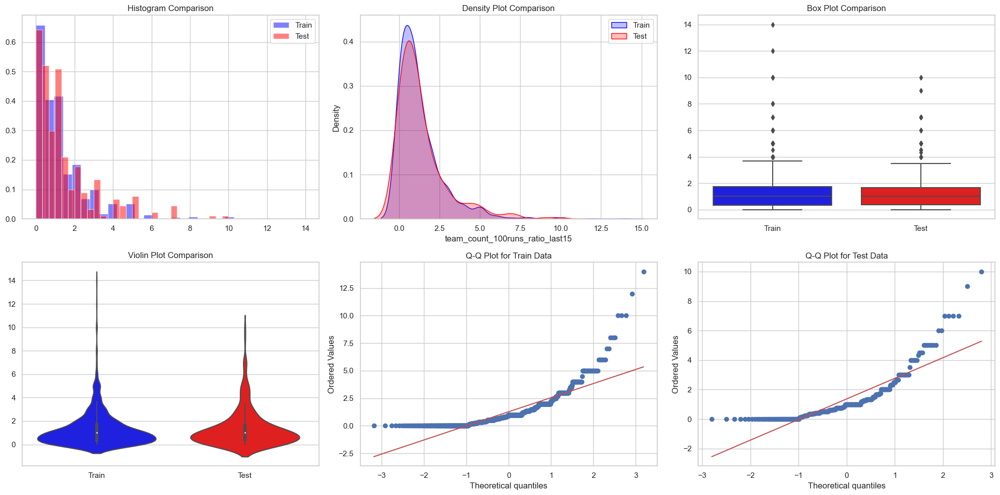

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0302, p-value = 0.9870

Number of outliers in Train:  63

Number of outliers in Test:  25

Skewness of Train:  2.8535227456095624 
Kurtosis of Train:  13.479191917781083

Skewness of Test:  2.264393808264223 
Kurtosis of Test:  6.353358127402797

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.274676    1.365704
std       1.483916    1.597194
min       0.000000    0.000000
25%       0.333333    0.375000
50%       1.000000    1.000000
75%       1.750000    1.666667
max      14.000000   10.000000
======================================= Model Performance =======================================

Correlation between team_count_100runs_ratio_last15 and winner_01 is: -0.14108232795000986

Feature importance wrt team_count_50runs_last15 : 0.3588957709135532


In [55]:
analyse_feature(train_data, 'team_count_100runs_ratio_last15')

## Feature 14

In [56]:
def avg_extras_conceded(matches, team_roster_ids, date, n=10):
    team_ids = team_roster_ids.split(':')
    total_extras = 0
    total_matches = 0

    for player_id in team_ids:
        recent_matches = giveLastNgamesPlayer(player_id, date, n, 'bowl')
        total_extras += recent_matches['wides'].sum() + recent_matches['noballs'].sum()
        total_matches += recent_matches.shape[0]

    return total_extras / total_matches if total_matches > 0 else 0

train_data['team1_avg_extras_conceded'] = train_data.apply(lambda x: avg_extras_conceded(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_avg_extras_conceded'] = train_data.apply(lambda x: avg_extras_conceded(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

test_data['team1_avg_extras_conceded'] = test_data.apply(lambda x: avg_extras_conceded(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_avg_extras_conceded'] = test_data.apply(lambda x: avg_extras_conceded(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)


#add ratio column 
train_data = add_ratio_column(train_data, 'team1_avg_extras_conceded', 'team2_avg_extras_conceded', 'teams_avg_extras_conceded_ratio')

# Drop the initial individual features
train_data = train_data.drop(columns=['team1_avg_extras_conceded', 'team2_avg_extras_conceded'])

#add ratio column 
test_data = add_ratio_column(test_data, 'team1_avg_extras_conceded', 'team2_avg_extras_conceded', 'teams_avg_extras_conceded_ratio')

# Drop the initial individual features
test_data = test_data.drop(columns=['team1_avg_extras_conceded', 'team2_avg_extras_conceded'])

slope: 0.51 / 0.46 =  1.11


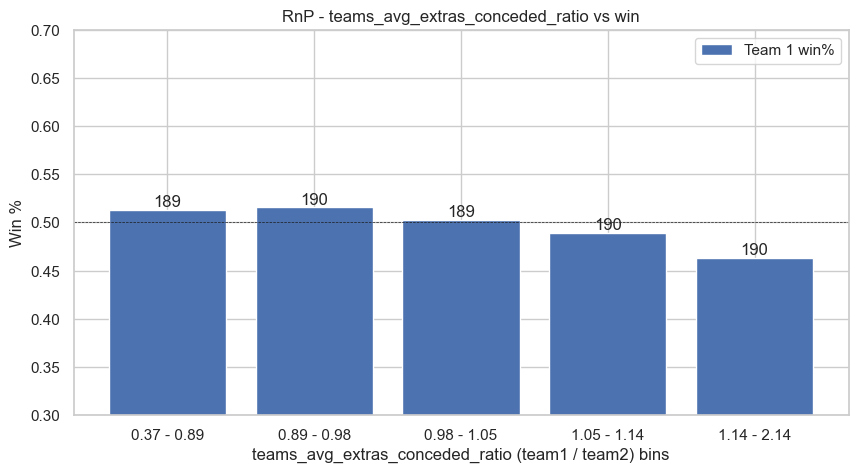

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


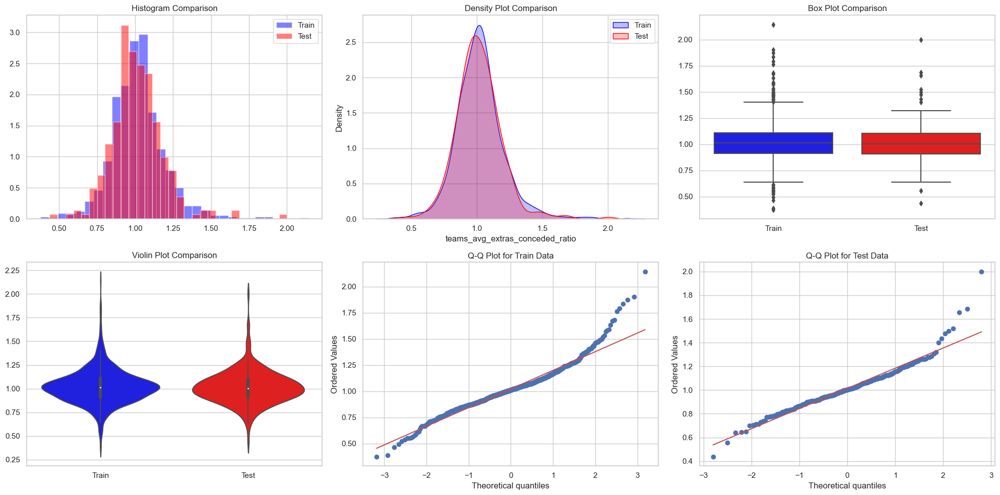

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0462, p-value = 0.7371

Number of outliers in Train:  43

Number of outliers in Test:  10

Skewness of Train:  0.8570370831935645 
Kurtosis of Train:  3.917088422178999

Skewness of Test:  1.017405951168139 
Kurtosis of Test:  4.784653379718403

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.021489    1.013980
std       0.182580    0.175264
min       0.375000    0.437500
25%       0.909944    0.908425
50%       1.011468    1.002898
75%       1.107492    1.101626
max       2.142857    2.000000
======================================= Model Performance =======================================

Correlation between teams_avg_extras_conceded_ratio and winner_01 is: 0.027942762054527406

Feature importance wrt team_count_50runs_last15 : 0.6047301183701314


In [57]:
analyse_feature(train_data, 'teams_avg_extras_conceded_ratio')

## Feature 15

In [58]:
def avg_partnership_length(matches, team_roster_ids, date, n=10):
    team_ids = team_roster_ids.split(':')
    total_partnership_runs = 0
    total_partnerships = 0

    for player_id in team_ids[:6]:  # Assuming top 4 are the main batsmen
        recent_matches = giveLastNgamesPlayer(player_id, date, n, 'bat')
        total_partnership_runs += recent_matches['runs'].sum()
        total_partnerships += recent_matches.shape[0]

    return total_partnership_runs / total_partnerships if total_partnerships > 0 else 0

train_data['team1_avg_partnership_length'] = train_data.apply(lambda x: avg_partnership_length(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_avg_partnership_length'] = train_data.apply(lambda x: avg_partnership_length(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data['team1_avg_partnership_length'] = test_data.apply(lambda x: avg_partnership_length(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_avg_partnership_length'] = test_data.apply(lambda x: avg_partnership_length(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)



#add ratio column 
train_data = add_ratio_column(train_data, 'team1_avg_partnership_length', 'team2_avg_partnership_length', 'team_avg_partnership_length_ratio')

# Drop the initial individual features
train_data = train_data.drop(columns=['team1_avg_partnership_length', 'team2_avg_partnership_length'])


#add ratio column 
test_data = add_ratio_column(test_data, 'team1_avg_partnership_length', 'team2_avg_partnership_length', 'team_avg_partnership_length_ratio')

# Drop the initial individual features
test_data = test_data.drop(columns=['team1_avg_partnership_length', 'team2_avg_partnership_length'])

slope: 0.6 / 0.39 =  1.53


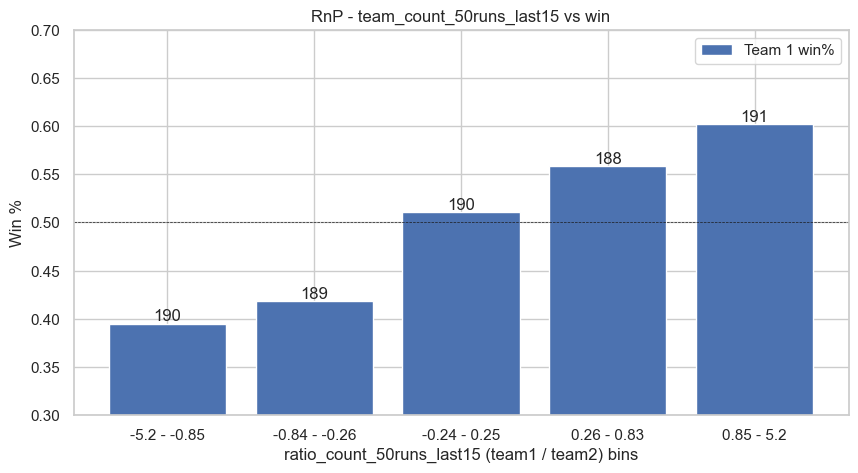

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


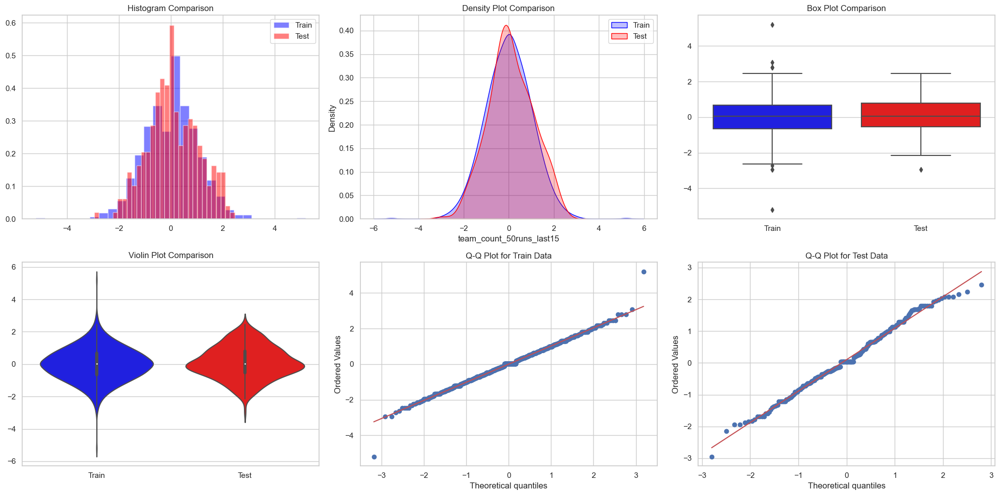

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0566, p-value = 0.4892

Number of outliers in Train:  9

Number of outliers in Test:  1

Skewness of Train:  0.006295174038086638 
Kurtosis of Train:  1.0302344862787187

Skewness of Test:  0.014389321095474864 
Kurtosis of Test:  -0.2900488510265524

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      0.001413    0.102455
std       1.021381    0.986516
min      -5.199338   -2.950958
25%      -0.670760   -0.549163
50%       0.037065    0.037065
75%       0.676984    0.789571
max       5.199338    2.464314
======================================= Model Performance =======================================

Correlation between team_count_50runs_last15 and winner_01 is: -0.15168597598803676

Feature importance wrt team_count_50runs_last15 : 0.5004926151686605


In [59]:
analyse_feature(train_data, 'team_count_50runs_last15')

## Feature 16

In [60]:
def avg_wickets_top5_bowlers(bowler_df, team_roster_ids, date, n=10):
    team_ids = team_roster_ids.split(':')
    bowlers_wickets = []

    for player_id in team_ids:
        recent_matches = giveLastNgamesPlayer(player_id, date, n, 'bowl')
        if not recent_matches.empty:
            total_wickets = recent_matches['wicket_count'].sum()
            bowlers_wickets.append(total_wickets)

    bowlers_wickets.sort(reverse=True)
    top5_bowlers_wickets = bowlers_wickets[:5]

    return sum(top5_bowlers_wickets) / 5 if len(top5_bowlers_wickets) == 5 else sum(top5_bowlers_wickets) / len(top5_bowlers_wickets) if len(top5_bowlers_wickets) > 0 else 0

train_data['team1_avg_wickets_top5_bowlers'] = train_data.apply(lambda x: avg_wickets_top5_bowlers(bowler_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_avg_wickets_top5_bowlers'] = train_data.apply(lambda x: avg_wickets_top5_bowlers(bowler_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

train_data = add_ratio_column(train_data, 'team1_avg_wickets_top5_bowlers', 'team2_avg_wickets_top5_bowlers', 'avg_wickets_top5_bowlers_ratio')
train_data = train_data.drop(columns=['team1_avg_wickets_top5_bowlers', 'team2_avg_wickets_top5_bowlers'])

test_data['team1_avg_wickets_top5_bowlers'] = test_data.apply(lambda x: avg_wickets_top5_bowlers(bowler_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_avg_wickets_top5_bowlers'] = test_data.apply(lambda x: avg_wickets_top5_bowlers(bowler_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

test_data = add_ratio_column(test_data, 'team1_avg_wickets_top5_bowlers', 'team2_avg_wickets_top5_bowlers', 'avg_wickets_top5_bowlers_ratio')
test_data = test_data.drop(columns=['team1_avg_wickets_top5_bowlers', 'team2_avg_wickets_top5_bowlers'])

slope: 0.59 / 0.43 =  1.39


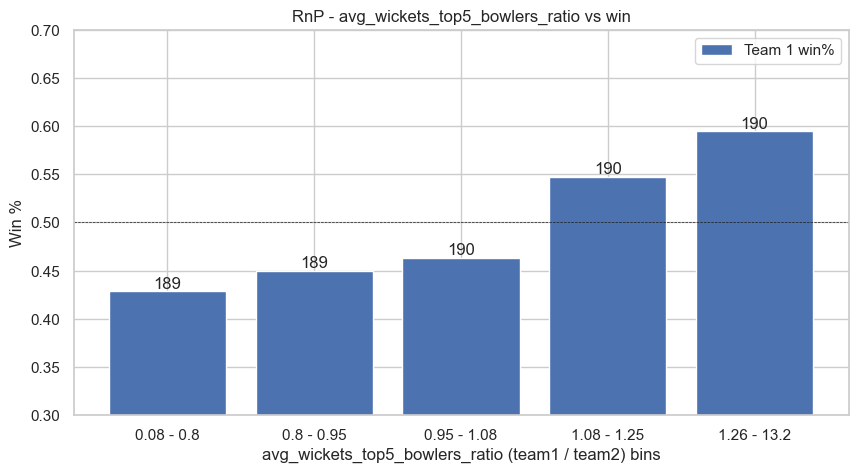

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


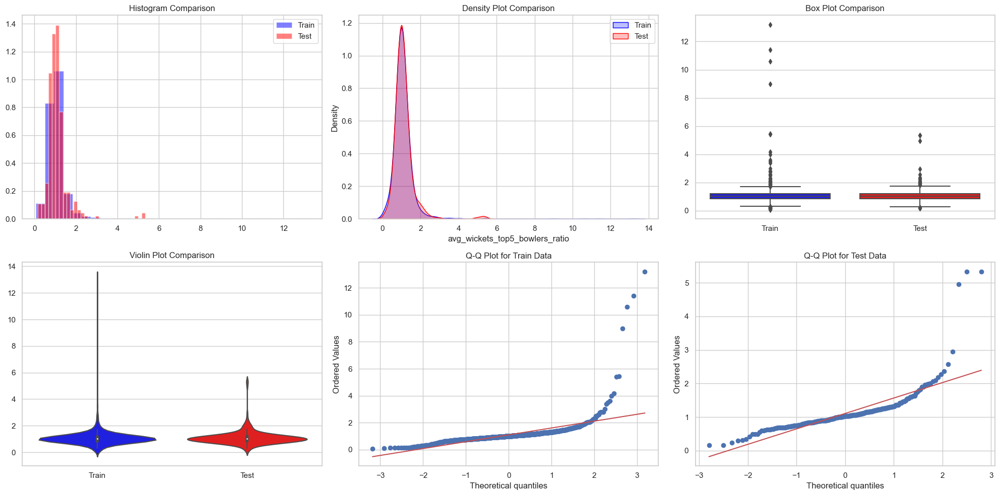

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0419, p-value = 0.8340

Number of outliers in Train:  70

Number of outliers in Test:  21

Skewness of Train:  9.330187593952788 
Kurtosis of Train:  116.37700721240614

Skewness of Test:  4.375572268850873 
Kurtosis of Test:  28.07338603323377

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.101733    1.108728
std       0.798910    0.573842
min       0.076923    0.160000
25%       0.841896    0.844097
50%       1.014599    1.030303
75%       1.191103    1.220350
max      13.200000    5.333333
======================================= Model Performance =======================================

Correlation between avg_wickets_top5_bowlers_ratio and winner_01 is: -0.11181438607661752

Feature importance wrt team_count_50runs_last15 : 0.5867861586604818


In [61]:
analyse_feature(train_data, 'avg_wickets_top5_bowlers_ratio')

## Feature 17

In [62]:
# very good
def win_percentage_fielding_first(matches, team_id, date):
    fielding_first_matches = matches[((matches['team1_id'] == team_id) & (matches['toss decision'] == 'field')) | ((matches['team2_id'] == team_id) & (matches['toss decision'] == 'field')) & (matches['match_dt'] < date)]
    wins = fielding_first_matches[fielding_first_matches['winner_id'] == team_id].shape[0]
    total_matches = fielding_first_matches.shape[0]
    return (wins / total_matches) * 100 if total_matches > 0 else 0

train_data['team1_win_percentage_fielding_first'] = train_data.apply(lambda x: win_percentage_fielding_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
train_data['team2_win_percentage_fielding_first'] = train_data.apply(lambda x: win_percentage_fielding_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)

train_data = add_ratio_column(train_data, 'team1_win_percentage_fielding_first', 'team2_win_percentage_fielding_first', 'win_percentage_fielding_first_ratio')
train_data = train_data.drop(columns=['team1_win_percentage_fielding_first', 'team2_win_percentage_fielding_first'])

test_data['team1_win_percentage_fielding_first'] = test_data.apply(lambda x: win_percentage_fielding_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
test_data['team2_win_percentage_fielding_first'] = test_data.apply(lambda x: win_percentage_fielding_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)

test_data = add_ratio_column(test_data, 'team1_win_percentage_fielding_first', 'team2_win_percentage_fielding_first', 'win_percentage_fielding_first_ratio')
test_data = test_data.drop(columns=['team1_win_percentage_fielding_first', 'team2_win_percentage_fielding_first'])

slope: 0.65 / 0.29 =  2.2


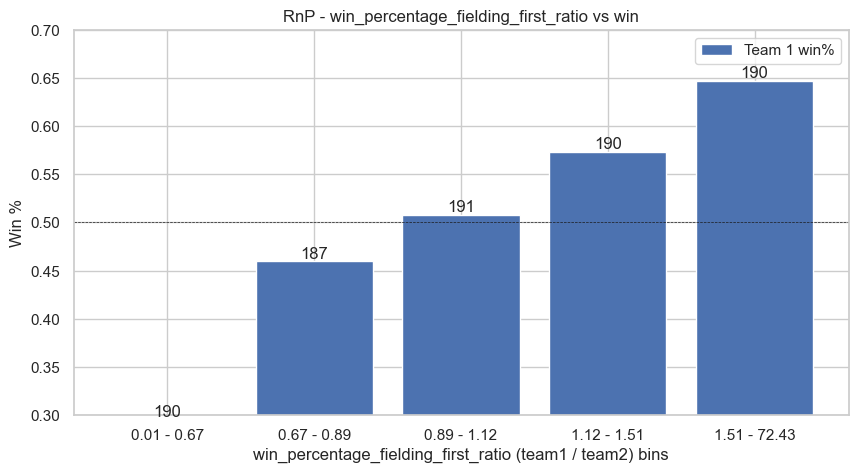

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


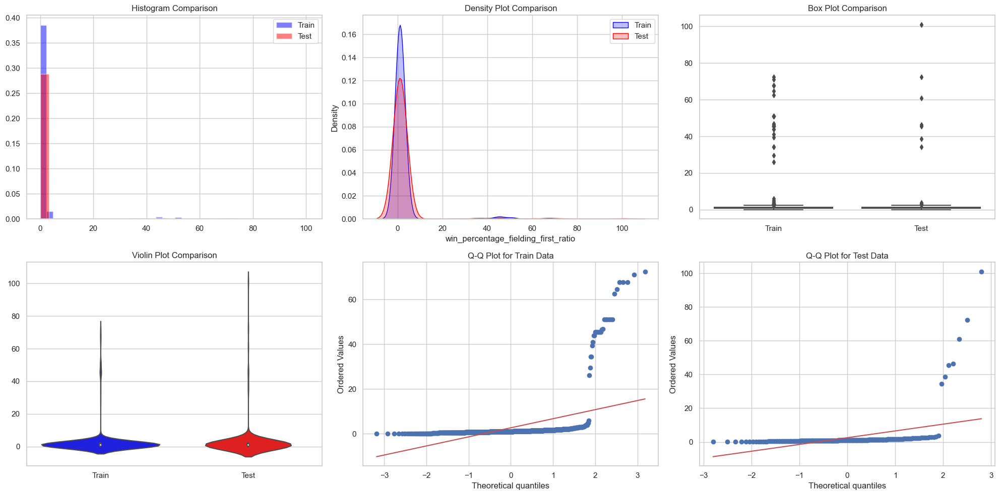

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0431, p-value = 0.8082

Number of outliers in Train:  68

Number of outliers in Test:  14

Skewness of Train:  5.815006234514433 
Kurtosis of Train:  33.94874614089213

Skewness of Test:  7.400634548623151 
Kurtosis of Test:  59.935566501519936

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      2.621871    2.517912
std       8.746654    9.570049
min       0.009901    0.014778
25%       0.732848    0.679828
50%       1.000000    1.000000
75%       1.361325    1.414517
max      72.428571  101.000000
======================================= Model Performance =======================================

Correlation between win_percentage_fielding_first_ratio and winner_01 is: -0.08661003051426971

Feature importance wrt team_count_50runs_last15 : 0.6084085643920647


In [63]:
analyse_feature(train_data, 'win_percentage_fielding_first_ratio')

## Feature 18

In [64]:
# good
def win_percentage_batting_first(matches, team_id, date):
    batting_first_matches = matches[((matches['team1_id'] == team_id) & (matches['toss decision'] == 'bat')) | ((matches['team2_id'] == team_id) & (matches['toss decision'] == 'bat')) & (matches['match_dt'] < date)]
    wins = batting_first_matches[batting_first_matches['winner_id'] == team_id].shape[0]
    total_matches = batting_first_matches.shape[0]
    return (wins / total_matches) * 100 if total_matches > 0 else 0

train_data['team1_win_percentage_batting_first'] = train_data.apply(lambda x: win_percentage_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
train_data['team2_win_percentage_batting_first'] = train_data.apply(lambda x: win_percentage_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)

train_data = add_ratio_column(train_data, 'team1_win_percentage_batting_first', 'team2_win_percentage_batting_first', 'win_percentage_batting_first_ratio')
train_data = train_data.drop(columns=['team1_win_percentage_batting_first', 'team2_win_percentage_batting_first'])

test_data['team1_win_percentage_batting_first'] = test_data.apply(lambda x: win_percentage_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
test_data['team2_win_percentage_batting_first'] = test_data.apply(lambda x: win_percentage_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)

test_data = add_ratio_column(test_data, 'team1_win_percentage_batting_first', 'team2_win_percentage_batting_first', 'win_percentage_batting_first_ratio')
test_data = test_data.drop(columns=['team1_win_percentage_batting_first', 'team2_win_percentage_batting_first'])

slope: 0.61 / 0.36 =  1.71


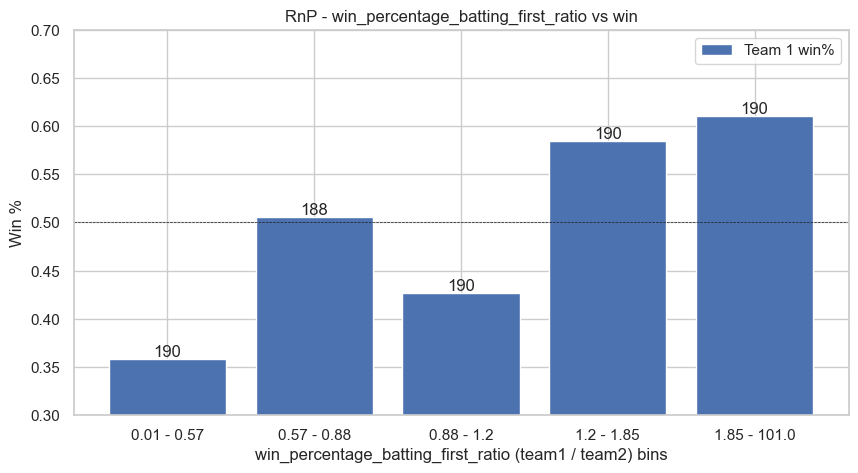

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


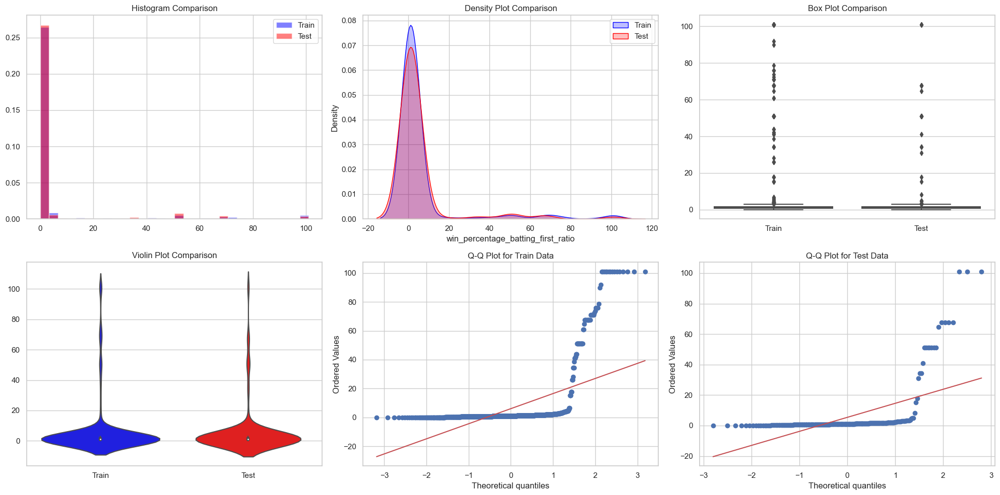

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0510, p-value = 0.6207

Number of outliers in Train:  108

Number of outliers in Test:  32

Skewness of Train:  3.8763744718641138 
Kurtosis of Train:  14.534499453504715

Skewness of Test:  4.110513488981026 
Kurtosis of Test:  17.35567634933655

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      6.047244    5.395345
std      18.177845   16.046145
min       0.009901    0.009901
25%       0.654938    0.623178
50%       1.000000    1.000000
75%       1.595169    1.571017
max     101.000000  101.000000
======================================= Model Performance =======================================

Correlation between win_percentage_batting_first_ratio and winner_01 is: -0.09786068444398006

Feature importance wrt team_count_50runs_last15 : 0.5738664282665248


In [65]:
analyse_feature(train_data, 'win_percentage_batting_first_ratio')

## Feature 19

In [66]:
def performance_against_common_opponents(matches, team_id, opponent_id, date, n=5):
    team_matches = matches[((matches['team1_id'] == team_id) | (matches['team2_id'] == team_id)) & (matches['match_dt'] < date)].sort_values(by='match_dt', ascending=False).head(n)
    opponent_matches = matches[((matches['team1_id'] == opponent_id) | (matches['team2_id'] == opponent_id)) & (matches['match_dt'] < date)].sort_values(by='match_dt', ascending=False).head(n)
    common_opponents = set(team_matches['team1_id']).union(set(team_matches['team2_id'])).intersection(set(opponent_matches['team1_id']).union(set(opponent_matches['team2_id'])))
    
    total_runs = 0
    total_wickets = 0
    total_matches = 0
    for opponent in common_opponents:
        matches_against_opponent = matches[((matches['team1_id'] == team_id) & (matches['team2_id'] == opponent)) | ((matches['team2_id'] == team_id) & (matches['team1_id'] == opponent)) & (matches['match_dt'] < date)]
        total_runs += matches_against_opponent[matches_against_opponent['team1_id'] == team_id]['inning1_runs'].sum() + matches_against_opponent[matches_against_opponent['team2_id'] == team_id]['inning2_runs'].sum()
        total_wickets += matches_against_opponent[matches_against_opponent['team1_id'] == team_id]['inning2_wickets'].sum() + matches_against_opponent[matches_against_opponent['team2_id'] == team_id]['inning1_wickets'].sum()
        total_matches += matches_against_opponent.shape[0]
    
    return total_runs / total_matches if total_matches > 0 else 0, total_wickets / total_matches if total_matches > 0 else 0

# Apply to training data
train_data['team1_performance_against_common_opponents'], train_data['team1_wickets_against_common_opponents'] = zip(*train_data.apply(lambda x: performance_against_common_opponents(match_lvl_data, x['team1_id'], x['team2_id'], x['match_dt']), axis=1))
train_data['team2_performance_against_common_opponents'], train_data['team2_wickets_against_common_opponents'] = zip(*train_data.apply(lambda x: performance_against_common_opponents(match_lvl_data, x['team2_id'], x['team1_id'], x['match_dt']), axis=1))
train_data = add_ratio_column(train_data, 'team1_performance_against_common_opponents', 'team2_performance_against_common_opponents', 'performance_against_common_opponents_ratio')
train_data = add_ratio_column(train_data, 'team1_wickets_against_common_opponents', 'team2_wickets_against_common_opponents', 'wickets_against_common_opponents_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_performance_against_common_opponents', 'team2_performance_against_common_opponents', 'team1_wickets_against_common_opponents', 'team2_wickets_against_common_opponents'])

# Apply to test data
test_data['team1_performance_against_common_opponents'], test_data['team1_wickets_against_common_opponents'] = zip(*test_data.apply(lambda x: performance_against_common_opponents(match_lvl_data, x['team1_id'], x['team2_id'], x['match_dt']), axis=1))
test_data['team2_performance_against_common_opponents'], test_data['team2_wickets_against_common_opponents'] = zip(*test_data.apply(lambda x: performance_against_common_opponents(match_lvl_data, x['team2_id'], x['team1_id'], x['match_dt']), axis=1))
test_data = add_ratio_column(test_data, 'team1_performance_against_common_opponents', 'team2_performance_against_common_opponents', 'performance_against_common_opponents_ratio')
test_data = add_ratio_column(test_data, 'team1_wickets_against_common_opponents', 'team2_wickets_against_common_opponents', 'wickets_against_common_opponents_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_performance_against_common_opponents', 'team2_performance_against_common_opponents', 'team1_wickets_against_common_opponents', 'team2_wickets_against_common_opponents'])

slope: 0.63 / 0.38 =  1.69


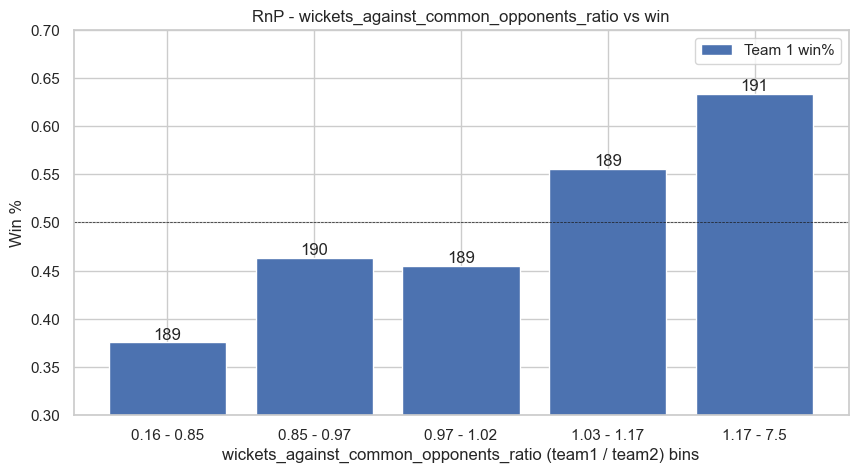

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


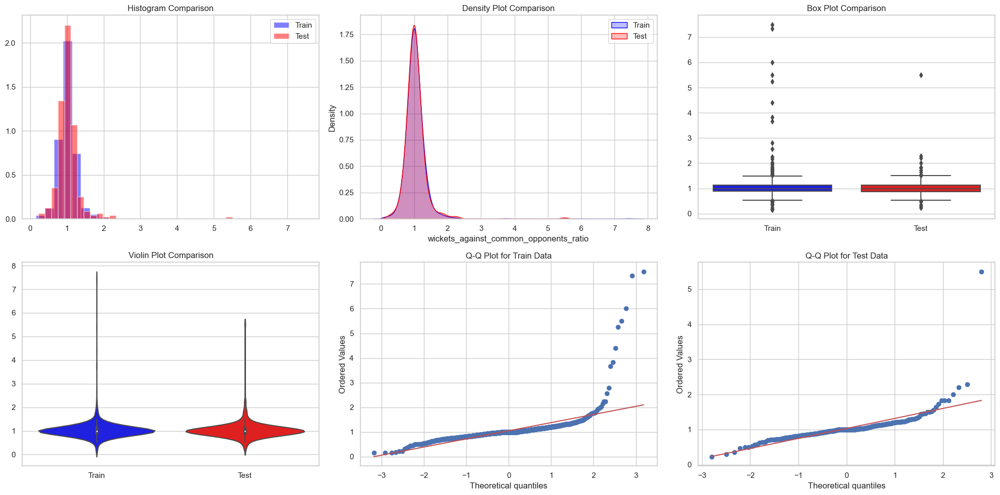

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0324, p-value = 0.9738

Number of outliers in Train:  56

Number of outliers in Test:  17

Skewness of Train:  7.913172631937258 
Kurtosis of Train:  85.39054900097119

Skewness of Test:  6.733899936635297 
Kurtosis of Test:  76.49760772357585

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.053344    1.031586
std       0.491363    0.373246
min       0.157895    0.227273
25%       0.887232    0.877311
50%       1.000000    1.000000
75%       1.131552    1.126770
max       7.500000    5.500000
======================================= Model Performance =======================================

Correlation between wickets_against_common_opponents_ratio and winner_01 is: -0.08684346765618721

Feature importance wrt team_count_50runs_last15 : 0.5852042245743514


In [67]:
analyse_feature(train_data, 'wickets_against_common_opponents_ratio')

## Feature 20

In [68]:
def consistency_index(matches, team_id, date, n=5):
    recent_matches = matches[((matches['team1_id'] == team_id) | (matches['team2_id'] == team_id)) & (matches['match_dt'] < date)].sort_values(by='match_dt', ascending=False).head(n)
    total_matches = recent_matches.shape[0]
    if total_matches == 0:
        return 0
    
    wins = recent_matches[recent_matches['winner_id'] == team_id].shape[0]
    win_percentage = (wins / total_matches) * 100
    return win_percentage

# Apply to training data
train_data['team1_consistency_index'] = train_data.apply(lambda x: consistency_index(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
train_data['team2_consistency_index'] = train_data.apply(lambda x: consistency_index(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_consistency_index', 'team2_consistency_index', 'consistency_index_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_consistency_index', 'team2_consistency_index'])

# Apply to test data
test_data['team1_consistency_index'] = test_data.apply(lambda x: consistency_index(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
test_data['team2_consistency_index'] = test_data.apply(lambda x: consistency_index(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_consistency_index', 'team2_consistency_index', 'consistency_index_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_consistency_index', 'team2_consistency_index'])

slope: 0.58 / 0.4 =  1.47


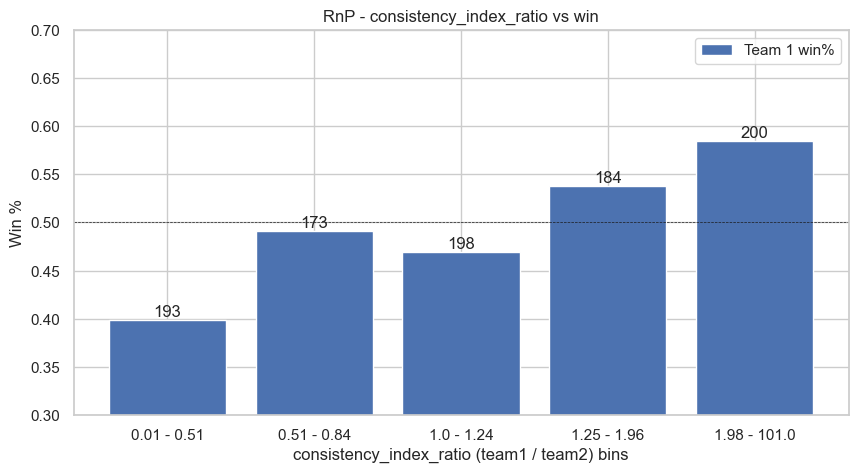

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


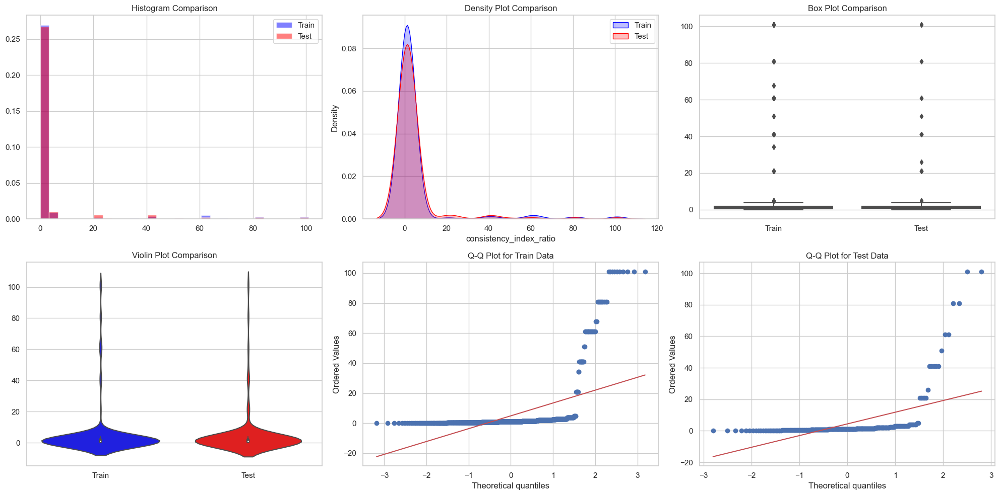

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0467, p-value = 0.7246

Number of outliers in Train:  64

Number of outliers in Test:  20

Skewness of Train:  4.498654842422984 
Kurtosis of Train:  20.183074522614504

Skewness of Test:  5.04996594870446 
Kurtosis of Test:  27.367256341435862

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      4.904243    4.379993
std      15.839606   13.643121
min       0.009901    0.009901
25%       0.603960    0.672131
50%       1.000000    1.000000
75%       1.952381    1.952381
max     101.000000  101.000000
======================================= Model Performance =======================================

Correlation between consistency_index_ratio and winner_01 is: -0.011711885392574893

Feature importance wrt team_count_50runs_last15 : 0.31266804390494884


In [69]:
analyse_feature(train_data, 'consistency_index_ratio')

## Feature 21

In [70]:
# Function to calculate average runs scored batting first
def avg_runs_batting_first(matches, team_id, date):
    batting_first_matches = matches[(matches['match_dt'] < date) & (((matches['team1_id'] == team_id) & (matches['toss decision'] == 'bat')) | ((matches['team2_id'] == team_id) & (matches['toss decision'] == 'field')))]
    runs_scored = batting_first_matches.apply(lambda x: x['inning1_runs'] if x['team1_id'] == team_id else x['inning2_runs'], axis=1).sum()
    total_matches = batting_first_matches.shape[0]
    return runs_scored / total_matches if total_matches > 0 else 0

# Apply to training data
train_data['team1_avg_runs_batting_first'] = train_data.apply(lambda x: avg_runs_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
train_data['team2_avg_runs_batting_first'] = train_data.apply(lambda x: avg_runs_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_runs_batting_first', 'team2_avg_runs_batting_first', 'avg_runs_batting_first_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_runs_batting_first', 'team2_avg_runs_batting_first'])

# Apply to test data
test_data['team1_avg_runs_batting_first'] = test_data.apply(lambda x: avg_runs_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
test_data['team2_avg_runs_batting_first'] = test_data.apply(lambda x: avg_runs_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_runs_batting_first', 'team2_avg_runs_batting_first', 'avg_runs_batting_first_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_runs_batting_first', 'team2_avg_runs_batting_first'])

slope: 0.54 / 0.43 =  1.26


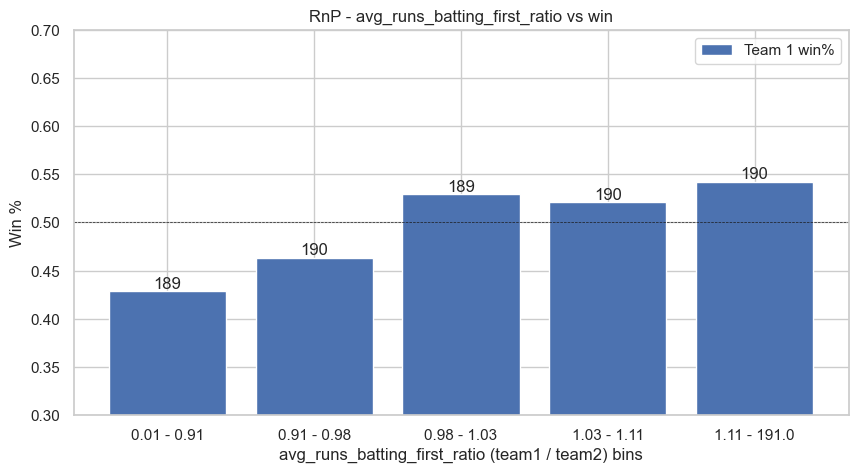

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


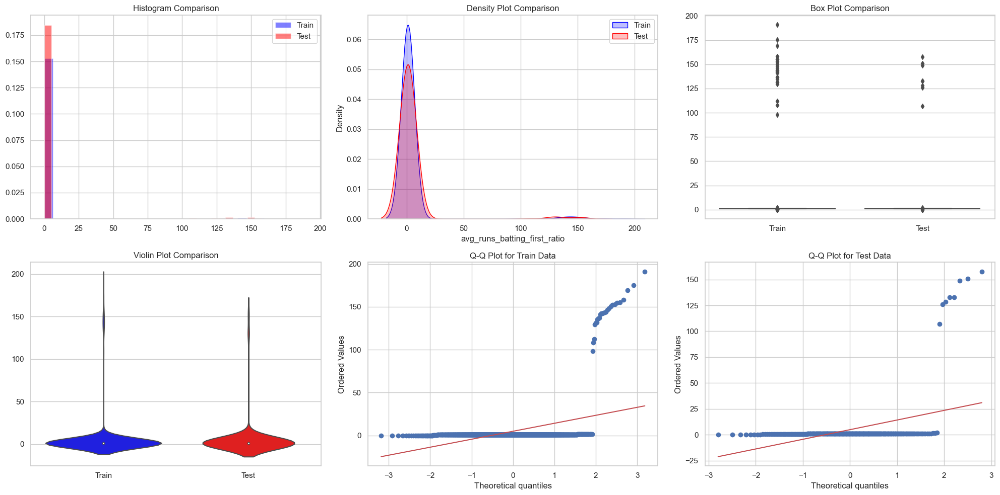

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0532, p-value = 0.5668

Number of outliers in Train:  86

Number of outliers in Test:  21

Skewness of Train:  5.961550998662009 
Kurtosis of Train:  34.28332668233831

Skewness of Test:  5.703200630451976 
Kurtosis of Test:  31.181429117911858

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      4.889580    4.954848
std      23.487438   22.953966
min       0.005348    0.005348
25%       0.937905    0.926839
50%       1.004060    1.005213
75%       1.078556    1.098727
max     191.000000  157.625000
======================================= Model Performance =======================================

Correlation between avg_runs_batting_first_ratio and winner_01 is: -0.02206605861262431

Feature importance wrt team_count_50runs_last15 : 0.611266379750842


In [71]:
analyse_feature(train_data, 'avg_runs_batting_first_ratio')

## Feature 22

In [72]:
# Function to calculate average wickets taken batting first
def avg_wickets_taken_batting_first(matches, team_id, date):
    batting_first_matches = matches[(matches['match_dt'] < date) & (((matches['team1_id'] == team_id) & (matches['toss decision'] == 'bat')) | ((matches['team2_id'] == team_id) & (matches['toss decision'] == 'field')))]
    wickets_taken = batting_first_matches.apply(lambda x: x['inning2_wickets'] if x['team1_id'] == team_id else x['inning1_wickets'], axis=1).sum()
    total_matches = batting_first_matches.shape[0]
    return wickets_taken / total_matches if total_matches > 0 else 0

# Apply to training data
train_data['team1_avg_wickets_taken_batting_first'] = train_data.apply(lambda x: avg_wickets_taken_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
train_data['team2_avg_wickets_taken_batting_first'] = train_data.apply(lambda x: avg_wickets_taken_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_wickets_taken_batting_first', 'team2_avg_wickets_taken_batting_first', 'avg_wickets_taken_batting_first_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_wickets_taken_batting_first', 'team2_avg_wickets_taken_batting_first'])

# Apply to test data
test_data['team1_avg_wickets_taken_batting_first'] = test_data.apply(lambda x: avg_wickets_taken_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
test_data['team2_avg_wickets_taken_batting_first'] = test_data.apply(lambda x: avg_wickets_taken_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_wickets_taken_batting_first', 'team2_avg_wickets_taken_batting_first', 'avg_wickets_taken_batting_first_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_wickets_taken_batting_first', 'team2_avg_wickets_taken_batting_first'])

slope: 0.56 / 0.4 =  1.41


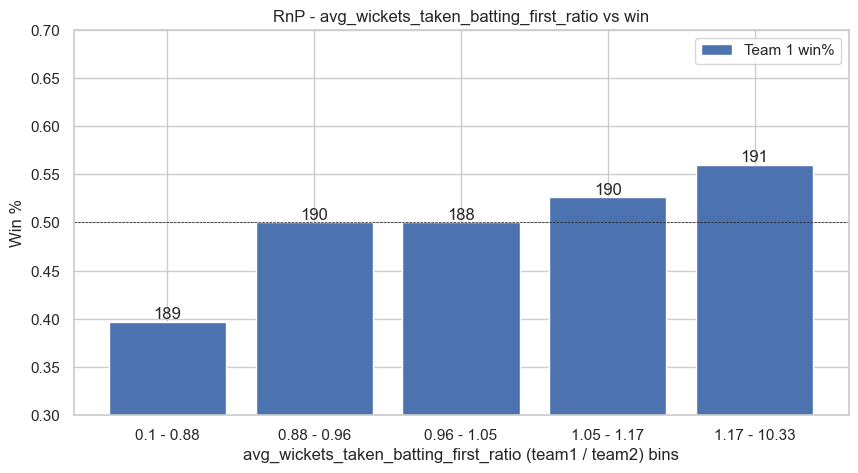

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


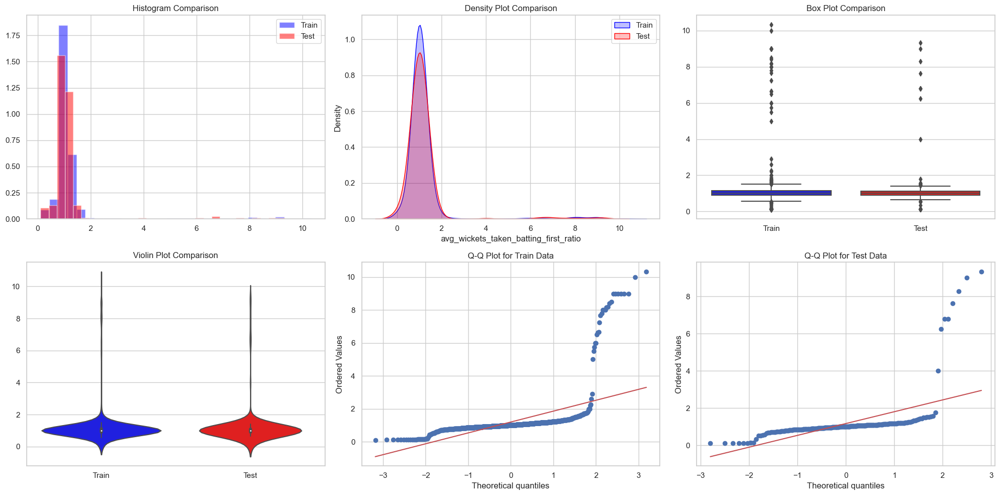

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0581, p-value = 0.4567

Number of outliers in Train:  95

Number of outliers in Test:  31

Skewness of Train:  5.658659277314425 
Kurtosis of Train:  33.10388410120576

Skewness of Test:  5.645865035716662 
Kurtosis of Test:  33.120660382945964

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.195750    1.174541
std       1.160530    1.123515
min       0.100000    0.111111
25%       0.900726    0.900450
50%       1.000000    1.013333
75%       1.140453    1.108936
max      10.333333    9.333333
======================================= Model Performance =======================================

Correlation between avg_wickets_taken_batting_first_ratio and winner_01 is: -0.04101505256414733

Feature importance wrt team_count_50runs_last15 : 0.6042574145463948


In [73]:
analyse_feature(train_data, 'avg_wickets_taken_batting_first_ratio')

## Feature 23

In [74]:
# Function to calculate average wickets conceded fielding first
def avg_wickets_conceded_fielding_first(matches, team_id, date):
    fielding_first_matches = matches[(matches['match_dt'] < date) & (((matches['team1_id'] == team_id) & (matches['toss decision'] == 'field')) | ((matches['team2_id'] == team_id) & (matches['toss decision'] == 'bat')))]
    wickets_conceded = fielding_first_matches.apply(lambda x: x['inning1_wickets'] if x['team1_id'] == team_id else x['inning2_wickets'], axis=1).sum()
    total_matches = fielding_first_matches.shape[0]
    return wickets_conceded / total_matches if total_matches > 0 else 0

# Apply to training data
train_data['team1_avg_wickets_conceded_fielding_first'] = train_data.apply(lambda x: avg_wickets_conceded_fielding_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
train_data['team2_avg_wickets_conceded_fielding_first'] = train_data.apply(lambda x: avg_wickets_conceded_fielding_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_wickets_conceded_fielding_first', 'team2_avg_wickets_conceded_fielding_first', 'avg_wickets_conceded_fielding_first_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_wickets_conceded_fielding_first', 'team2_avg_wickets_conceded_fielding_first'])

# Apply to test data
test_data['team1_avg_wickets_conceded_fielding_first'] = test_data.apply(lambda x: avg_wickets_conceded_fielding_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1)
test_data['team2_avg_wickets_conceded_fielding_first'] = test_data.apply(lambda x: avg_wickets_conceded_fielding_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_wickets_conceded_fielding_first', 'team2_avg_wickets_conceded_fielding_first', 'avg_wickets_conceded_fielding_first_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_wickets_conceded_fielding_first', 'team2_avg_wickets_conceded_fielding_first'])

slope: 0.5 / 0.46 =  1.07


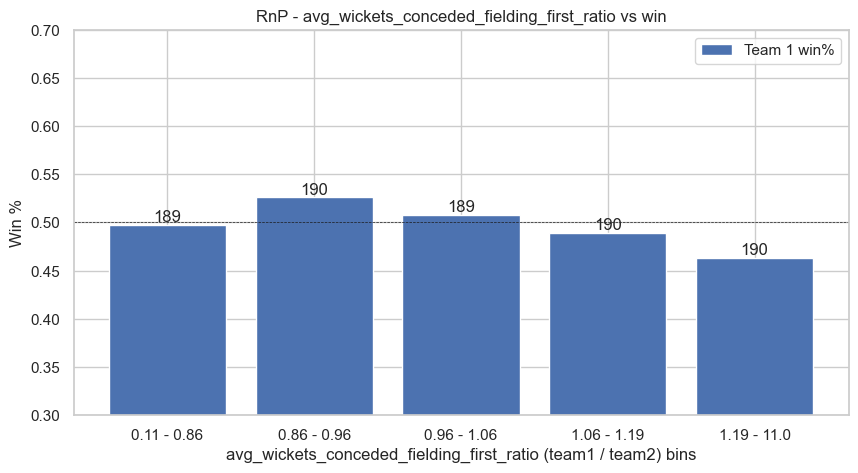

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


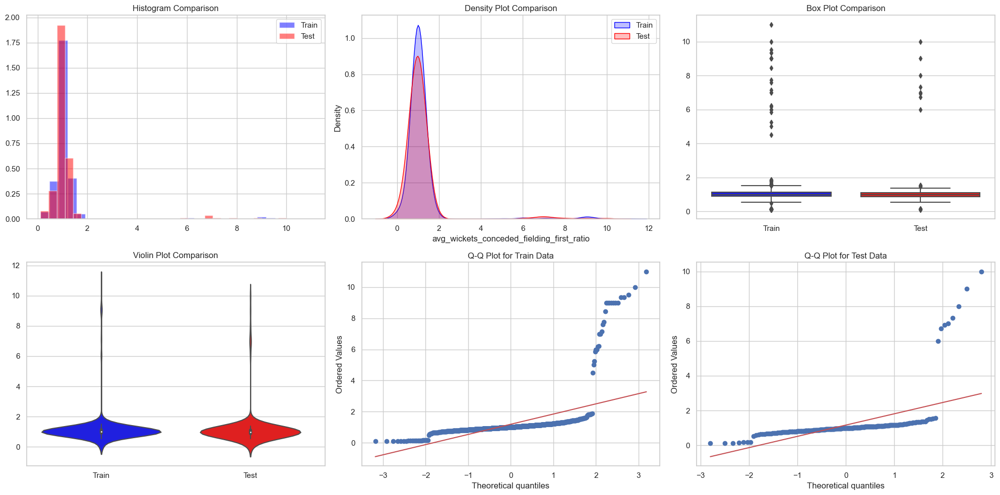

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0829, p-value = 0.1038

Number of outliers in Train:  76

Number of outliers in Test:  20

Skewness of Train:  5.878044797230721 
Kurtosis of Train:  36.00787350197945

Skewness of Test:  5.580631696447931 
Kurtosis of Test:  32.01604956435724

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.190884    1.161033
std       1.167210    1.169365
min       0.107143    0.111111
25%       0.891826    0.861617
50%       1.000000    0.984375
75%       1.143164    1.097697
max      11.000000   10.000000
======================================= Model Performance =======================================

Correlation between avg_wickets_conceded_fielding_first_ratio and winner_01 is: -0.03666041062073696

Feature importance wrt team_count_50runs_last15 : 0.6044817003436319


In [75]:
analyse_feature(train_data, 'avg_wickets_conceded_fielding_first_ratio')

## Feature 24

In [76]:
# Function to calculate match experience score
def match_experience_score(matches, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    total_experience_score = 0

    for player_id in team_ids:
        player_matches = matches[(matches['match_dt'] < date) & ((matches['team1_roster_ids'].str.contains(player_id)) | (matches['team2_roster_ids'].str.contains(player_id)))]
        total_experience_score += player_matches.shape[0]

    return total_experience_score

# Apply to training data
train_data['team1_match_experience_score'] = train_data.apply(lambda x: match_experience_score(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_match_experience_score'] = train_data.apply(lambda x: match_experience_score(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_match_experience_score', 'team2_match_experience_score', 'match_experience_score_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_match_experience_score', 'team2_match_experience_score'])

# Apply to test data
test_data['team1_match_experience_score'] = test_data.apply(lambda x: match_experience_score(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_match_experience_score'] = test_data.apply(lambda x: match_experience_score(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_match_experience_score', 'team2_match_experience_score', 'match_experience_score_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_match_experience_score', 'team2_match_experience_score'])

slope: 0.62 / 0.32 =  1.96


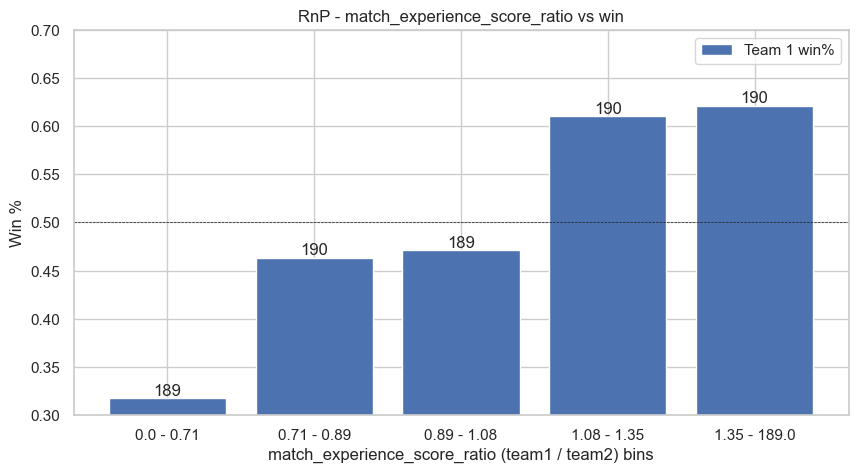

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


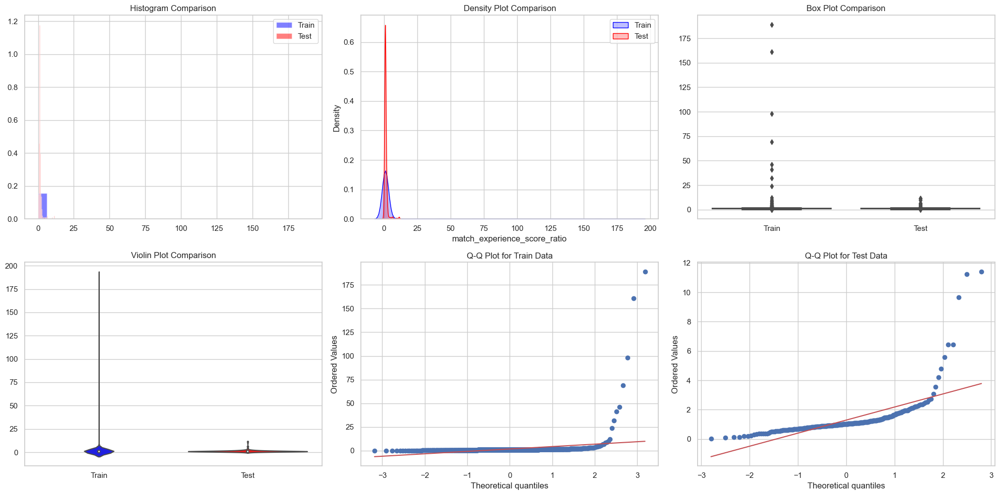

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0777, p-value = 0.1482

Number of outliers in Train:  58

Number of outliers in Test:  27

Skewness of Train:  16.266328198868727 
Kurtosis of Train:  291.03943527469215

Skewness of Test:  5.3667709269925945 
Kurtosis of Test:  35.12391401539378

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.799306    1.291998
std       9.201734    1.283036
min       0.002538    0.035714
25%       0.758016    0.809420
50%       0.982843    1.029316
75%       1.256781    1.301904
max     189.000000   11.414634
======================================= Model Performance =======================================

Correlation between match_experience_score_ratio and winner_01 is: -0.06808629926118802

Feature importance wrt team_count_50runs_last15 : 0.6146594063795077


In [77]:
analyse_feature(train_data, 'match_experience_score_ratio')

## Feature 25

In [78]:
def avg_score_at_ground(matches, ground_id):
    ground_matches = matches[matches['ground_id'] == ground_id]
    total_scores = ground_matches['inning1_runs'].sum() + ground_matches['inning2_runs'].sum()
    total_matches = len(ground_matches) * 2  # as each match has two innings
    return total_scores / total_matches if total_matches > 0 else 0

# Function to calculate team's average score
def avg_team_score(matches, team_id):
    team_matches = matches[(matches['team1_id'] == team_id) | (matches['team2_id'] == team_id)]
    team_scores = team_matches.apply(lambda x: x['inning1_runs'] if x['team1_id'] == team_id else x['inning2_runs'], axis=1).sum()
    total_innings = len(team_matches) * 2  # as each match has two innings
    return team_scores / total_innings if total_innings > 0 else 0


# Function to calculate team's average score when batting first
def avg_team_score_batting_first(matches, team_id):
    team_matches = matches[matches['team1_id'] == team_id]
    team_scores = team_matches['inning1_runs'].sum()
    total_innings = len(team_matches)
    return team_scores / total_innings if total_innings > 0 else 0

# Function to calculate team's average score when fielding first
def avg_team_score_fielding_first(matches, team_id):
    team_matches = matches[matches['team2_id'] == team_id]
    team_scores = team_matches['inning2_runs'].sum()
    total_innings = len(team_matches)
    return team_scores / total_innings if total_innings > 0 else 0

# Function to calculate ratio of team's avg score to ground's avg score (batting first)
def team_to_ground_avg_score_ratio_batting_first(matches, team_id, ground_id):
    ground_avg_score = avg_score_at_ground(matches, ground_id)
    team_avg_score = avg_team_score_batting_first(matches, team_id)
    return team_avg_score / ground_avg_score if ground_avg_score > 0 else team_avg_score

# Function to calculate ratio of team's avg score to ground's avg score (fielding first)
def team_to_ground_avg_score_ratio_fielding_first(matches, team_id, ground_id):
    ground_avg_score = avg_score_at_ground(matches, ground_id)
    team_avg_score = avg_team_score_fielding_first(matches, team_id)
    return team_avg_score / ground_avg_score if ground_avg_score > 0 else team_avg_score

# Apply to training data
train_data['team1_avg_score_ground_batting_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
train_data['team2_avg_score_ground_batting_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
# train_data['team1_avg_score_ground_fielding_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
# train_data['team2_avg_score_ground_fielding_first_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)

train_data = add_ratio_column(train_data, 'team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio', 'avg_score_ground_batting_first_ratio')
# train_data = add_ratio_column(train_data, 'team1_avg_score_ground_fielding_first_ratio', 'team2_avg_score_ground_fielding_first_ratio', 'avg_score_ground_fielding_first_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio'])

# Apply to test data
test_data['team1_avg_score_ground_batting_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
test_data['team2_avg_score_ground_batting_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_batting_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
# test_data['team1_avg_score_ground_fielding_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
# test_data['team2_avg_score_ground_fielding_first_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio_fielding_first(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)

test_data = add_ratio_column(test_data, 'team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio', 'avg_score_ground_batting_first_ratio')
# test_data = add_ratio_column(test_data, 'team1_avg_score_ground_fielding_first_ratio', 'team2_avg_score_ground_fielding_first_ratio', 'avg_score_ground_fielding_first_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_score_ground_batting_first_ratio', 'team2_avg_score_ground_batting_first_ratio'])

slope: 0.64 / 0.34 =  1.87


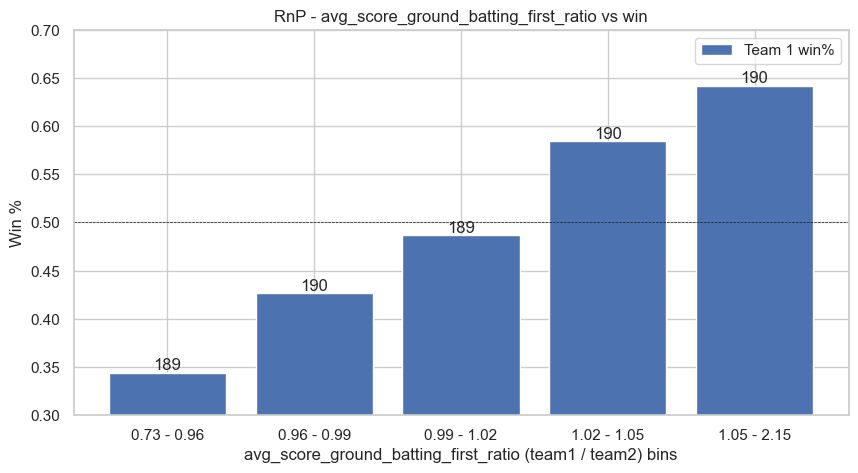

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


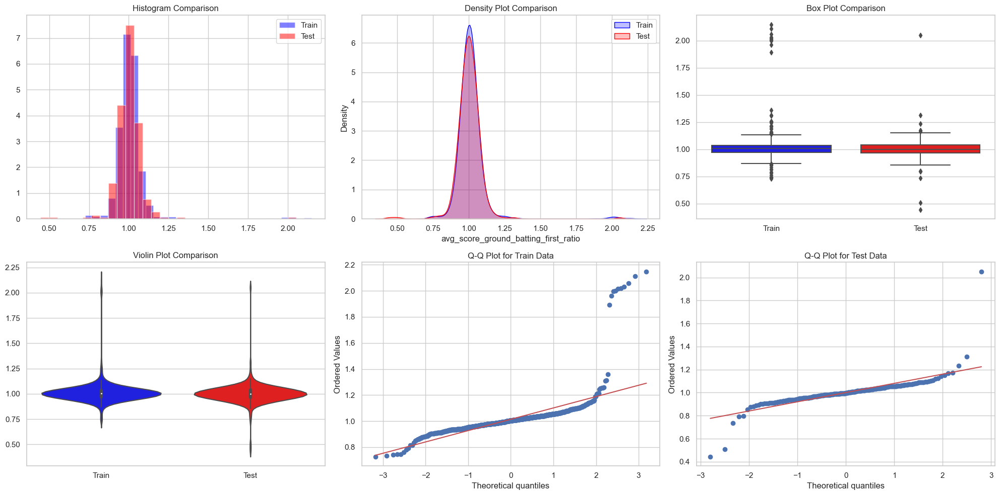

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0553, p-value = 0.5178

Number of outliers in Train:  48

Number of outliers in Test:  10

Skewness of Train:  6.024505999955123 
Kurtosis of Train:  48.38102693421381

Skewness of Test:  3.2633617791963223 
Kurtosis of Test:  49.33236801681444

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.014268    1.000558
std       0.122209    0.100378
min       0.727256    0.443726
25%       0.969008    0.963939
50%       1.005108    0.996985
75%       1.036415    1.038315
max       2.147582    2.051632
======================================= Model Performance =======================================

Correlation between avg_score_ground_batting_first_ratio and winner_01 is: -0.16460790957776952

Feature importance wrt team_count_50runs_last15 : 0.6135377540522013


In [79]:
analyse_feature(train_data, 'avg_score_ground_batting_first_ratio')

## Feature 26

In [80]:
# Function to calculate ground's average score
def avg_score_at_ground(matches, ground_id):
    ground_matches = matches[matches['ground_id'] == ground_id]
    total_scores = ground_matches['inning1_runs'].sum() + ground_matches['inning2_runs'].sum()
    total_matches = len(ground_matches) * 2  # as each match has two innings
    return total_scores / total_matches if total_matches > 0 else 0

# Function to calculate team's average score
def avg_team_score(matches, team_id):
    team_matches = matches[(matches['team1_id'] == team_id) | (matches['team2_id'] == team_id)]
    team_scores = team_matches.apply(lambda x: x['inning1_runs'] if x['team1_id'] == team_id else x['inning2_runs'], axis=1).sum()
    total_innings = len(team_matches) * 2  # as each match has two innings
    return team_scores / total_innings if total_innings > 0 else 0

# Function to calculate ratio of team's avg score to ground's avg score
def team_to_ground_avg_score_ratio(matches, team_id, ground_id):
    ground_avg_score = avg_score_at_ground(matches, ground_id)
    team_avg_score = avg_team_score(matches, team_id)
    return team_avg_score / ground_avg_score if ground_avg_score > 0 else team_avg_score

# Apply to training data
train_data['team1_avg_score_ground_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
train_data['team2_avg_score_ground_ratio'] = train_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio', 'team_avg_score_ground_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio'])

# Apply to test data
test_data['team1_avg_score_ground_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team1_id'], x['ground_id']), axis=1)
test_data['team2_avg_score_ground_ratio'] = test_data.apply(lambda x: team_to_ground_avg_score_ratio(match_lvl_data, x['team2_id'], x['ground_id']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio', 'team_avg_score_ground_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_score_ground_ratio', 'team2_avg_score_ground_ratio'])

slope: 0.6 / 0.32 =  1.89


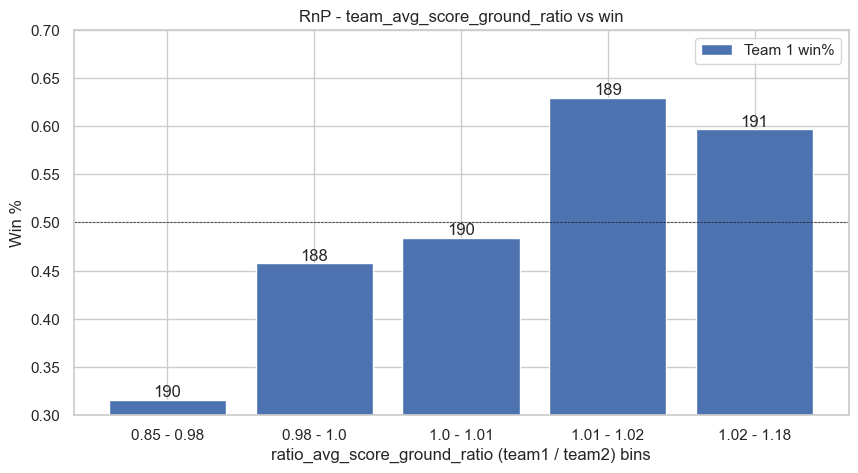

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


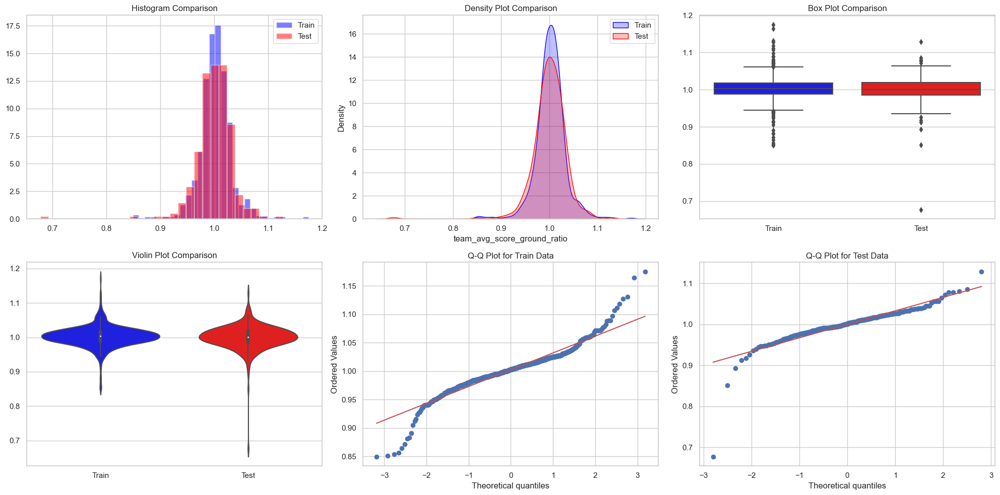

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0620, p-value = 0.3734

Number of outliers in Train:  54

Number of outliers in Test:  12

Skewness of Train:  -0.14195333571059365 
Kurtosis of Train:  5.813077242914682

Skewness of Test:  -2.7360828427827686 
Kurtosis of Test:  23.59265035894354

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.002441    0.999837
std       0.030870    0.036396
min       0.849365    0.677028
25%       0.987881    0.985342
50%       1.003055    1.000601
75%       1.017255    1.019572
max       1.175289    1.128561
======================================= Model Performance =======================================

Correlation between team_avg_score_ground_ratio and winner_01 is: -0.21602246480713405

Feature importance wrt team_count_50runs_last15 : 0.6210983631640734


In [81]:
analyse_feature(train_data, 'team_avg_score_ground_ratio')

## Feature 27

In [82]:
def strike_rate_consistency(batsman_data, team_roster_ids, date, recent_matches=10, top_n=6):
    team_ids = str(team_roster_ids).split(':')
    total_strike_rate = 0
    count = 0
    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_strike_rate += recent_matches_data['strike_rate'].sum()
            count += recent_matches_data.shape[0]
        except ValueError:
            continue
    return (total_strike_rate / count) if count > 0 else 0

# Apply to training data
train_data['team1_strike_rate_consistency'] = train_data.apply(lambda x: strike_rate_consistency(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_strike_rate_consistency'] = train_data.apply(lambda x: strike_rate_consistency(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_strike_rate_consistency', 'team2_strike_rate_consistency', 'strike_rate_consistency_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_strike_rate_consistency', 'team2_strike_rate_consistency'])

# Apply to test data
test_data['team1_strike_rate_consistency'] = test_data.apply(lambda x: strike_rate_consistency(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_strike_rate_consistency'] = test_data.apply(lambda x: strike_rate_consistency(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_strike_rate_consistency', 'team2_strike_rate_consistency', 'strike_rate_consistency_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_strike_rate_consistency', 'team2_strike_rate_consistency'])

slope: 0.58 / 0.38 =  1.54


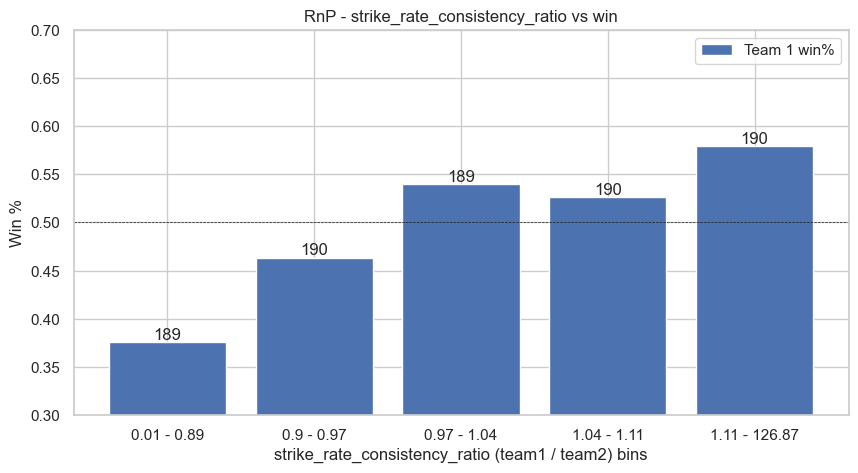

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


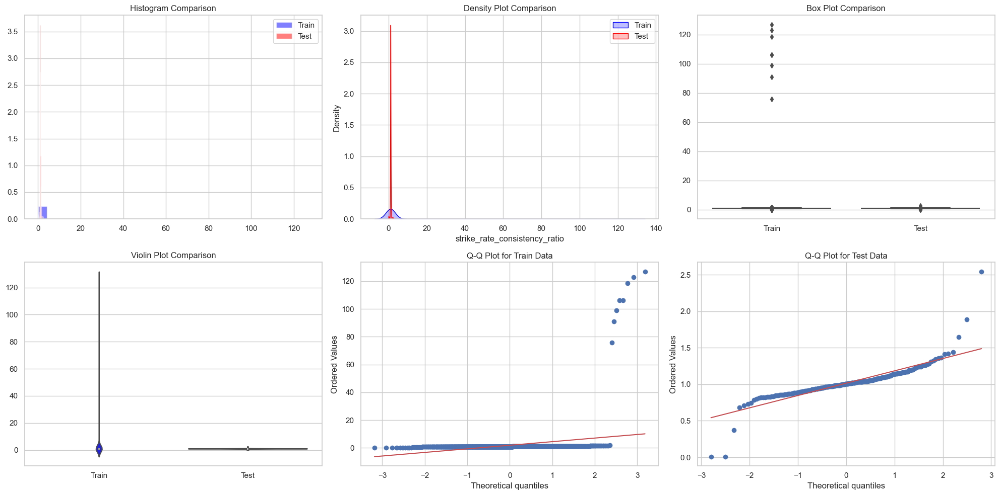

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0560, p-value = 0.5017

Number of outliers in Train:  45

Number of outliers in Test:  15

Skewness of Train:  11.115875714230038 
Kurtosis of Train:  124.13126022423731

Skewness of Test:  1.2828276019109548 
Kurtosis of Test:  20.42556183328059

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.884815    1.015404
std       9.704723    0.193467
min       0.008186    0.008497
25%       0.913281    0.930745
50%       1.000239    1.007865
75%       1.093760    1.080780
max     126.872000    2.544497
======================================= Model Performance =======================================

Correlation between strike_rate_consistency_ratio and winner_01 is: -0.04616754016353654

Feature importance wrt team_count_50runs_last15 : 0.6152474224444368


In [83]:
analyse_feature(train_data, 'strike_rate_consistency_ratio') 

## Feature 28

In [84]:
# Function to calculate the total runs scored by the top 6 batsmen till date
def total_runs_top_batsmen(batsman_data, team_roster_ids, date, top_n=6):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date)]
            total_runs += player_data['runs'].sum()
        except ValueError:
            continue

    return total_runs

# Apply to training data
train_data['team1_total_runs_top_batsmen'] = train_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_total_runs_top_batsmen'] = train_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen', 'total_runs_top_batsmen_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen'])

# Apply to test data
test_data['team1_total_runs_top_batsmen'] = test_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_total_runs_top_batsmen'] = test_data.apply(lambda x: total_runs_top_batsmen(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen', 'total_runs_top_batsmen_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_total_runs_top_batsmen', 'team2_total_runs_top_batsmen'])

slope: 0.64 / 0.36 =  1.77


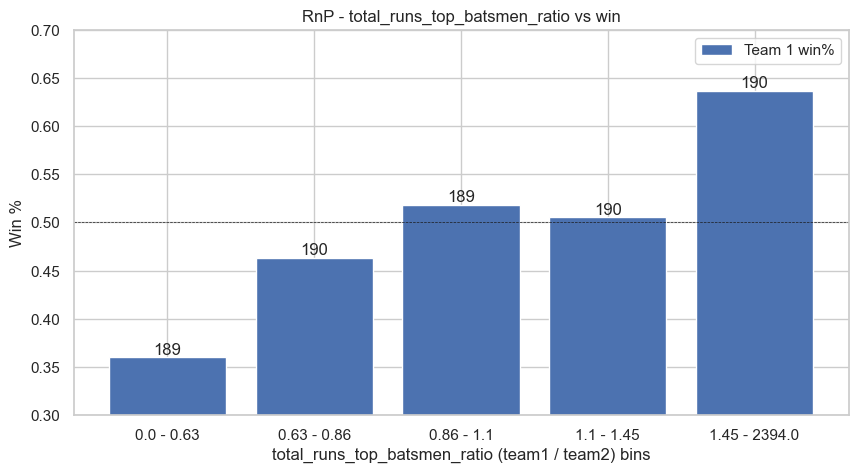

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


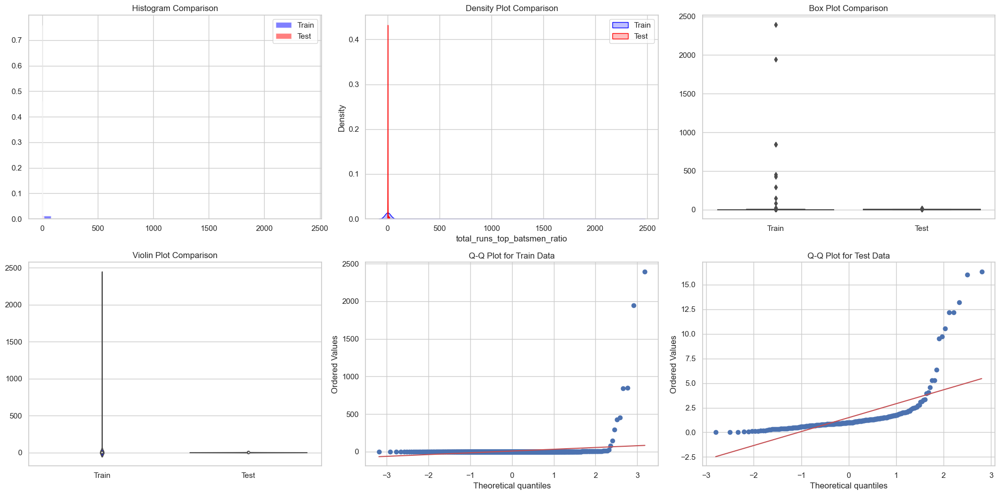

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0694, p-value = 0.2470

Number of outliers in Train:  77

Number of outliers in Test:  22

Skewness of Train:  17.8430152789085 
Kurtosis of Train:  347.0353423617294

Skewness of Test:  4.806483270248223 
Kurtosis of Test:  25.55070860845594

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      9.049217    1.496419
std     109.551843    2.126737
min       0.000217    0.002252
25%       0.693978    0.726186
50%       0.974693    0.976945
75%       1.339098    1.427291
max    2394.000000   16.331111
======================================= Model Performance =======================================

Correlation between total_runs_top_batsmen_ratio and winner_01 is: -0.05139625294243469

Feature importance wrt team_count_50runs_last15 : 0.6274020512649731


In [85]:
analyse_feature(train_data, 'total_runs_top_batsmen_ratio')

## Feature 29

In [86]:
# Function to calculate the total number of 50+ scores by the team's batsmen till date
def total_fifty_scores(batsman_data, team_roster_ids, date, threshold=50):
    team_ids = str(team_roster_ids).split(':')
    fifty_scores = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date) & (batsman_data['runs'] >= threshold)]
            fifty_scores += player_data.shape[0]
        except ValueError:
            continue

    return fifty_scores

# Apply to training data
train_data['team1_total_fifty_scores'] = train_data.apply(lambda x: total_fifty_scores(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_total_fifty_scores'] = train_data.apply(lambda x: total_fifty_scores(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_total_fifty_scores', 'team2_total_fifty_scores', 'fifty_scores_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_total_fifty_scores', 'team2_total_fifty_scores'])

# Apply to test data
test_data['team1_total_fifty_scores'] = test_data.apply(lambda x: total_fifty_scores(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_total_fifty_scores'] = test_data.apply(lambda x: total_fifty_scores(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_total_fifty_scores', 'team2_total_fifty_scores', 'fifty_scores_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_total_fifty_scores', 'team2_total_fifty_scores'])

slope: 0.57 / 0.38 =  1.51


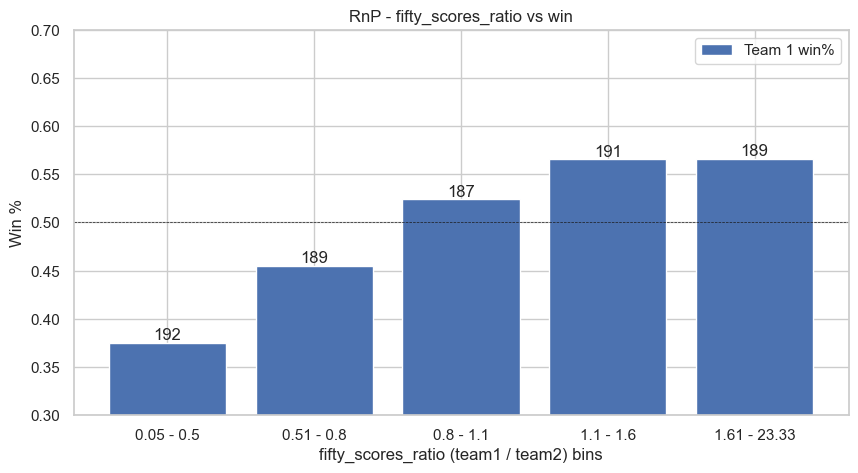

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


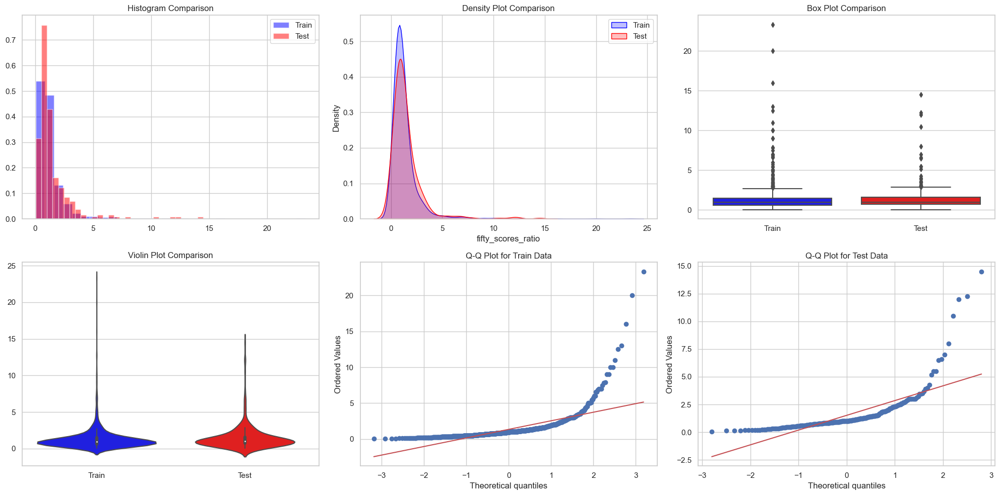

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0940, p-value = 0.0450

Number of outliers in Train:  80

Number of outliers in Test:  28

Skewness of Train:  6.267092246886043 
Kurtosis of Train:  57.62978546814169

Skewness of Test:  4.227762189958231 
Kurtosis of Test:  22.630169016879904

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.344105    1.516691
std       1.700099    1.761850
min       0.047619    0.050000
25%       0.600000    0.726042
50%       0.957428    1.000000
75%       1.467021    1.594231
max      23.333333   14.500000
======================================= Model Performance =======================================

Correlation between fifty_scores_ratio and winner_01 is: -0.10318755393434086

Feature importance wrt team_count_50runs_last15 : 0.5977427374449485


In [87]:
analyse_feature(train_data, 'fifty_scores_ratio')

## Feature 30

In [88]:
# Function to calculate the total runs scored by the top 6 batsmen in recent matches
def total_runs_top_batsmen_recent(batsman_data, team_roster_ids, date, recent_matches=15, top_n=6):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_runs += recent_matches_data['runs'].sum()
        except ValueError:
            continue

    return total_runs

# Apply to training data
train_data['team1_total_runs_top_batsmen_recent'] = train_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_total_runs_top_batsmen_recent'] = train_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent', 'total_runs_top_batsmen_recent_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent'])

# Apply to test data
test_data['team1_total_runs_top_batsmen_recent'] = test_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_total_runs_top_batsmen_recent'] = test_data.apply(lambda x: total_runs_top_batsmen_recent(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent', 'total_runs_top_batsmen_recent_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_total_runs_top_batsmen_recent', 'team2_total_runs_top_batsmen_recent'])

slope: 0.63 / 0.33 =  1.89


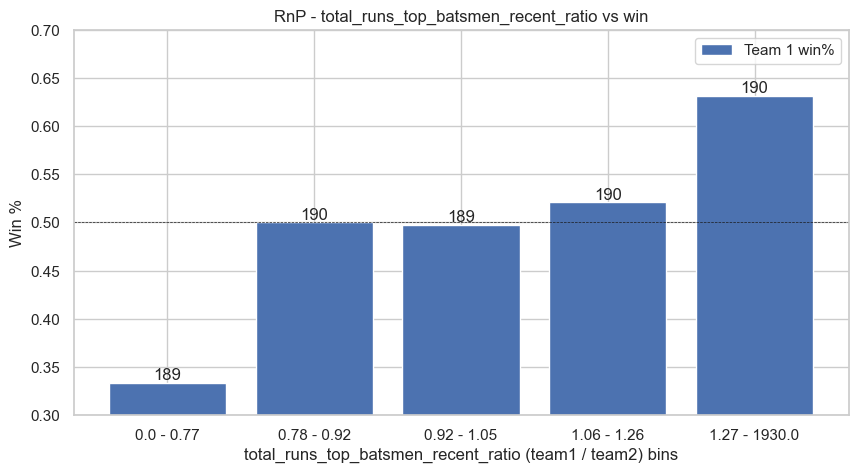

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


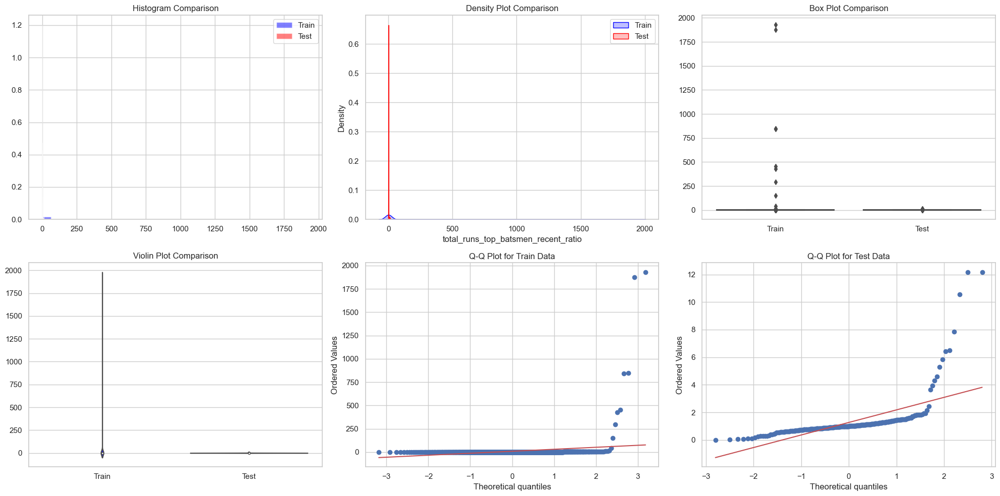

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0535, p-value = 0.5609

Number of outliers in Train:  87

Number of outliers in Test:  23

Skewness of Train:  16.80776463961771 
Kurtosis of Train:  306.0090221814928

Skewness of Test:  5.461071606993953 
Kurtosis of Test:  34.327095661810006

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      8.330381    1.267834
std      98.053513    1.418855
min       0.000570    0.002252
25%       0.816222    0.815174
50%       0.980860    0.993635
75%       1.190124    1.239749
max    1930.000000   12.169492
======================================= Model Performance =======================================

Correlation between total_runs_top_batsmen_recent_ratio and winner_01 is: -0.05063685921279522

Feature importance wrt team_count_50runs_last15 : 0.6181466228495636


In [89]:
analyse_feature(train_data, 'total_runs_top_batsmen_recent_ratio')

## Feature 31

In [90]:
# Function to calculate the average runs scored in powerplay (first 6 overs) in recent matches
def avg_runs_powerplay(batsman_data, team_roster_ids, date, recent_matches=5, powerplay_overs=6):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0
    count = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id) & (batsman_data['over_faced_first'] <= powerplay_overs)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_runs += recent_matches_data['runs'].sum()
            count += recent_matches_data.shape[0]
        except ValueError:
            continue

    avg_runs = total_runs / recent_matches if recent_matches > 0 else 0
    return avg_runs

# Apply to training data
train_data['team1_avg_runs_powerplay'] = train_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_avg_runs_powerplay'] = train_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_avg_runs_powerplay', 'team2_avg_runs_powerplay', 'avg_runs_powerplay_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_runs_powerplay', 'team2_avg_runs_powerplay'])

# Apply to test data
test_data['team1_avg_runs_powerplay'] = test_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_avg_runs_powerplay'] = test_data.apply(lambda x: avg_runs_powerplay(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_avg_runs_powerplay', 'team2_avg_runs_powerplay', 'avg_runs_powerplay_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_runs_powerplay', 'team2_avg_runs_powerplay'])

slope: 0.6 / 0.42 =  1.42


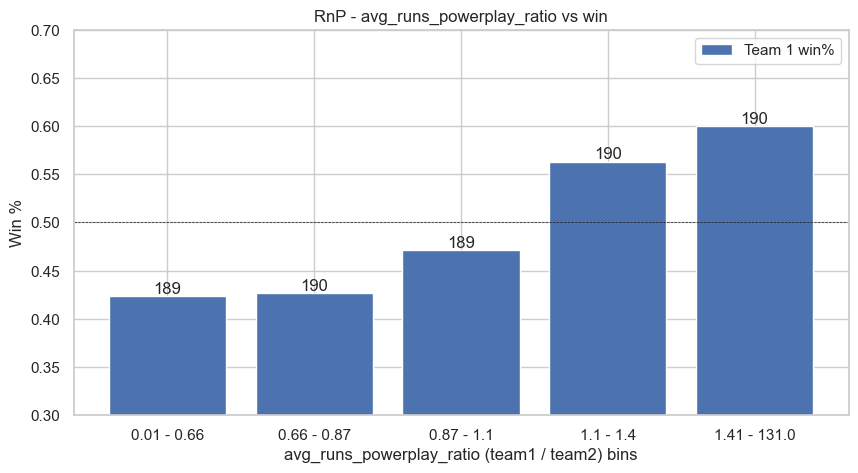

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


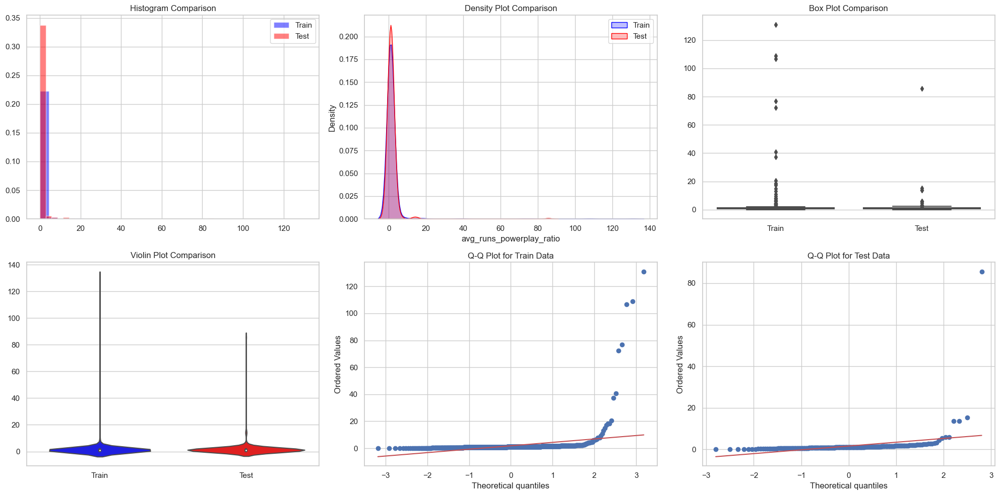

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0840, p-value = 0.0955

Number of outliers in Train:  52

Number of outliers in Test:  17

Skewness of Train:  12.951484597985738 
Kurtosis of Train:  182.45388522287934

Skewness of Test:  14.567378981412798 
Kurtosis of Test:  226.9489203604018

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.816087    1.620891
std       7.629981    5.351661
min       0.009597    0.019455
25%       0.713538    0.736218
50%       0.982918    1.017822
75%       1.292189    1.381868
max     131.000000   85.600000
======================================= Model Performance =======================================

Correlation between avg_runs_powerplay_ratio and winner_01 is: -0.056234772182689255

Feature importance wrt team_count_50runs_last15 : 0.6148609590525943


In [91]:
analyse_feature(train_data, 'avg_runs_powerplay_ratio')

## Feature 32

In [92]:
# Function to calculate the frequency of boundaries (fours and sixes) scored by the team's batsmen in recent matches
def boundary_frequency(batsman_data, team_roster_ids, date, recent_matches=15):
    team_ids = str(team_roster_ids).split(':')
    total_boundaries = 0
    total_balls_faced = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            recent_matches_data = batsman_data[(batsman_data['match_dt'] < date) & (batsman_data['batsman_id'] == player_id)].sort_values(by='match_dt', ascending=False).head(recent_matches)
            total_boundaries += recent_matches_data['Fours'].sum() + recent_matches_data['Sixes'].sum()
            total_balls_faced += recent_matches_data['balls_faced'].sum()
        except ValueError:
            continue

    boundary_freq = (total_boundaries / total_balls_faced) * 100 if total_balls_faced > 0 else 0
    return boundary_freq

# Apply to training data
train_data['team1_boundary_frequency'] = train_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_boundary_frequency'] = train_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
train_data = add_ratio_column(train_data, 'team1_boundary_frequency', 'team2_boundary_frequency', 'boundary_frequency_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_boundary_frequency', 'team2_boundary_frequency'])

# Apply to test data
test_data['team1_boundary_frequency'] = test_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_boundary_frequency'] = test_data.apply(lambda x: boundary_frequency(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
test_data = add_ratio_column(test_data, 'team1_boundary_frequency', 'team2_boundary_frequency', 'boundary_frequency_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_boundary_frequency', 'team2_boundary_frequency'])

slope: 0.56 / 0.37 =  1.54


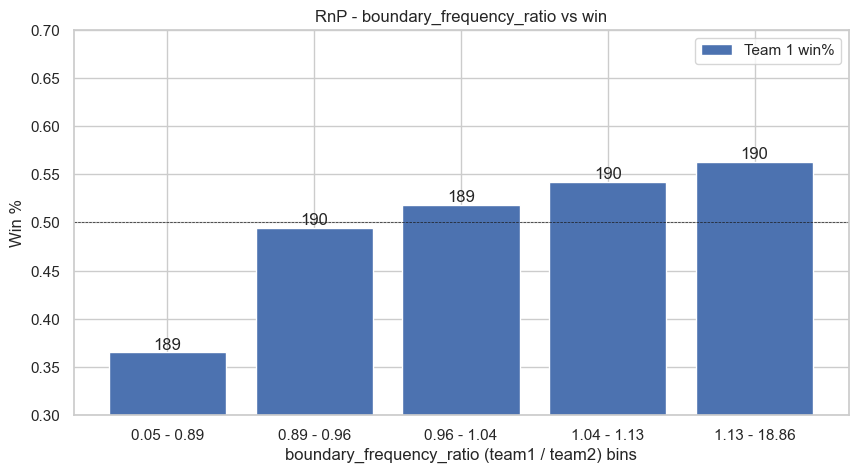

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


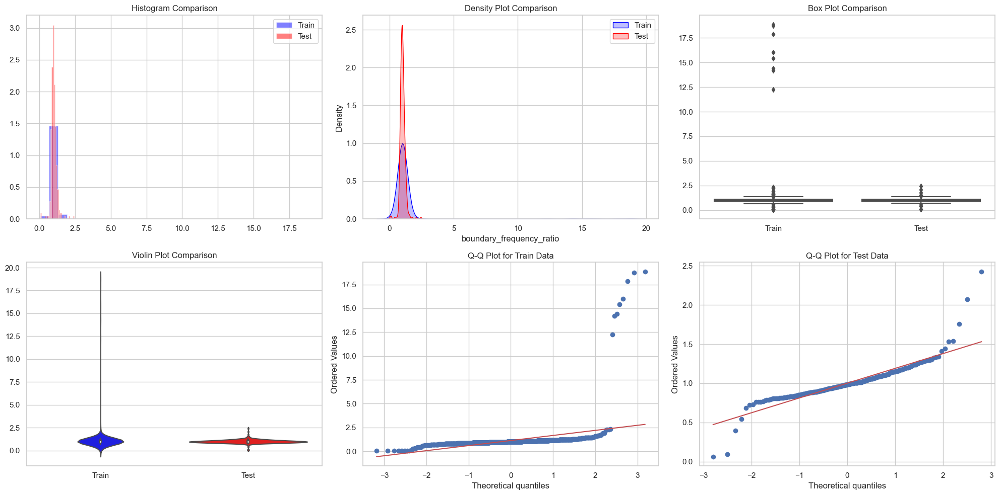

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0682, p-value = 0.2659

Number of outliers in Train:  59

Number of outliers in Test:  11

Skewness of Train:  10.732418895800087 
Kurtosis of Train:  118.41113764250207

Skewness of Test:  1.3509600474655554 
Kurtosis of Test:  12.965413758649884

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.134042    1.001361
std       1.399985    0.207369
min       0.048844    0.063313
25%       0.911754    0.888171
50%       0.997557    0.983684
75%       1.099266    1.087409
max      18.857143    2.425448
======================================= Model Performance =======================================

Correlation between boundary_frequency_ratio and winner_01 is: -0.0624026751466421

Feature importance wrt team_count_50runs_last15 : 0.6247574984809946


In [93]:
analyse_feature(train_data, 'boundary_frequency_ratio')

## Feature 33

In [94]:
def series_win_percentage(matches, team_id, series_name, date):
    series_matches = matches[(matches['series_name'] == series_name) & (matches['match_dt'] < date)]
    total_matches = series_matches[(series_matches['team1_id'] == team_id) | (series_matches['team2_id'] == team_id)].shape[0]
    total_wins = series_matches[series_matches['winner_id'] == team_id].shape[0]
    win_percentage = (total_wins / total_matches) * 100 if total_matches > 0 else 0
    return win_percentage

# Apply to training data
train_data['team1_series_win_percentage'] = train_data.apply(
    lambda x: series_win_percentage(match_lvl_data, x['team1_id'], x['series_name'], x['match_dt']), axis=1
)
train_data['team2_series_win_percentage'] = train_data.apply(
    lambda x: series_win_percentage(match_lvl_data, x['team2_id'], x['series_name'], x['match_dt']), axis=1
)
train_data = add_ratio_column(train_data, 'team1_series_win_percentage', 'team2_series_win_percentage', 'series_win_percentage_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_series_win_percentage', 'team2_series_win_percentage'])

# Apply to test data
test_data['team1_series_win_percentage'] = test_data.apply(
    lambda x: series_win_percentage(match_lvl_data, x['team1_id'], x['series_name'], x['match_dt']), axis=1
)
test_data['team2_series_win_percentage'] = test_data.apply(
    lambda x: series_win_percentage(match_lvl_data, x['team2_id'], x['series_name'], x['match_dt']), axis=1
)
test_data = add_ratio_column(test_data, 'team1_series_win_percentage', 'team2_series_win_percentage', 'series_win_percentage_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_series_win_percentage', 'team2_series_win_percentage'])

slope: 0.57 / 0.39 =  1.47


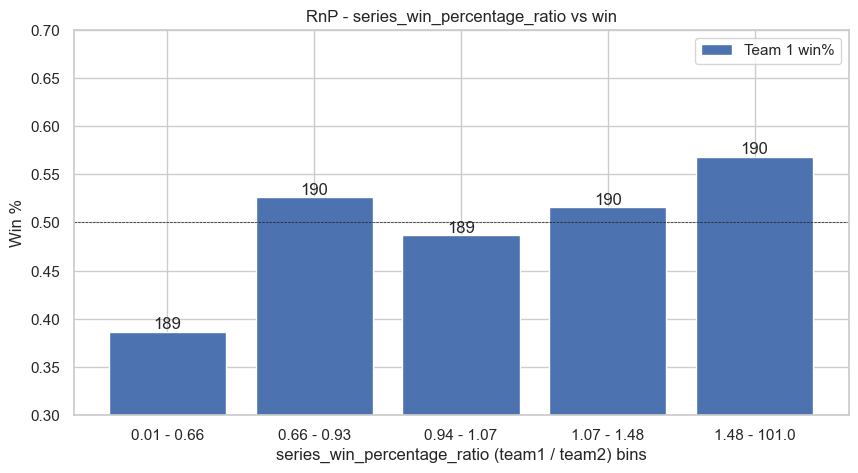

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


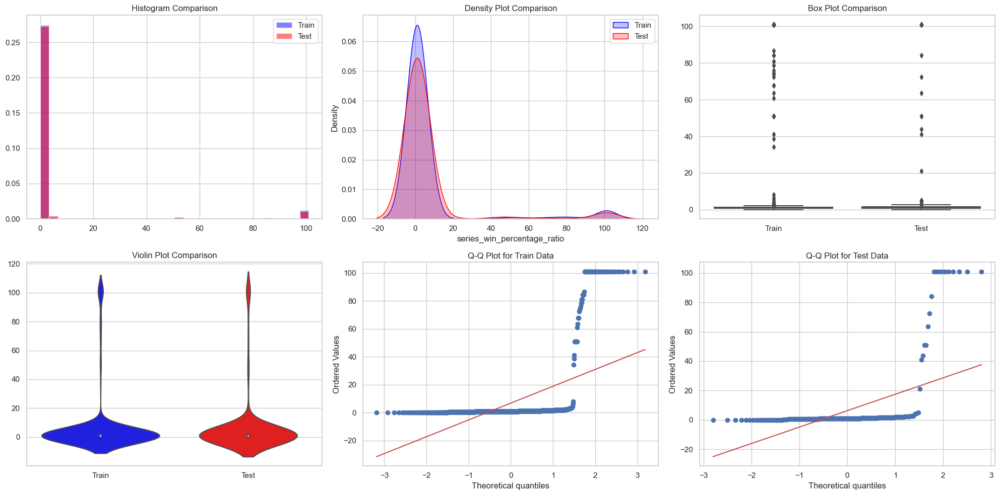

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0494, p-value = 0.6583

Number of outliers in Train:  95

Number of outliers in Test:  24

Skewness of Train:  3.6901982037186314 
Kurtosis of Train:  12.078221769631199

Skewness of Test:  3.989484372165575 
Kurtosis of Test:  14.677499542789189

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      6.857238    6.273502
std      22.154934   20.850136
min       0.009901    0.009901
25%       0.751063    0.673203
50%       1.000000    1.000000
75%       1.327335    1.446758
max     101.000000  101.000000
======================================= Model Performance =======================================

Correlation between series_win_percentage_ratio and winner_01 is: -0.030379522012544697

Feature importance wrt team_count_50runs_last15 : 0.5450566105190937


In [95]:
analyse_feature(train_data, 'series_win_percentage_ratio')

## Feature 34

In [96]:
def avg_wickets_in_season(matches, bowler_data, team_roster_ids, season, date):
    season_match_ids = matches[(matches['season'] == season) & (matches['match_dt'] < date)]['match id'].unique()
    team_ids = str(team_roster_ids).split(':')
    total_wickets = 0
    total_matches = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            season_matches = bowler_data[(bowler_data['match id'].isin(season_match_ids)) & (bowler_data['bowler_id'] == player_id)]
            total_wickets += season_matches['wicket_count'].sum()
            total_matches += season_matches.shape[0]
        except ValueError:
            continue

    avg_wickets = total_wickets / total_matches if total_matches > 0 else 0
    return avg_wickets

# Apply to training data
train_data['team1_avg_wickets_in_season'] = train_data.apply(
    lambda x: avg_wickets_in_season(match_lvl_data, bowler_lvl_data, x['team1_roster_ids'], x['season'], x['match_dt']), axis=1
)
train_data['team2_avg_wickets_in_season'] = train_data.apply(
    lambda x: avg_wickets_in_season(match_lvl_data, bowler_lvl_data, x['team2_roster_ids'], x['season'], x['match_dt']), axis=1
)
train_data = add_ratio_column(train_data, 'team1_avg_wickets_in_season', 'team2_avg_wickets_in_season', 'avg_wickets_in_season_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_wickets_in_season', 'team2_avg_wickets_in_season'])

# Apply to test data
test_data['team1_avg_wickets_in_season'] = test_data.apply(
    lambda x: avg_wickets_in_season(match_lvl_data, bowler_lvl_data, x['team1_roster_ids'], x['season'], x['match_dt']), axis=1
)
test_data['team2_avg_wickets_in_season'] = test_data.apply(
    lambda x: avg_wickets_in_season(match_lvl_data, bowler_lvl_data, x['team2_roster_ids'], x['season'], x['match_dt']), axis=1
)
test_data = add_ratio_column(test_data, 'team1_avg_wickets_in_season', 'team2_avg_wickets_in_season', 'avg_wickets_in_season_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_wickets_in_season', 'team2_avg_wickets_in_season'])

slope: 0.57 / 0.44 =  1.28


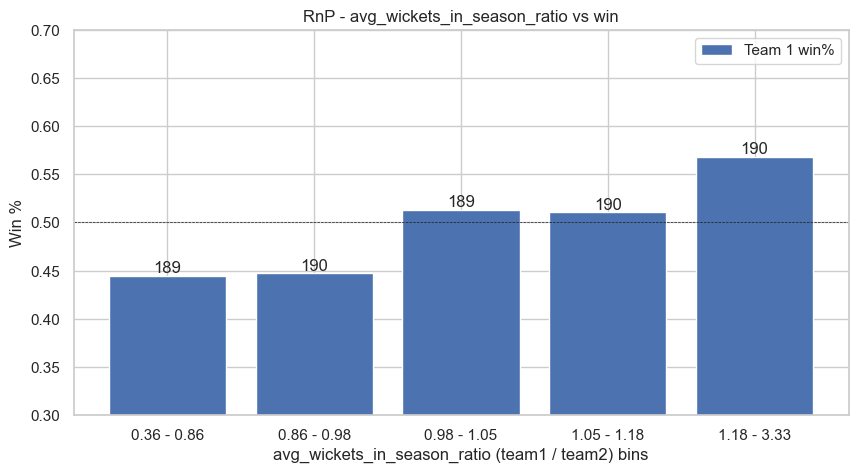

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


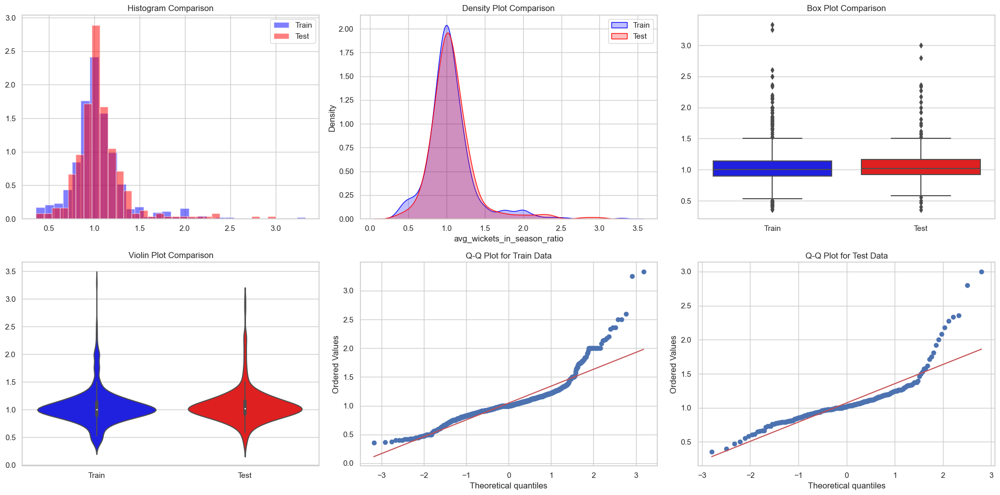

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0708, p-value = 0.2286

Number of outliers in Train:  90

Number of outliers in Test:  21

Skewness of Train:  1.9611989293615824 
Kurtosis of Train:  8.303703617695808

Skewness of Test:  2.4996552839955295 
Kurtosis of Test:  10.60479679845929

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.047900    1.072704
std       0.318513    0.316615
min       0.357143    0.357143
25%       0.897862    0.923465
50%       1.000000    1.018519
75%       1.143091    1.159770
max       3.333333    3.000000
======================================= Model Performance =======================================

Correlation between avg_wickets_in_season_ratio and winner_01 is: -0.06795116762989248

Feature importance wrt team_count_50runs_last15 : 0.5852920449097774


In [97]:
analyse_feature(train_data, 'avg_wickets_in_season_ratio')

## Feature 35

In [98]:
def avg_boundaries_in_series(matches, batsman_data, team_roster_ids, series_name, date):
    series_match_ids = matches[(matches['series_name'] == series_name) & (matches['match_dt'] < date)]['match id'].unique()
    team_ids = str(team_roster_ids).split(':')
    total_boundaries = 0
    total_innings = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            series_matches = batsman_data[(batsman_data['match id'].isin(series_match_ids)) & (batsman_data['batsman_id'] == player_id)]
            total_boundaries += (series_matches['Fours'].sum() + series_matches['Sixes'].sum())
            total_innings += series_matches.shape[0]
        except ValueError:
            continue

    avg_boundaries = total_boundaries / total_innings if total_innings > 0 else 0
    return avg_boundaries

# Apply to training data
train_data['team1_avg_boundaries_in_series'] = train_data.apply(
    lambda x: avg_boundaries_in_series(match_lvl_data, batsman_lvl_data, x['team1_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
train_data['team2_avg_boundaries_in_series'] = train_data.apply(
    lambda x: avg_boundaries_in_series(match_lvl_data, batsman_lvl_data, x['team2_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
train_data = add_ratio_column(train_data, 'team1_avg_boundaries_in_series', 'team2_avg_boundaries_in_series', 'avg_boundaries_in_series_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_boundaries_in_series', 'team2_avg_boundaries_in_series'])

# Apply to test data
test_data['team1_avg_boundaries_in_series'] = test_data.apply(
    lambda x: avg_boundaries_in_series(match_lvl_data, batsman_lvl_data, x['team1_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
test_data['team2_avg_boundaries_in_series'] = test_data.apply(
    lambda x: avg_boundaries_in_series(match_lvl_data, batsman_lvl_data, x['team2_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
test_data = add_ratio_column(test_data, 'team1_avg_boundaries_in_series', 'team2_avg_boundaries_in_series', 'avg_boundaries_in_series_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_boundaries_in_series', 'team2_avg_boundaries_in_series'])


slope: 0.55 / 0.44 =  1.25


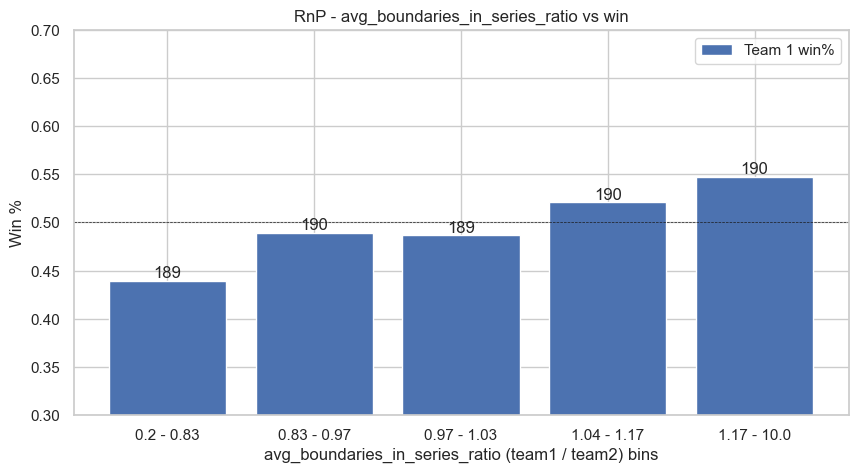

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


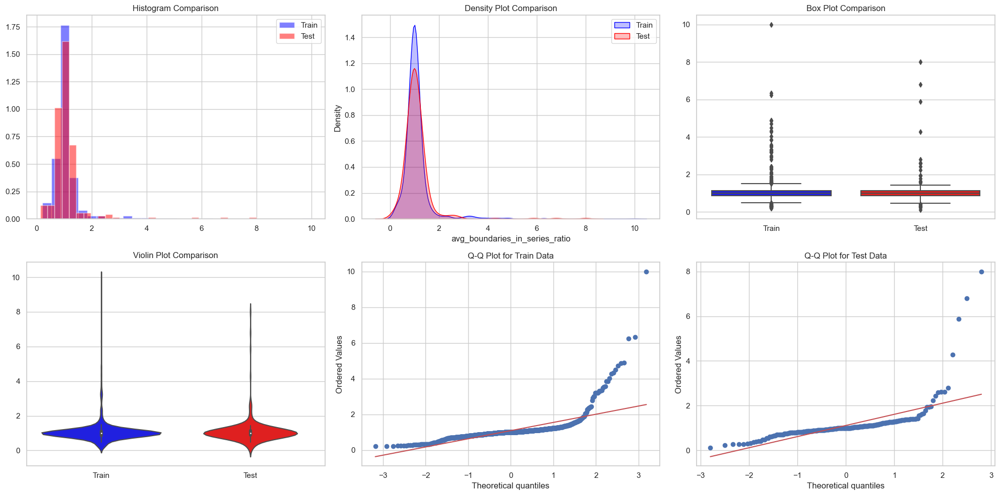

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0606, p-value = 0.4020

Number of outliers in Train:  111

Number of outliers in Test:  29

Skewness of Train:  5.980189644485862 
Kurtosis of Train:  56.38150743430656

Skewness of Test:  6.132567229166419 
Kurtosis of Test:  47.14948691165284

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.087275    1.111302
std       0.638448    0.739006
min       0.200000    0.125000
25%       0.868712    0.874091
50%       1.000000    1.000000
75%       1.125505    1.147988
max      10.000000    8.000000
======================================= Model Performance =======================================

Correlation between avg_boundaries_in_series_ratio and winner_01 is: -0.06459822458716728

Feature importance wrt team_count_50runs_last15 : 0.5897467849848705


In [99]:
analyse_feature(train_data, 'avg_boundaries_in_series_ratio')

## Feature 36

In [100]:
def avg_wickets_in_series(matches, bowler_data, team_roster_ids, series_name, date):
    # Identify match IDs in the series before the given date
    series_match_ids = matches[(matches['series_name'] == series_name) & (matches['match_dt'] < date)]['match id'].unique()
    team_ids = str(team_roster_ids).split(':')
    total_wickets = 0
    total_matches = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            # Filter bowler data for the series matches
            series_matches = bowler_data[(bowler_data['match id'].isin(series_match_ids)) & (bowler_data['bowler_id'] == player_id)]
            total_wickets += series_matches['wicket_count'].sum()
            total_matches += series_matches.shape[0]
        except ValueError:
            continue

    avg_wickets = total_wickets / total_matches if total_matches > 0 else 0
    return avg_wickets

# Apply to training data
train_data['team1_avg_wickets_in_series'] = train_data.apply(
    lambda x: avg_wickets_in_series(match_lvl_data, bowler_lvl_data, x['team1_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
train_data['team2_avg_wickets_in_series'] = train_data.apply(
    lambda x: avg_wickets_in_series(match_lvl_data, bowler_lvl_data, x['team2_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
train_data = add_ratio_column(train_data, 'team1_avg_wickets_in_series', 'team2_avg_wickets_in_series', 'avg_wickets_in_series_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_wickets_in_series', 'team2_avg_wickets_in_series'])

# Apply to test data
test_data['team1_avg_wickets_in_series'] = test_data.apply(
    lambda x: avg_wickets_in_series(match_lvl_data, bowler_lvl_data, x['team1_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
test_data['team2_avg_wickets_in_series'] = test_data.apply(
    lambda x: avg_wickets_in_series(match_lvl_data, bowler_lvl_data, x['team2_roster_ids'], x['series_name'], x['match_dt']), axis=1
)
test_data = add_ratio_column(test_data, 'team1_avg_wickets_in_series', 'team2_avg_wickets_in_series', 'avg_wickets_in_series_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_wickets_in_series', 'team2_avg_wickets_in_series'])

slope: 0.56 / 0.37 =  1.52


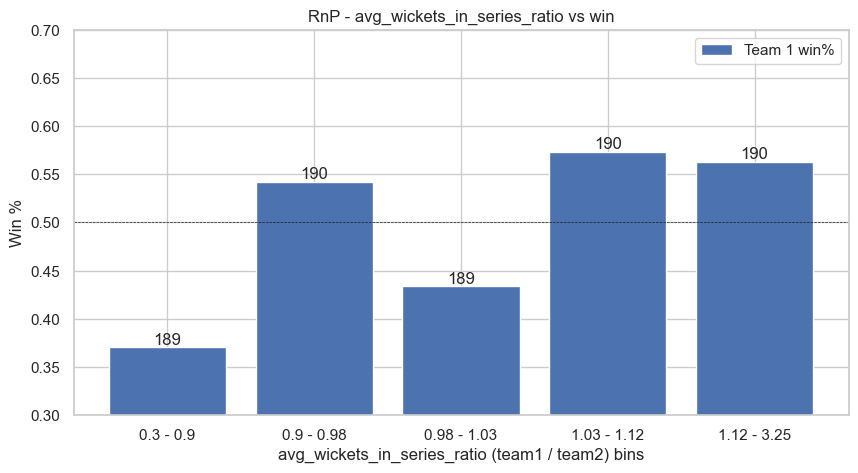

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


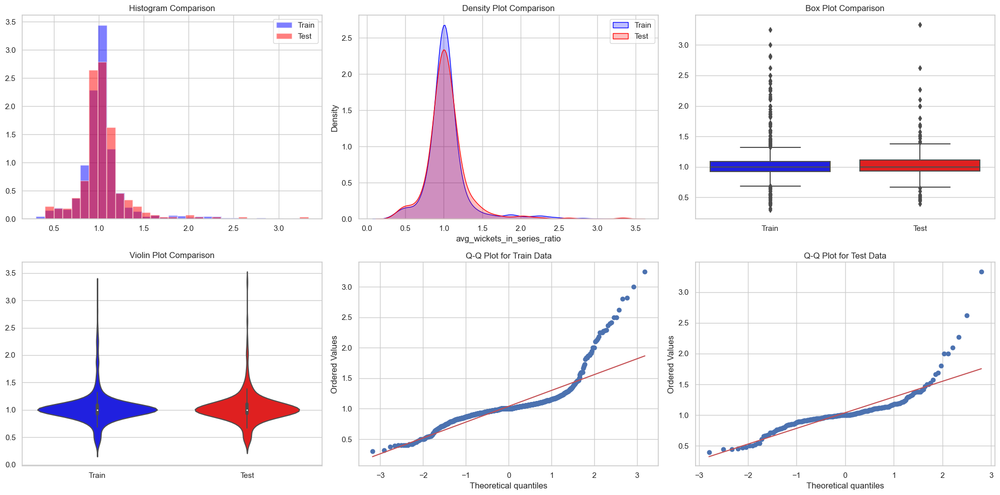

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0573, p-value = 0.4705

Number of outliers in Train:  120

Number of outliers in Test:  29

Skewness of Train:  2.638124133465723 
Kurtosis of Train:  12.361832202969774

Skewness of Test:  2.9621804780506844 
Kurtosis of Test:  18.04940018723101

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.040001    1.040188
std       0.301352    0.293993
min       0.300000    0.400000
25%       0.927003    0.931139
50%       1.000000    1.000000
75%       1.087260    1.111321
max       3.250000    3.333333
======================================= Model Performance =======================================

Correlation between avg_wickets_in_series_ratio and winner_01 is: -0.09837810910554219

Feature importance wrt team_count_50runs_last15 : 0.6011759569725527


In [101]:
analyse_feature(train_data, 'avg_wickets_in_series_ratio')

## Feature 37

In [102]:
def recent_win_percentage_batting_first(matches, team_id, date, recent_matches=10):
    # Filter matches where the team batted first and occurred before the given date
    batting_first_matches = matches[((matches['team1_id'] == team_id) & (matches['toss decision'] == 'bat')) |
                                    ((matches['team2_id'] == team_id) & (matches['toss decision'] == 'bat')) &
                                    (matches['match_dt'] < date)].sort_values(by='match_dt', ascending=False).head(recent_matches)
    wins = batting_first_matches[batting_first_matches['winner_id'] == team_id].shape[0]
    total_matches = batting_first_matches.shape[0]
    return (wins / total_matches) * 100 if total_matches > 0 else 0

# Apply to training data
train_data['team1_recent_win_percentage_batting_first'] = train_data.apply(
    lambda x: recent_win_percentage_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1
)
train_data['team2_recent_win_percentage_batting_first'] = train_data.apply(
    lambda x: recent_win_percentage_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1
)
train_data = add_ratio_column(train_data, 'team1_recent_win_percentage_batting_first', 'team2_recent_win_percentage_batting_first', 'recent_win_percentage_batting_first_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_recent_win_percentage_batting_first', 'team2_recent_win_percentage_batting_first'])

# Apply to test data
test_data['team1_recent_win_percentage_batting_first'] = test_data.apply(
    lambda x: recent_win_percentage_batting_first(match_lvl_data, x['team1_id'], x['match_dt']), axis=1
)
test_data['team2_recent_win_percentage_batting_first'] = test_data.apply(
    lambda x: recent_win_percentage_batting_first(match_lvl_data, x['team2_id'], x['match_dt']), axis=1
)
test_data = add_ratio_column(test_data, 'team1_recent_win_percentage_batting_first', 'team2_recent_win_percentage_batting_first', 'recent_win_percentage_batting_first_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_recent_win_percentage_batting_first', 'team2_recent_win_percentage_batting_first'])


slope: 0.64 / 0.36 =  1.76


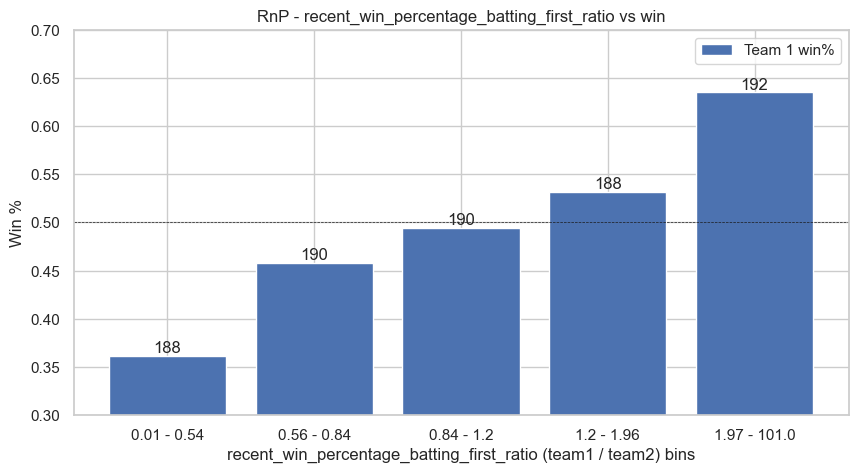

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


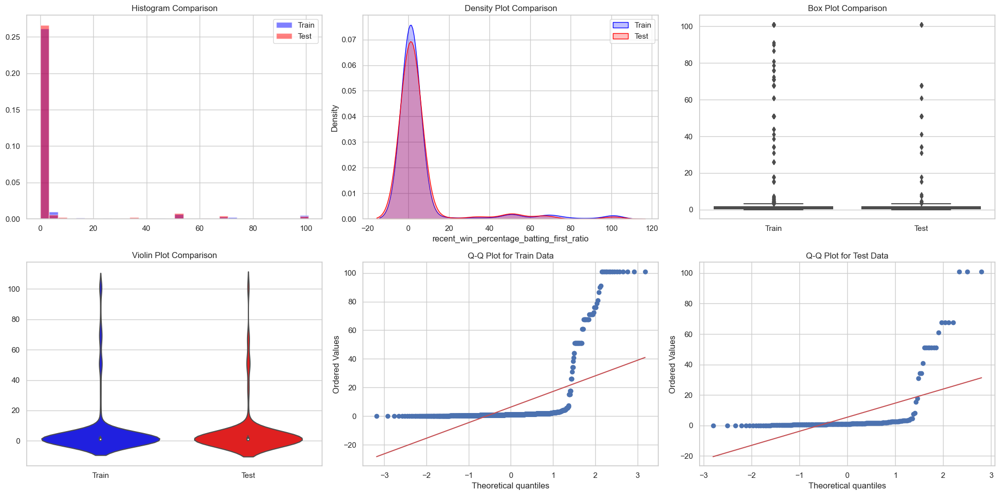

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0441, p-value = 0.7862

Number of outliers in Train:  115

Number of outliers in Test:  28

Skewness of Train:  3.7404859274499027 
Kurtosis of Train:  13.388073914672844

Skewness of Test:  4.113713431453715 
Kurtosis of Test:  17.439703837378822

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      6.328834    5.424719
std      18.618384   15.992618
min       0.009901    0.009901
25%       0.607843    0.605911
50%       1.000000    1.000000
75%       1.655738    1.712594
max     101.000000  101.000000
======================================= Model Performance =======================================

Correlation between recent_win_percentage_batting_first_ratio and winner_01 is: -0.10209484902479879

Feature importance wrt team_count_50runs_last15 : 0.5306362733723415


In [103]:
analyse_feature(train_data, 'recent_win_percentage_batting_first_ratio')

## Feature 38

In [104]:
def recent_match_experience_score(matches, team_roster_ids, date, recent_matches=10):
    team_ids = str(team_roster_ids).split(':')
    total_experience_score = 0

    for player_id in team_ids:
        player_matches = matches[(matches['match_dt'] < date) & ((matches['team1_roster_ids'].str.contains(player_id)) | (matches['team2_roster_ids'].str.contains(player_id)))]
        recent_player_matches = player_matches.sort_values(by='match_dt', ascending=False).head(recent_matches)
        total_experience_score += recent_player_matches.shape[0]

    return total_experience_score

# Apply to training data
train_data['team1_recent_match_experience_score'] = train_data.apply(
    lambda x: recent_match_experience_score(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1
)
train_data['team2_recent_match_experience_score'] = train_data.apply(
    lambda x: recent_match_experience_score(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1
)
train_data = add_ratio_column(train_data, 'team1_recent_match_experience_score', 'team2_recent_match_experience_score', 'recent_match_experience_score_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_recent_match_experience_score', 'team2_recent_match_experience_score'])

# Apply to test data
test_data['team1_recent_match_experience_score'] = test_data.apply(
    lambda x: recent_match_experience_score(match_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1
)
test_data['team2_recent_match_experience_score'] = test_data.apply(
    lambda x: recent_match_experience_score(match_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1
)
test_data = add_ratio_column(test_data, 'team1_recent_match_experience_score', 'team2_recent_match_experience_score', 'recent_match_experience_score_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_recent_match_experience_score', 'team2_recent_match_experience_score'])

slope: 0.6 / 0.36 =  1.67


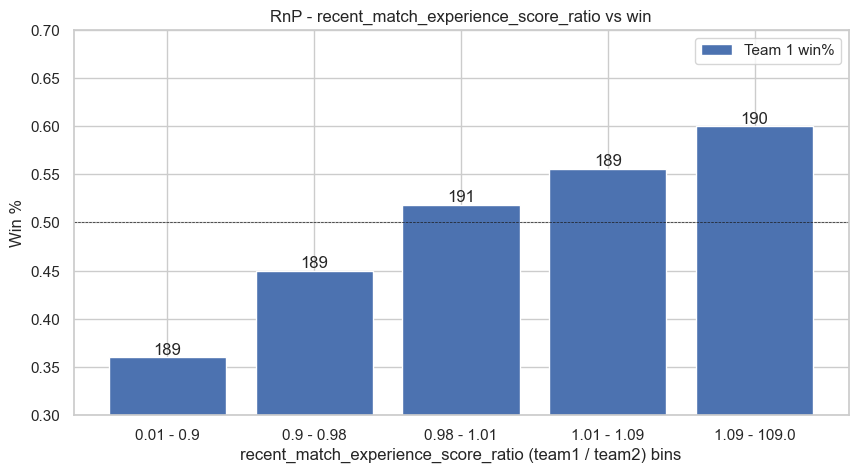

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


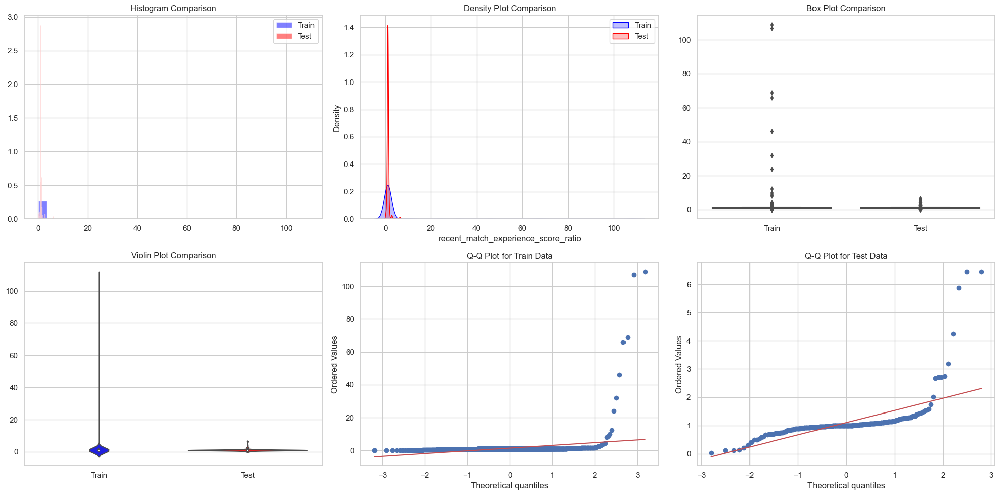

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0539, p-value = 0.5515

Number of outliers in Train:  141

Number of outliers in Test:  41

Skewness of Train:  14.436617609697688 
Kurtosis of Train:  225.12112150508514

Skewness of Test:  5.813751914516955 
Kurtosis of Test:  40.732180877444826

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.515662    1.097985
std       6.116006    0.669294
min       0.009009    0.035714
25%       0.926606    0.937500
50%       1.000000    1.000000
75%       1.063004    1.088672
max     109.000000    6.454545
======================================= Model Performance =======================================

Correlation between recent_match_experience_score_ratio and winner_01 is: -0.05749449616412827

Feature importance wrt team_count_50runs_last15 : 0.5640499473872065


In [105]:
analyse_feature(train_data, 'recent_match_experience_score_ratio')

## Feature 39

In [106]:
def identify_most_recent_captain(batsman_data, bowler_data, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    captain_id = None
    recent_match_date = None

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            # Check if the player is a batsman captain
            player_data_bat = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['is_batsman_captain'] == 1) & (batsman_data['match_dt'] < date)]
            # Check if the player is a bowler captain
            player_data_bowl = bowler_data[(bowler_data['bowler_id'] == player_id) & (bowler_data['is_bowler_captain'] == 1) & (bowler_data['match_dt'] < date)]

            if not player_data_bat.empty:
                latest_bat_match_date = player_data_bat['match_dt'].max()
                if recent_match_date is None or latest_bat_match_date > recent_match_date:
                    captain_id = player_id
                    recent_match_date = latest_bat_match_date
            
            if not player_data_bowl.empty:
                latest_bowl_match_date = player_data_bowl['match_dt'].max()
                if recent_match_date is None or latest_bowl_match_date > recent_match_date:
                    captain_id = player_id
                    recent_match_date = latest_bowl_match_date

        except ValueError:
            continue

    return captain_id


# def assign_captain_team_id(row, captain_id):
#     if str(captain_id) in row['team1_roster_ids']:
#         return row['team1_id']
#     elif str(captain_id) in row['team2_roster_ids']:
#         return row['team2_id']
#     return None
def assign_captain_team_id(row, captain_id):
    if str(captain_id) in str(row['team1_roster_ids']):
        return row['team1_id']
    elif str(captain_id) in str(row['team2_roster_ids']):
        return row['team2_id']
    else:
        return None


def win_percentage_captain_recent(matches, captain_id, date, recent_matches=25):
    if captain_id is None:
        return 0

    # Filter matches involving the captain
    captain_matches = matches[(matches['match_dt'] < date) & ((matches['team1_roster_ids'].str.contains(str(captain_id))) | (matches['team2_roster_ids'].str.contains(str(captain_id))))]
    captain_matches = captain_matches.sort_values(by='match_dt', ascending=False).head(recent_matches)

    # Assign captain team ID
    captain_matches['captain_team_id'] = captain_matches.apply(lambda x: assign_captain_team_id(x, captain_id), axis=1)
    
    # Calculate wins
    captain_wins = captain_matches[captain_matches['winner_id'] == captain_matches['captain_team_id']].shape[0]
    total_matches = captain_matches.shape[0]
    
    return (captain_wins / total_matches) * 100 if total_matches > 0 else 0


# Apply to training data
train_data['team1_captain_id'] = train_data.apply(lambda x: identify_most_recent_captain(batsman_lvl_data, bowler_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_captain_id'] = train_data.apply(lambda x: identify_most_recent_captain(batsman_lvl_data, bowler_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

train_data['team1_captain_win_percentage_recent'] = train_data.apply(lambda x: win_percentage_captain_recent(match_lvl_data, x['team1_captain_id'], x['match_dt'], recent_matches=10), axis=1)
train_data['team2_captain_win_percentage_recent'] = train_data.apply(lambda x: win_percentage_captain_recent(match_lvl_data, x['team2_captain_id'], x['match_dt'], recent_matches=10), axis=1)

train_data = add_ratio_column(train_data, 'team1_captain_win_percentage_recent', 'team2_captain_win_percentage_recent', 'captain_win_percentage_recent_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_captain_id', 'team2_captain_id', 'team1_captain_win_percentage_recent', 'team2_captain_win_percentage_recent'])

# Apply to test data
test_data['team1_captain_id'] = test_data.apply(lambda x: identify_most_recent_captain(batsman_lvl_data, bowler_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_captain_id'] = test_data.apply(lambda x: identify_most_recent_captain(batsman_lvl_data, bowler_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

test_data['team1_captain_win_percentage_recent'] = test_data.apply(lambda x: win_percentage_captain_recent(match_lvl_data, x['team1_captain_id'], x['match_dt'], recent_matches=10), axis=1)
test_data['team2_captain_win_percentage_recent'] = test_data.apply(lambda x: win_percentage_captain_recent(match_lvl_data, x['team2_captain_id'], x['match_dt'], recent_matches=10), axis=1)

test_data = add_ratio_column(test_data, 'team1_captain_win_percentage_recent', 'team2_captain_win_percentage_recent', 'captain_win_percentage_recent_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_captain_id', 'team2_captain_id', 'team1_captain_win_percentage_recent', 'team2_captain_win_percentage_recent'])

slope: 0.57 / 0.4 =  1.42


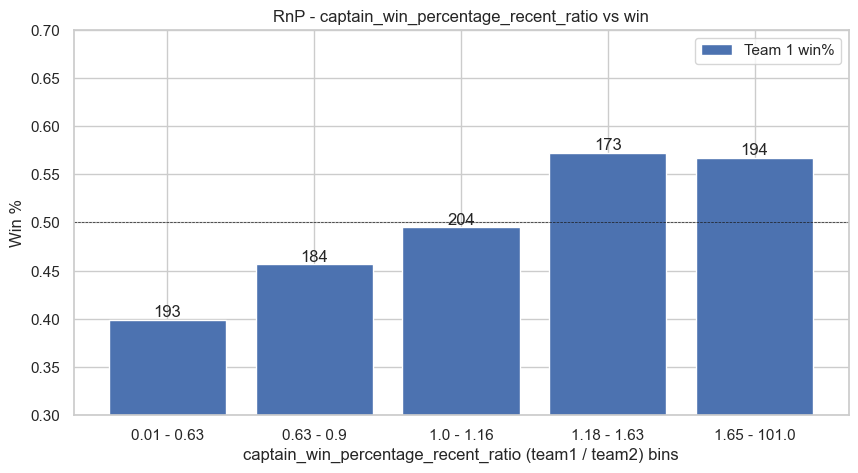

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


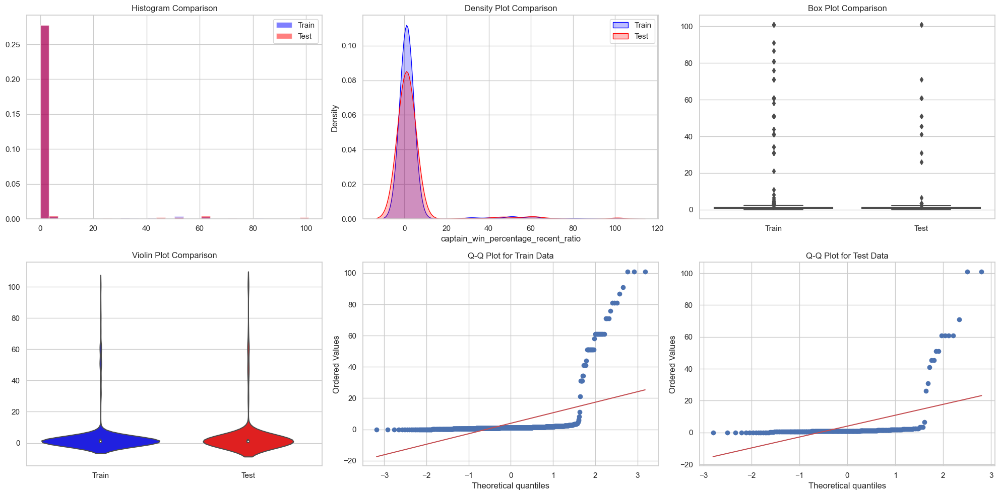

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0471, p-value = 0.7153

Number of outliers in Train:  88

Number of outliers in Test:  23

Skewness of Train:  4.884324906375441 
Kurtosis of Train:  24.50258063990568

Skewness of Test:  5.014621387646906 
Kurtosis of Test:  26.539530908925876

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      3.926621    3.975159
std      13.044996   13.483041
min       0.009901    0.012346
25%       0.718310    0.752781
50%       1.000000    1.000000
75%       1.392157    1.322581
max     101.000000  101.000000
======================================= Model Performance =======================================

Correlation between captain_win_percentage_recent_ratio and winner_01 is: -0.050097936000767535

Feature importance wrt team_count_50runs_last15 : 0.4509226357918245


In [107]:
analyse_feature(train_data, 'captain_win_percentage_recent_ratio')

## Feature 40

In [108]:
def avg_margin_victory_series(matches, team_id, series_name, date):
    series_matches = matches[(matches['match_dt'] < date) & (matches['series_name'] == series_name) & (matches['winner_id'] == team_id)]
    total_margin = series_matches['win amount'].sum()
    total_wins = series_matches.shape[0]
    return total_margin / total_wins if total_wins > 0 else 0

# Apply to training data
train_data['team1_avg_margin_victory_series'] = train_data.apply(lambda x: avg_margin_victory_series(match_lvl_data, x['team1_id'], x['series_name'], x['match_dt']), axis=1)
train_data['team2_avg_margin_victory_series'] = train_data.apply(lambda x: avg_margin_victory_series(match_lvl_data, x['team2_id'], x['series_name'], x['match_dt']), axis=1)

train_data = add_ratio_column(train_data, 'team1_avg_margin_victory_series', 'team2_avg_margin_victory_series', 'avg_margin_victory_series_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_avg_margin_victory_series', 'team2_avg_margin_victory_series'])

# Apply to test data
test_data['team1_avg_margin_victory_series'] = test_data.apply(lambda x: avg_margin_victory_series(match_lvl_data, x['team1_id'], x['series_name'], x['match_dt']), axis=1)
test_data['team2_avg_margin_victory_series'] = test_data.apply(lambda x: avg_margin_victory_series(match_lvl_data, x['team2_id'], x['series_name'], x['match_dt']), axis=1)

test_data = add_ratio_column(test_data, 'team1_avg_margin_victory_series', 'team2_avg_margin_victory_series', 'avg_margin_victory_series_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_avg_margin_victory_series', 'team2_avg_margin_victory_series'])

slope: 0.56 / 0.43 =  1.29


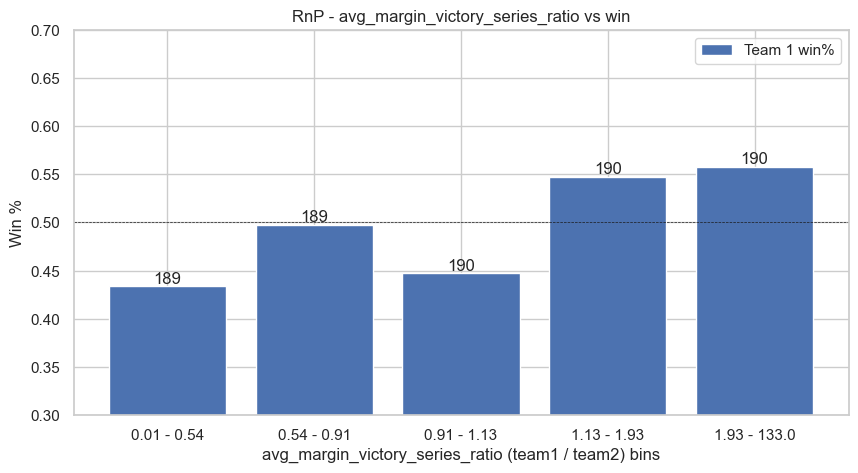

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


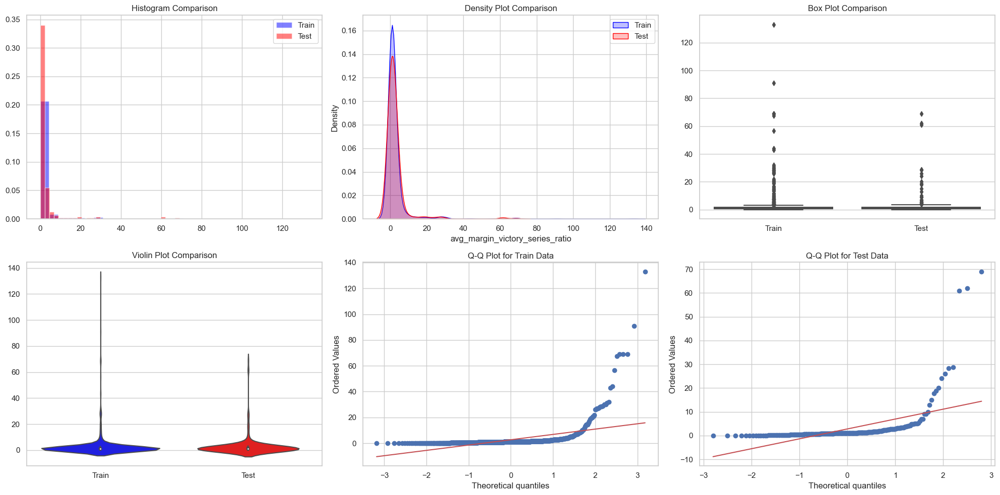

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0563, p-value = 0.4935

Number of outliers in Train:  116

Number of outliers in Test:  31

Skewness of Train:  8.782196857086126 
Kurtosis of Train:  100.45543353797993

Skewness of Test:  6.462815535986613 
Kurtosis of Test:  47.09707145197744

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      2.676383    2.777307
std       8.224669    7.620686
min       0.007519    0.007519
25%       0.636920    0.647707
50%       1.000000    1.000000
75%       1.618937    1.839744
max     133.000000   69.000000
======================================= Model Performance =======================================

Correlation between avg_margin_victory_series_ratio and winner_01 is: 0.0038215004682267068

Feature importance wrt team_count_50runs_last15 : 0.5853063554708267


In [109]:
analyse_feature(train_data, 'avg_margin_victory_series_ratio')

## Feature 41

In [110]:
def calculate_run_scored(batsman_data, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    total_centuries = 0
    total_half_centuries = 0
    total_thirties = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date)]
            total_centuries += (player_data['runs'] >= 100).sum()
            total_half_centuries += ((player_data['runs'] >= 50) & (player_data['runs'] < 100)).sum()
            total_thirties += ((player_data['runs'] >= 30) & (player_data['runs'] < 50)).sum()
        except ValueError:
            continue

    return 0.20 * total_centuries + 0.40 * total_half_centuries + 0.40 * total_thirties

# Apply to training data
train_data['team1_run_scored'] = train_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_run_scored'] = train_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

train_data = add_ratio_column(train_data, 'team1_run_scored', 'team2_run_scored', 'run_scored_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_run_scored', 'team2_run_scored'])

# Apply to test data
test_data['team1_run_scored'] = test_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_run_scored'] = test_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

test_data = add_ratio_column(test_data, 'team1_run_scored', 'team2_run_scored', 'run_scored_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_run_scored', 'team2_run_scored'])

slope: 0.62 / 0.36 =  1.73


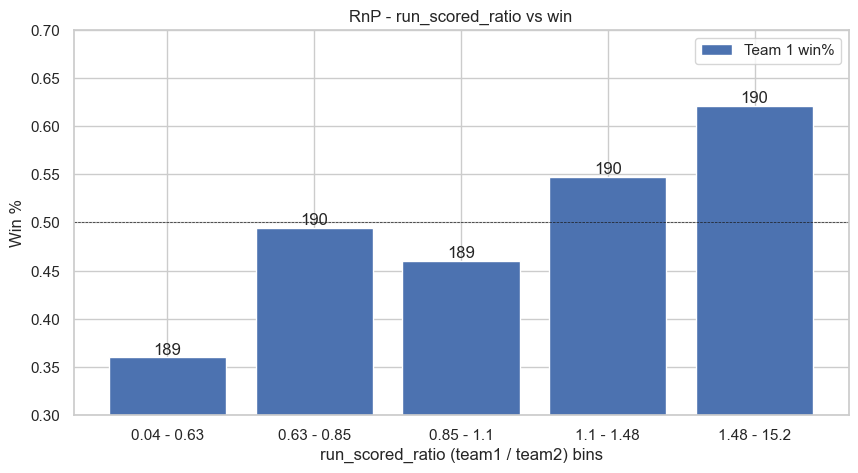

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


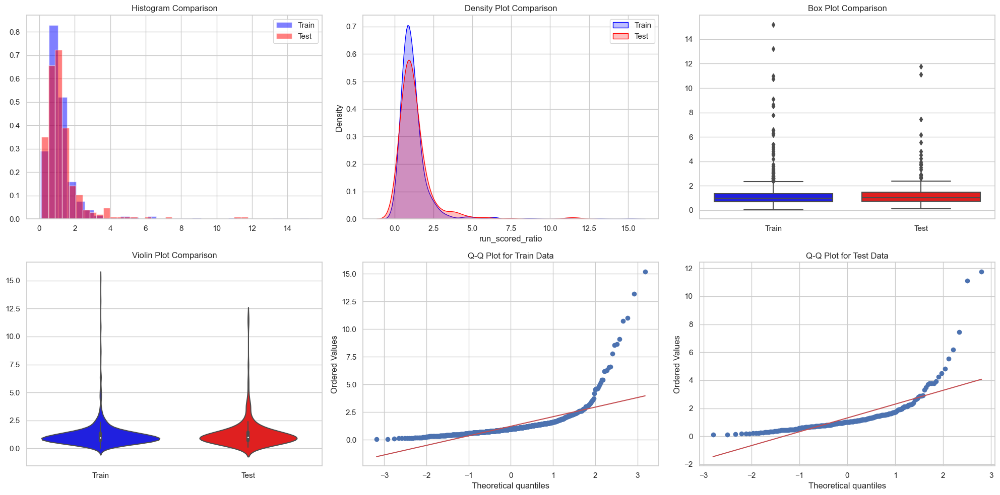

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0561, p-value = 0.4992

Number of outliers in Train:  60

Number of outliers in Test:  22

Skewness of Train:  5.754062468015372 
Kurtosis of Train:  47.05725379841779

Skewness of Test:  4.641514532166593 
Kurtosis of Test:  29.704542403244535

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.216414    1.310298
std       1.187459    1.292869
min       0.043478    0.111111
25%       0.687348    0.712086
50%       0.968159    1.007299
75%       1.355952    1.458839
max      15.200000   11.764706
======================================= Model Performance =======================================

Correlation between run_scored_ratio and winner_01 is: -0.13155335931609663

Feature importance wrt team_count_50runs_last15 : 0.6205820940144214


In [111]:
analyse_feature(train_data, 'run_scored_ratio')

## Feature 42

In [112]:
def calculate_partnerships(batsman_data, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    partnerships = []
    
    # Assuming 'over_faced_first' column exists to determine when each batsman started
    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date)]
            partnerships.extend(player_data['runs'])
        except ValueError:
            continue
    
    # Calculate the number of 100+, 50+, and 30+ partnerships
    total_100_partnerships = sum(1 for runs in partnerships if runs >= 100)
    total_50_partnerships = sum(1 for runs in partnerships if 50 <= runs < 100)
    total_30_partnerships = sum(1 for runs in partnerships if 30 <= runs < 50)
    
    return total_100_partnerships, total_50_partnerships, total_30_partnerships

# Use the calculate_partnerships function to derive partnerships and calculate w(partnership)
def calculate_w_partnership(batsman_data, team_roster_ids, date):
    total_100_partnerships, total_50_partnerships, total_30_partnerships = calculate_partnerships(batsman_data, team_roster_ids, date)
    w_partnership = 0.40 * total_100_partnerships + 0.40 * total_50_partnerships + 0.20 * total_30_partnerships
    return w_partnership

# Apply to training data
train_data['team1_w_partnership'] = train_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
train_data['team2_w_partnership'] = train_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

train_data = add_ratio_column(train_data, 'team1_w_partnership', 'team2_w_partnership', 'w_partnership_ratio')

# Drop intermediate columns to avoid redundancy
train_data = train_data.drop(columns=['team1_w_partnership', 'team2_w_partnership'])

# Apply to test data
test_data['team1_w_partnership'] = test_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
test_data['team2_w_partnership'] = test_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)

test_data = add_ratio_column(test_data, 'team1_w_partnership', 'team2_w_partnership', 'w_partnership_ratio')

# Drop intermediate columns to avoid redundancy
test_data = test_data.drop(columns=['team1_w_partnership', 'team2_w_partnership'])

slope: 0.61 / 0.38 =  1.6


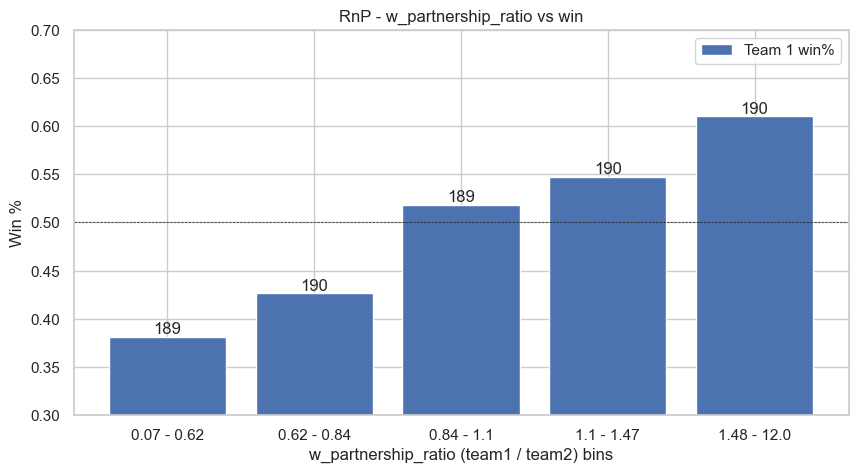

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


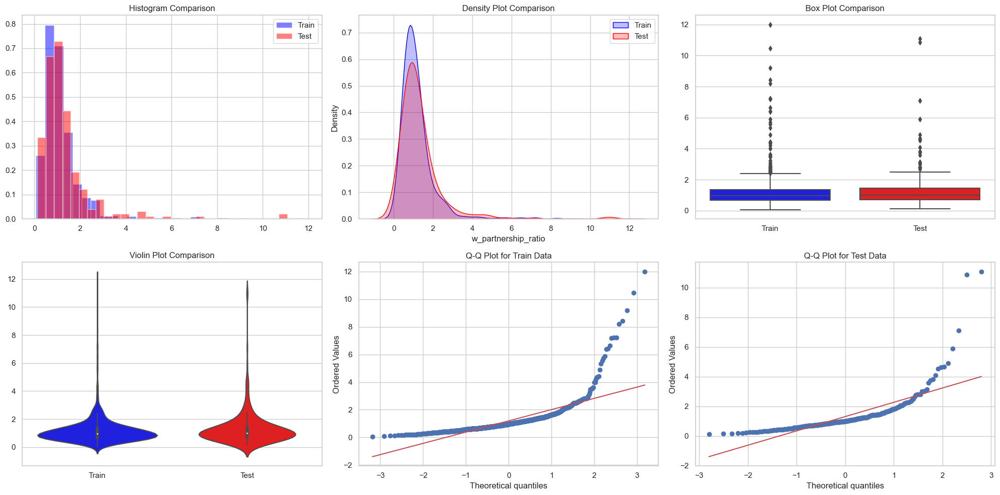

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0762, p-value = 0.1635

Number of outliers in Train:  64

Number of outliers in Test:  21

Skewness of Train:  4.663043422130963 
Kurtosis of Train:  31.473341399928835

Skewness of Test:  4.504758058606563 
Kurtosis of Test:  28.447179751454932

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.194495    1.311550
std       1.048679    1.241440
min       0.065789    0.125000
25%       0.666667    0.715476
50%       0.964263    1.000000
75%       1.363943    1.444556
max      12.000000   11.071429
======================================= Model Performance =======================================

Correlation between w_partnership_ratio and winner_01 is: -0.13405679449716343

Feature importance wrt team_count_50runs_last15 : 0.6249833281059288


In [113]:
analyse_feature(train_data, 'w_partnership_ratio')

## Feature 43

In [114]:
def team_batting_average(batsman_data, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0
    total_outs = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date)]
            total_runs += player_data['runs'].sum()
            total_outs += player_data['wicket kind'].notnull().sum()  # Assuming 'wicket kind' has non-null values when the player is out
        except ValueError:
            continue

    return total_runs / total_outs if total_outs > 0 else 0

def team_batting_strike_rate(batsman_data, team_roster_ids, date):
    team_ids = str(team_roster_ids).split(':')
    total_runs = 0
    total_balls = 0

    for player_id in team_ids:
        try:
            player_id = float(player_id)
            player_data = batsman_data[(batsman_data['batsman_id'] == player_id) & (batsman_data['match_dt'] < date)]
            total_runs += player_data['runs'].sum()
            total_balls += player_data['balls_faced'].sum()
        except ValueError:
            continue

    return (total_runs / total_balls) * 100 if total_balls > 0 else 0


def calculate_batting_strength_components(batsman_data, team_roster_ids, date):
    bat_avg = team_batting_average(batsman_data, team_roster_ids, date)
    bat_sr = team_batting_strike_rate(batsman_data, team_roster_ids, date)
    u = 0.40 * bat_avg + 0.60 * bat_sr
    
    v = calculate_run_scored(batsman_data, team_roster_ids, date)
    w = calculate_w_partnership(batsman_data, team_roster_ids, date)
    # hirs = calculate_hirs()  # Assuming a placeholder or predefined function for HIRS

    return u, v, w
def calculate_batting_strength(u, v, w):
    return 0.20 * u + 0.30 * v + 0.40 * w 

def apply_batting_strength(train_data, batsman_data):
    train_data['team1_batting_avg'] = train_data.apply(lambda x: team_batting_average(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    train_data['team2_batting_avg'] = train_data.apply(lambda x: team_batting_average(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    train_data = add_ratio_column(train_data, 'team1_batting_avg', 'team2_batting_avg', 'batting_avg_ratio')

    train_data['team1_batting_sr'] = train_data.apply(lambda x: team_batting_strike_rate(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    train_data['team2_batting_sr'] = train_data.apply(lambda x: team_batting_strike_rate(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    train_data = add_ratio_column(train_data, 'team1_batting_sr', 'team2_batting_sr', 'batting_sr_ratio')

    train_data['team1_w_partnership'] = train_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    train_data['team2_w_partnership'] = train_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    train_data = add_ratio_column(train_data, 'team1_w_partnership', 'team2_w_partnership', 'w_partnership_ratio')

    train_data['team1_run_scored'] = train_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    train_data['team2_run_scored'] = train_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    train_data = add_ratio_column(train_data, 'team1_run_scored', 'team2_run_scored', 'run_scored_ratio')

    # train_data['team1_hirs'] = train_data.apply(lambda x: calculate_hirs(), axis=1)  # Assuming a constant value
    # train_data['team2_hirs'] = train_data.apply(lambda x: calculate_hirs(), axis=1)  # Assuming a constant value

    train_data['team1_batting_strength'] = train_data.apply(lambda x: calculate_batting_strength(
        x['team1_batting_avg'], x['team1_run_scored'], x['team1_w_partnership']), axis=1)
    train_data['team2_batting_strength'] = train_data.apply(lambda x: calculate_batting_strength(
        x['team2_batting_avg'], x['team2_run_scored'], x['team2_w_partnership']), axis=1)

    train_data = add_ratio_column(train_data, 'team1_batting_strength', 'team2_batting_strength', 'batting_strength_ratio')

    # Drop intermediate columns to avoid redundancy
    train_data = train_data.drop(columns=['team1_batting_avg', 'team2_batting_avg', 'team1_batting_sr', 'team2_batting_sr',
                                          'team1_w_partnership', 'team2_w_partnership', 'team1_run_scored', 'team2_run_scored',
                                          'team1_batting_strength', 'team2_batting_strength'])

    return train_data

def apply_batting_strength_test(test_data, batsman_data):
    test_data['team1_batting_avg'] = test_data.apply(lambda x: team_batting_average(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    test_data['team2_batting_avg'] = test_data.apply(lambda x: team_batting_average(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    test_data = add_ratio_column(test_data, 'team1_batting_avg', 'team2_batting_avg', 'batting_avg_ratio')

    test_data['team1_batting_sr'] = test_data.apply(lambda x: team_batting_strike_rate(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    test_data['team2_batting_sr'] = test_data.apply(lambda x: team_batting_strike_rate(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    test_data = add_ratio_column(test_data, 'team1_batting_sr', 'team2_batting_sr', 'batting_sr_ratio')

    test_data['team1_w_partnership'] = test_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    test_data['team2_w_partnership'] = test_data.apply(lambda x: calculate_w_partnership(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    test_data = add_ratio_column(test_data, 'team1_w_partnership', 'team2_w_partnership', 'w_partnership_ratio')

    test_data['team1_run_scored'] = test_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team1_roster_ids'], x['match_dt']), axis=1)
    test_data['team2_run_scored'] = test_data.apply(lambda x: calculate_run_scored(batsman_lvl_data, x['team2_roster_ids'], x['match_dt']), axis=1)
    test_data = add_ratio_column(test_data, 'team1_run_scored', 'team2_run_scored', 'run_scored_ratio')

    # test_data['team1_hirs'] = test_data.apply(lambda x: calculate_hirs(), axis=1)  # Assuming a constant value
    # test_data['team2_hirs'] = test_data.apply(lambda x: calculate_hirs(), axis=1)  # Assuming a constant value

    test_data['team1_batting_strength'] = test_data.apply(lambda x: calculate_batting_strength(
        x['team1_batting_avg'], x['team1_run_scored'], x['team1_w_partnership']), axis=1)
    test_data['team2_batting_strength'] = test_data.apply(lambda x: calculate_batting_strength(
        x['team2_batting_avg'], x['team2_run_scored'], x['team2_w_partnership']), axis=1)

    test_data = add_ratio_column(test_data, 'team1_batting_strength', 'team2_batting_strength', 'batting_strength_ratio')

    # Drop intermediate columns to avoid redundancy
    test_data = test_data.drop(columns=['team1_batting_avg', 'team2_batting_avg', 'team1_batting_sr', 'team2_batting_sr',
                                        'team1_w_partnership', 'team2_w_partnership', 'team1_run_scored', 'team2_run_scored',
                                        'team1_batting_strength', 'team2_batting_strength'])

    return test_data

# Apply the functions to both train and test datasets
train_data = apply_batting_strength(train_data, batsman_lvl_data)
test_data = apply_batting_strength_test(test_data, batsman_lvl_data)

slope: 0.56 / 0.4 =  1.4


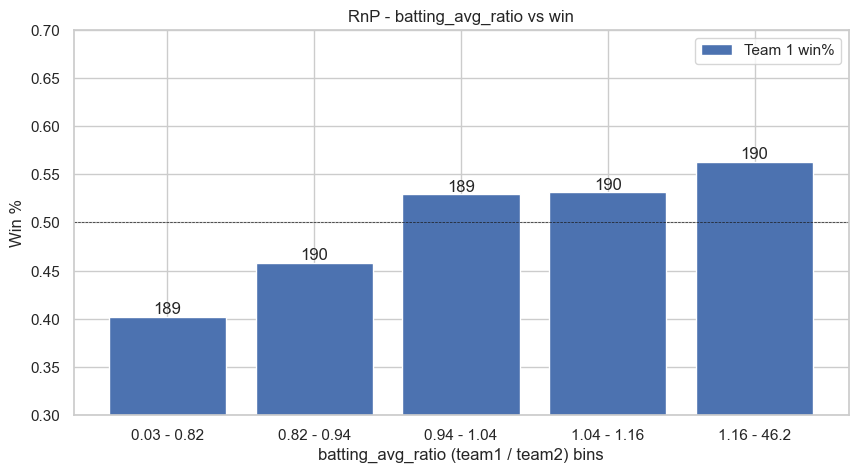

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


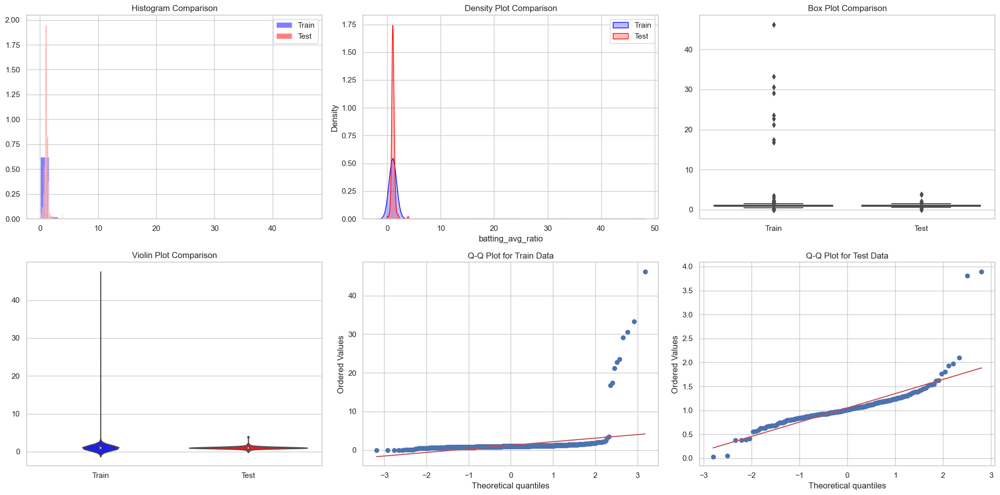

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0718, p-value = 0.2158

Number of outliers in Train:  59

Number of outliers in Test:  15

Skewness of Train:  11.727034754468125 
Kurtosis of Train:  151.3796486371757

Skewness of Test:  3.7797519361425076 
Kurtosis of Test:  29.060598788580922

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.254935    1.050261
std       2.656134    0.352513
min       0.025478    0.032751
25%       0.858652    0.901676
50%       0.994049    1.012271
75%       1.125606    1.169442
max      46.200000    3.895470
======================================= Model Performance =======================================

Correlation between batting_avg_ratio and winner_01 is: -0.051849881497376904

Feature importance wrt team_count_50runs_last15 : 0.6120173465570002


In [115]:
analyse_feature(train_data, 'batting_avg_ratio')

slope: 0.61 / 0.38 =  1.59


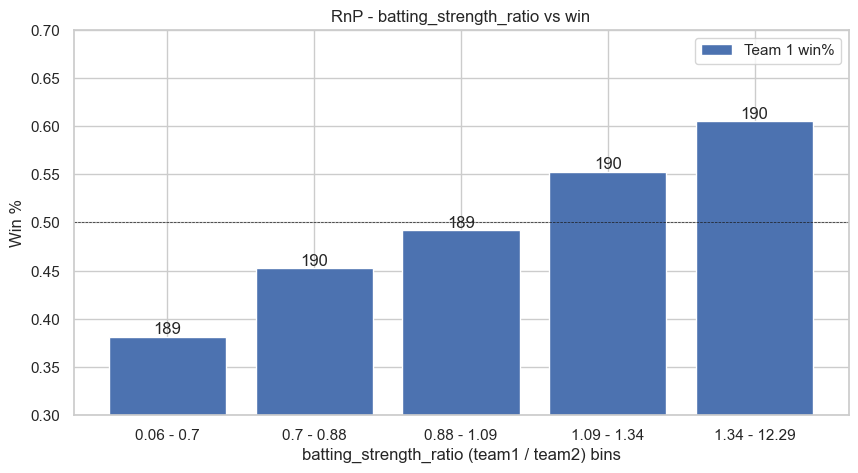

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


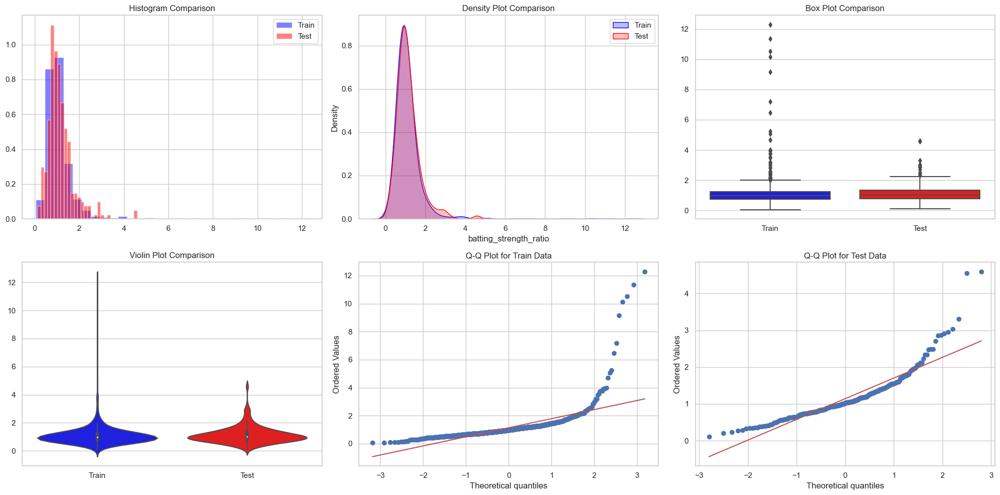

======================================= Train-Test Statistics =======================================

Kolmogorov-Smirnov test result: KS statistic = 0.0747, p-value = 0.1780

Number of outliers in Train:  52

Number of outliers in Test:  14

Skewness of Train:  6.915891996364552 
Kurtosis of Train:  65.33015688469337

Skewness of Test:  2.1331262525784194 
Kurtosis of Test:  7.743461814030803

Descriptive Statistics Comparison:
       Train Stats  Test Stats
count   948.000000  271.000000
mean      1.134075    1.140349
std       0.931227    0.609298
min       0.057383    0.115385
25%       0.734454    0.770929
50%       0.978102    1.021576
75%       1.250213    1.357655
max      12.290909    4.593313
======================================= Model Performance =======================================

Correlation between batting_strength_ratio and winner_01 is: -0.12287495678348119

Feature importance wrt team_count_50runs_last15 : 0.631021757761066


In [116]:
analyse_feature(train_data, 'batting_strength_ratio')

In [117]:
col = train_data.columns[24:].to_list()

In [118]:
for c in col[8:]:
    remove_skew(train_data, c, method='quantile', train=True)
    remove_skew(test_data, c, method='quantile', train=False)

Skewness of team_batsmen_performance_ratio was 16.06551607883884. quantile transformation applied. New skewness is -1.2296467217018523e-05
Skewness of team_batsmen_performance_ratio was 8.74419781034234. quantile transformation applied. New skewness is 0.023449641421686564
Skewness of team_batsman_runs_recent_ratio was 16.80776463961771. quantile transformation applied. New skewness is -2.9900923524778225e-10
Skewness of team_batsman_runs_recent_ratio was 5.461071606993953. quantile transformation applied. New skewness is -0.046708478721442154
Skewness of team_playerOfmatch_ratio was -0.01842034766607293. quantile transformation applied. New skewness is 2.3753625732623725e-06
Skewness of team_playerOfmatch_ratio was 0.22721363096857203. quantile transformation applied. New skewness is 0.38739983110429
Skewness of team_count_100runs_ratio_last15 was 2.8535227456095624. quantile transformation applied. New skewness is -1.3051686051992775
Skewness of team_count_100runs_ratio_last15 was 2.

/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/amex/lib/python3.12/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(
/opt/homebre

## Check

In [119]:
col = train_data.columns[24:].to_list()
col.append('team_count_50runs_last15')
col.append('winner_01')
data = train_data[col]

In [120]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

# Define the features and target variable
X = data.drop('winner_01', axis=1)  # Assuming 'winner_01' is the target variable
y = data['winner_01']

# Handle missing values by imputing with the median
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Convert the imputed array back to a DataFrame
X_imputed_df = pd.DataFrame(X_imputed, columns=X.columns)

# Split the dataset into training and validation sets
# X_train, X_val, y_train, y_val = train_test_split(X_imputed_df, y, test_size=0.0, random_state=42)
X_train = X_imputed_df
y_train = y

# Create a RandomForest classifier to use with RFE
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_

# Create a DataFrame to display feature importance
feature_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
})

# Sort the DataFrame in descending order of feature importance
feature_importances = feature_importances.sort_values(by='Importance', ascending=False).reset_index(drop=True)
print(feature_importances*100)

                                              Feature  Importance
0   win_percentage_fielding_first_ratiowin_percent...    4.607461
1   team_avg_score_ground_ratioteam_avg_score_grou...    3.787730
2   wickets_against_common_opponents_ratiowickets_...    3.714978
3   avg_score_ground_batting_first_ratioavg_score_...    3.508959
4   match_experience_score_ratiomatch_experience_s...    3.336773
5   win_percentage_batting_first_ratiowin_percenta...    3.034532
6   avg_wickets_in_series_ratioavg_wickets_in_seri...    2.832810
7   team_batsman_runs_recent_ratioteam_batsman_run...    2.707865
8   team_playerOfmatch_ratioteam_playerOfmatch_rat...    2.699966
9   batting_sr_ratiobatting_sr_ratiobatting_sr_rat...    2.670857
10  recent_match_experience_score_ratiorecent_matc...    2.624774
11  avg_runs_powerplay_ratioavg_runs_powerplay_rat...    2.602873
12  teams_avg_extras_conceded_ratioteams_avg_extra...    2.602831
13  avg_wickets_in_season_ratioavg_wickets_in_seas...    2.585269
14  avg_wi

                                              Feature  Importance
0   win_percentage_fielding_first_ratiowin_percent...    4.598682
1   team_avg_score_ground_ratioteam_avg_score_grou...    3.775600
2   wickets_against_common_opponents_ratiowickets_...    3.752581
3   avg_score_ground_batting_first_ratioavg_score_...    3.477264
4   match_experience_score_ratiomatch_experience_s...    3.330429
5   win_percentage_batting_first_ratiowin_percenta...    3.013942
6   avg_wickets_in_series_ratioavg_wickets_in_seri...    2.835209
7   team_playerOfmatch_ratioteam_playerOfmatch_rat...    2.732518
8   team_batsman_runs_recent_ratioteam_batsman_run...    2.720188
9   batting_sr_ratiobatting_sr_ratiobatting_sr_rat...    2.656730
10  teams_avg_extras_conceded_ratioteams_avg_extra...    2.615565
11  recent_match_experience_score_ratiorecent_matc...    2.611115
12  avg_runs_powerplay_ratioavg_runs_powerplay_rat...    2.599701
13  avg_wickets_in_season_ratioavg_wickets_in_seas...    2.589360
14  performance_against_common_opponents_ratioperf...    2.553183
15  avg_wickets_taken_batting_first_ratioavg_wicke...    2.552783
16  total_wickets_bowlers_recent_ratiototal_wicket...    2.546543
17  avg_margin_victory_series_ratioavg_margin_vict...    2.534485
18  strike_rate_consistency_ratiostrike_rate_consi...    2.523065
19  avg_wickets_conceded_fielding_first_ratioavg_w...    2.467829
20  recent_win_percentage_batting_first_ratiorecen...    2.429784
21  boundary_frequency_ratioboundary_frequency_rat...    2.383072
22  total_runs_top_batsmen_recent_ratiototal_runs_...    2.379624
23  avg_boundaries_in_series_ratioavg_boundaries_i...    2.373407
24  captain_win_percentage_recent_ratiocaptain_win...    2.359170
25  team_batsmen_performance_ratioteam_batsmen_per...    2.343861
26  series_win_percentage_ratioseries_win_percenta...    2.330670
27  team_avg_partnership_length_ratioteam_avg_part...    2.329137
28  avg_runs_batting_first_ratioavg_runs_batting_f...    2.314977
29  avg_wickets_top5_bowlers_ratioavg_wickets_top5...    2.254327
30  batting_avg_ratiobatting_avg_ratiobatting_avg_...    2.221765
31  w_partnership_ratiow_partnership_ratiow_partne...    2.125017
32  total_runs_top_batsmen_ratiototal_runs_top_bat...    2.097695
33  consistency_index_ratioconsistency_index_ratio...    2.005703
34  team_count_50runs_last15team_count_50runs_last...    1.982340
35  batting_strength_ratiobatting_strength_ratioba...    1.972639
36  run_scored_ratiorun_scored_ratiorun_scored_rat...    1.920612
37  team_count_100runs_ratio_last15team_count_100r...    1.888571
38  fifty_scores_ratiofifty_scores_ratiofifty_scor...    1.800857

In [121]:
data.corr()['winner_01'].sort_values()

win_percentage_fielding_first_ratio          -0.219794
team_avg_score_ground_ratio                  -0.216022
team_batsman_runs_recent_ratio               -0.189898
wickets_against_common_opponents_ratio       -0.189512
recent_match_experience_score_ratio          -0.181924
batting_strength_ratio                       -0.177060
run_scored_ratio                             -0.173248
team_batsmen_performance_ratio               -0.171622
w_partnership_ratio                          -0.171306
recent_win_percentage_batting_first_ratio    -0.167098
win_percentage_batting_first_ratio           -0.166796
avg_score_ground_batting_first_ratio         -0.164608
fifty_scores_ratio                           -0.154032
batting_sr_ratio                             -0.153484
team_count_50runs_last15                     -0.151686
avg_wickets_top5_bowlers_ratio               -0.151548
strike_rate_consistency_ratio                -0.148616
total_wickets_bowlers_recent_ratio           -0.141701
batting_av

team_avg_score_ground_ratio                  -0.216022
avg_score_ground_batting_first_ratio         -0.164608
team_count_50runs_last15                     -0.151686
total_wickets_bowlers_recent_ratio           -0.141701
team_count_100runs_ratio_last15              -0.141082
w_partnership_ratio                          -0.134057
run_scored_ratio                             -0.131553
batting_strength_ratio                       -0.122875
team_playerOfmatch_ratio                     -0.122274
avg_wickets_top5_bowlers_ratio               -0.111814
fifty_scores_ratio                           -0.103188
recent_win_percentage_batting_first_ratio    -0.102095
avg_wickets_in_series_ratio                  -0.098378
win_percentage_batting_first_ratio           -0.097861
wickets_against_common_opponents_ratio       -0.086843
win_percentage_fielding_first_ratio          -0.086610
match_experience_score_ratio                 -0.068086
avg_wickets_in_season_ratio                  -0.067951
avg_boundaries_in_series_ratio               -0.064598
boundary_frequency_ratio                     -0.062403
recent_match_experience_score_ratio          -0.057494
avg_runs_powerplay_ratio                     -0.056235
batting_avg_ratio                            -0.051850
total_runs_top_batsmen_ratio                 -0.051396
team_batsman_runs_recent_ratio               -0.050637
total_runs_top_batsmen_recent_ratio          -0.050637
captain_win_percentage_recent_ratio          -0.050098
batting_sr_ratio                             -0.046980
strike_rate_consistency_ratio                -0.046168
team_batsmen_performance_ratio               -0.043407
avg_wickets_taken_batting_first_ratio        -0.041015
avg_wickets_conceded_fielding_first_ratio    -0.036660
series_win_percentage_ratio                  -0.030380
avg_runs_batting_first_ratio                 -0.022066
team_avg_partnership_length_ratio            -0.017607
consistency_index_ratio                      -0.011712
avg_margin_victory_series_ratio               0.003822
teams_avg_extras_conceded_ratio               0.027943
performance_against_common_opponents_ratio    0.033952
winner_01                                     1.000000
Name: winner_01, dtype: float64

In [122]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler

X = data.drop('winner_01', axis=1)
y = data['winner_01']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [123]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((758, 39), (190, 39), (758,), (190,))

In [124]:
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score

# Assuming X_train, y_train, X_test, y_test are defined

# Initialize models
GBM_model = GradientBoostingClassifier()
LGBM_model = LGBMClassifier()
XGB_model = XGBClassifier()
CatBoost_model = CatBoostClassifier()

# Train the models
GBM_model.fit(X_train, y_train)
LGBM_model.fit(X_train, y_train)
XGB_model.fit(X_train, y_train)
CatBoost_model.fit(X_train, y_train)

# Make predictions on test set
y_pred_GBM_test = GBM_model.predict(X_test)
y_pred_LGBM_test = LGBM_model.predict(X_test)
y_pred_XGB_test = XGB_model.predict(X_test)
y_pred_CatBoost_test = CatBoost_model.predict(X_test)

# Make predictions on train set
y_pred_GBM_train = GBM_model.predict(X_train)
y_pred_LGBM_train = LGBM_model.predict(X_train)
y_pred_XGB_train = XGB_model.predict(X_train)
y_pred_CatBoost_train = CatBoost_model.predict(X_train)

# Evaluate models on test data
accuracy_GBM_test = accuracy_score(y_test, y_pred_GBM_test)
accuracy_LGBM_test = accuracy_score(y_test, y_pred_LGBM_test)
accuracy_XGB_test = accuracy_score(y_test, y_pred_XGB_test)
accuracy_CatBoost_test = accuracy_score(y_test, y_pred_CatBoost_test)

# Evaluate models on train data
accuracy_GBM_train = accuracy_score(y_train, y_pred_GBM_train)
accuracy_LGBM_train = accuracy_score(y_train, y_pred_LGBM_train)
accuracy_XGB_train = accuracy_score(y_train, y_pred_XGB_train)
accuracy_CatBoost_train = accuracy_score(y_train, y_pred_CatBoost_train)

# Print accuracies
print("Accuracy for GBM model on training data:", accuracy_GBM_train)
print("Accuracy for GBM model on testing data:", accuracy_GBM_test)
print('====================================================================')
print("Accuracy for LGBM model on training data:", accuracy_LGBM_train)
print("Accuracy for LGBM model on testing data:", accuracy_LGBM_test)
print('====================================================================')
print("Accuracy for XGB model on training data:", accuracy_XGB_train)
print("Accuracy for XGB model on testing data:", accuracy_XGB_test)
print('====================================================================')
print("Accuracy for CatBoost model on training data:", accuracy_CatBoost_train)
print("Accuracy for CatBoost model on testing data:", accuracy_CatBoost_test)

[LightGBM] [Info] Number of positive: 386, number of negative: 372
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9018
[LightGBM] [Info] Number of data points in the train set: 758, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.509235 -> initscore=0.036944
[LightGBM] [Info] Start training from score 0.036944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

Accuracy for GBM model on training data: 0.9670184696569921
Accuracy for GBM model on testing data: 0.5736842105263158
====================================================================
Accuracy for LGBM model on training data: 1.0
Accuracy for LGBM model on testing data: 0.5789473684210527
====================================================================
Accuracy for XGB model on training data: 1.0
Accuracy for XGB model on testing data: 0.5631578947368421
====================================================================
Accuracy for CatBoost model on training data: 0.9973614775725593
Accuracy for CatBoost model on testing data: 0.6210526315789474